In [1]:
import cv2
import numpy as np 
from PIL import Image
import sys
import math
from scipy import signal
import time
import matplotlib
import matplotlib.pyplot as plt

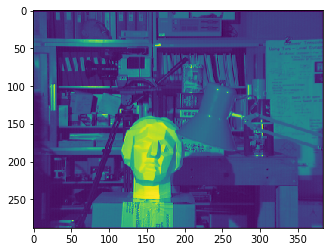

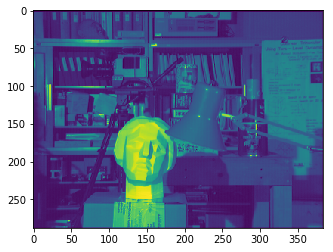

In [2]:
#left_img = Image.open('tsukuba1.ppm').convert('L')
#left_img_gray = np.asarray(left_img)
#right_img = Image.open('tsukuba2.ppm').convert('L')
#right_img_gray = np.asarray(right_img)

left_img = cv2.imread('tsukuba1.ppm')
right_img = cv2.imread('tsukuba2.ppm')
left_img_gray = cv2.cvtColor(left_img, cv2.COLOR_RGB2GRAY)
right_img_gray = cv2.cvtColor(right_img, cv2.COLOR_RGB2GRAY)
img_h,img_w = left_img_gray.shape
plt.imshow(left_img_gray)
plt.show()
plt.imshow(right_img_gray)
plt.show()

In [3]:
ws = 9
cen_ws = int(ws/2)
pix_srch_range = 30
dep_lvl = 255/pix_srch_range

In [10]:
ssd_d = np.zeros((img_h,img_w),np.uint8)
time_1 = time.time()
#count = 0
for i2 in range(cen_ws, img_h-cen_ws):
    for i1 in range(cen_ws, img_w-cen_ws):
        d = 0
        pre_ssd = sys.maxsize
        for i3 in range(pix_srch_range):
   #         lef_p = np.zeros([(2*ws)+1,(2*ws)+1])
    #        right_p = np.zeros([(2*ws)+1,(2*ws)+1])
            ssd = 0
            tmp_ssd = 0
            for v in range(-int(ws/2), int(ws/2)):
                for u in range(-int(ws/2), int(ws/2)):
                    tmp_ssd = int(left_img_gray[i2+v, i1+u]) - int(right_img_gray[i2+v, (i1+u) - i3])
                    ssd += tmp_ssd*tmp_ssd
#                    count+=1
            if ssd<pre_ssd:
                print(ssd)
                pre_ssd = ssd
                d = i3
        ssd_d[i2, i1] = d*dep_lvl
Image.fromarray(ssd_d).save('ssd_d_7_30.jpg')
time_2 = time.time()
print("Time taken by ssd :",(time_2-time_1))
#print(count)

487
716
864
863
816
635
683
652
571
596
571
552
359
539
499
420
357
144
1079
445
333
236
161
3675
828
204
120
105
6079
3650
813
199
123
98
9727
6028
3605
810
186
104
101
87
12469
9303
5682
3271
642
142
94
89
14473
10416
7126
3967
1572
153
14098
10708
7147
4117
1538
157
11591
10386
7390
4141
1641
152
9196
7688
6905
4217
1624
174
5585
5286
4136
3661
1623
164
2957
2017
1198
1171
139
900
660
621
239
132
582
510
454
259
97
1413
264
182
105
13454
1572
431
313
83
25477
17004
3080
1073
453
83
34304
25289
14092
2162
483
91
41059
33270
21501
12050
1244
91
41837
35583
24348
14759
5394
164
50817
36973
24679
14622
5607
170
45469
42576
25032
14646
5561
184
39993
34349
29868
14620
5360
201
37434
32021
25341
20380
5740
190
34622
26736
20391
13209
8020
252
35013
24473
17383
10538
3854
187
27349
24092
17120
10416
3617
171
21775
18892
17329
10629
3555
162
18711
13487
12430
11243
3585
147
27032
11214
7772
7163
4454
182
28723
15675
5905
4377
1670
115
30632
19102
10612
4402
1760
103
32964
22675
15521
10849


5569
2525
265
13604
9506
7163
2552
276
18098
16148
8551
2526
305
23159
19086
14111
3692
309
22965
18543
14006
4243
500
23241
21761
16261
11399
4388
509
16914
16047
11045
3867
444
11452
9995
3784
450
6638
6162
4791
3804
450
1331
806
495
2165
1290
1196
1112
855
184
4022
2182
993
819
667
186
4991
2437
1015
890
214
5262
2499
1082
258
6384
3756
2827
220
9064
4225
2561
406
7971
4874
2465
772
7518
3933
2562
918
7143
4194
2511
923
6470
4995
1496
877
5374
4201
4082
2874
885
11618
4955
3668
3210
653
29239
18859
8046
5021
2296
351
41121
31882
18752
6837
1872
341
57270
42940
30181
15241
3354
317
58816
47537
32247
17958
4588
685
63935
46820
30653
15611
3966
692
61456
51572
30781
15766
3608
683
44886
34255
15294
3735
679
35708
33462
22873
4578
551
19124
16794
5838
767
21887
20452
19463
4190
498
18897
6078
1075
12651
6804
1072
13003
8786
6746
1023
32488
9338
5039
1019
42669
38139
8703
6726
3104
887
51231
45309
36683
5585
3066
768
59438
58855
48349
38325
6507
188
64217
59044
48403
38265
10185
2045
759

25804
19330
12960
6674
475
120
63
27582
21575
15261
8811
2775
164
28615
22358
15577
9013
2869
217
22643
16097
9158
3008
238
17524
16376
10535
3120
280
14142
12517
10388
3764
395
11159
10133
6052
4676
1133
20345
9486
6014
4787
2986
1159
31536
22752
8941
7725
3208
1167
40181
30076
18770
9015
4117
1316
48982
40175
27964
18584
4639
1337
50095
42732
31741
21222
8832
1567
47668
39452
30695
20704
7607
875
36706
28446
19961
7028
801
23982
23795
16799
6722
733
14319
5675
572
4682
4110
504
278
209
184
165
117
69
62
58
47
37
43
31
46
33
30
47
33
23
965
179
43
32
24
22282
880
56
30
24
59277
23240
972
162
28
23
75779
58844
22303
871
39
23
83796
74465
56588
21161
585
105
81
78
66
45
86028
77019
63880
42283
11112
360
113859
101864
70091
43978
11575
884
121576
97174
51125
13766
1077
99448
63737
14568
1205
88806
69287
20142
1545
82297
79524
61977
50348
20943
1866
80153
77100
54819
29382
10549
1828
51402
48614
27681
10100
1355
22411
21172
20524
7927
1162
7551
7039
1020
1706
1612
1543
680
242
200
701
233

55
43
34
29
61
49
38
33
61
51
39
34
55
52
36
33
48
45
43
39
48
42
36
48
36
34
25
46
39
38
31
38
36
34
37
35
37
34
26
27
31
37
33
39
38
44
35
60
47
30
69
41
24
73
50
23
74
57
21
73
51
22
72
50
29
58
51
35
47
36
60
38
55
41
40
59
53
41
63
53
39
75
51
47
43
76
53
47
58
56
48
55
44
55
37
59
39
50
42
40
52
43
41
46
38
32
54
49
55
46
54
46
45
55
48
57
41
58
44
67
47
31
64
52
40
55
51
51
46
44
61
56
50
46
67
61
50
50
56
49
54
38
57
49
1436
1826
1669
1452
1318
1228
1191
1066
980
910
854
2162
1868
1828
1508
1291
1095
936
859
806
732
649
594
517
2158
1946
1571
1534
1436
1327
1256
1663
1432
1353
1274
1265
1100
951
1095
1069
980
939
855
394
1940
934
810
557
342
6589
1275
389
229
170
11328
6664
1332
340
180
130
17793
10945
6195
1137
245
179
122
23283
17381
10445
5979
1005
243
95
27913
20084
13828
7846
3254
262
27814
20893
13998
8254
3258
312
23231
20562
14391
8268
3380
322
18497
15456
13789
8472
3359
363
12020
11127
8944
7817
3404
359
6854
4674
2950
2665
300
2053
1443
1360
403
290
1083
1022
910
425

39
30
53
51
48
53
50
47
52
51
49
53
54
47
53
50
68
50
41
66
51
50
57
55
53
47
63
60
56
67
59
48
46
59
44
57
33
69
43
1485
1908
1721
1577
1356
1245
1151
1040
939
875
832
2244
1791
1715
1446
1261
1104
925
849
828
767
656
603
546
2251
1963
1577
1501
1414
1283
1234
1760
1429
1349
1339
1317
1086
926
1160
1106
1008
935
829
415
1892
984
818
582
363
6429
1220
414
250
190
11329
6534
1257
357
187
136
17704
10865
5942
1039
231
177
113
23462
17367
10358
5827
928
248
88
28257
20403
13932
7911
3250
267
225
28351
21255
14229
8370
3299
326
23808
20955
14527
8377
3372
337
18894
15897
14000
8546
3364
365
12486
11527
9314
7999
3397
369
7088
5028
4977
3190
2729
303
2127
2059
1607
1480
419
308
1045
970
441
186
1880
532
403
172
21894
1477
1051
138
49105
31566
5291
2759
1414
152
68481
51180
27291
4438
1532
157
85115
68283
44160
23439
2492
140
89878
76951
52869
32392
12965
154
106275
78176
52901
31827
13056
147
104176
92808
53637
31716
12388
133
91536
79859
64411
30956
11985
93
87493
75230
59885
44779
12540
8

965
797
578
415
6204
1075
405
243
218
11329
6436
1165
345
213
142
17835
10819
5726
889
209
175
106
23920
17661
10369
5744
857
243
89
28843
21017
14286
8056
3305
262
198
29150
21882
14658
8601
3379
332
24720
21710
14924
8624
3459
353
19566
16589
14453
8737
3447
376
13003
12161
9882
8314
3472
392
7375
5327
5297
3482
2900
334
2298
2036
1624
1544
467
339
1120
955
457
206
1727
541
416
184
20601
1161
1057
146
47964
30421
4865
2917
1500
160
67612
50515
26526
4368
1618
157
84458
67625
43466
22697
2371
143
89964
76960
52755
32290
12927
169
105239
77853
52679
31704
13005
164
105071
92703
53403
31549
12282
163
92294
80687
63925
30627
11909
126
88094
75970
60287
44345
12359
117
83224
67593
51515
36096
19848
154
78937
58546
41895
26453
9350
130
68807
59668
41863
26446
9346
129
52555
48248
42215
26710
9281
107
43760
34161
33036
27819
9438
115
57905
26042
19207
11183
124
59692
32718
12117
9046
3953
82
65577
39586
20578
9043
4056
81
70195
48867
31738
21752
4573
104
71299
49946
36448
27169
11479
144
80

78031
63385
48696
34106
18050
215
72995
54687
39207
24670
8600
174
65577
56133
39199
24789
8636
174
50068
46265
39577
25037
8543
138
41611
32869
31766
26050
8724
148
53146
25141
18689
10442
136
53391
29693
11626
8884
3949
91
58276
34976
18096
8881
3995
94
61430
42737
27705
19287
4364
118
62350
43296
31755
23855
9963
162
69912
40594
26748
22489
9827
171
59096
45534
22706
15958
7593
161
61250
47300
32618
15774
6528
163
81249
56955
42159
27955
6479
171
92388
65591
42349
27711
13231
235
89143
63797
39448
22886
7816
218
76929
63689
41195
24050
7768
198
61584
52657
41311
25723
8860
200
53387
40596
34639
28907
8865
232
53442
30113
20620
20259
11165
277
39998
23102
11057
10044
3937
199
47953
26414
19358
10057
3952
171
57586
37367
26658
22910
4735
184
58499
40179
30478
24205
9499
400
76360
39765
26529
21172
10311
383
63480
51028
25239
18053
7974
341
76077
55081
43871
18972
8018
337
90806
69158
49548
38382
8913
381
89070
68603
49485
30611
16617
616
90725
65072
45389
27641
11049
407
67698
64153
4

47815
33275
9001
181
65436
53227
40914
28853
14631
227
60721
45777
32706
20505
6944
202
56559
47254
32732
20653
7040
203
43527
39934
33021
20905
6928
149
36854
29056
27801
21826
7120
159
46505
23165
17397
8743
147
46453
26796
11582
9000
3935
102
50273
30939
16546
9016
3958
97
51282
36732
24216
17049
4177
125
51693
36304
27426
20788
8625
171
56486
33419
22296
19610
8462
181
46983
35926
18065
12872
6446
168
48351
37144
25257
12556
5201
167
65135
44876
33135
21638
5067
172
75655
52744
33489
21872
10159
226
72798
52205
31736
17875
5902
201
63880
52192
33675
19012
5871
180
51570
44184
33816
20813
6908
185
46057
34943
30119
23873
6904
233
52279
27475
19233
18481
9187
302
42862
24676
11462
10144
3784
234
51722
28505
20323
10113
3861
209
62259
40763
28782
24108
4620
218
63353
43952
33330
25975
10039
467
83766
43898
29297
23139
10832
446
71357
57105
28157
19840
8612
391
84655
62103
48817
20913
8660
382
100080
77043
55687
42083
9559
426
97877
75623
54856
33872
17846
740
99371
71667
50053
30202
1

3862
3597
1553
168
4496
2958
2535
835
173
4904
3960
2490
727
130
6141
4098
3650
2370
1741
159
11163
4125
3248
143
11075
5416
3627
349
14187
6577
5645
357
16453
6698
5731
614
16244
7535
6922
1127
17290
7833
5738
1166
12734
7947
5162
1214
11171
7419
2654
1079
8621
6177
1064
18183
5829
5819
829
37293
23869
6823
4393
306
49642
41671
25793
7847
3485
311
70106
51884
38719
19659
3553
265
84753
64010
43570
26469
9315
665
91851
63178
39537
26225
8756
808
84056
67984
42573
26750
8922
913
67257
54081
46895
31052
11265
991
54722
35943
11176
1071
34550
26804
21027
1236
26969
23328
14023
1193
22362
20885
1621
17192
1533
16204
15321
1457
58062
17847
14166
1310
74565
59256
16287
9602
1193
85328
67308
51419
6530
753
100229
87506
69854
53805
6898
191
103748
86643
69028
53896
16753
2438
140006
113898
76191
58840
21658
2423
100720
82999
58864
21745
2621
96020
88105
68418
22025
2580
88555
78355
57922
27291
2648
79810
55896
36324
29737
23076
3514
93146
61111
36675
29015
12020
1857
65641
48904
33889
25665
72

56854
40369
25308
9470
603
83457
56438
36594
28037
9478
788
75243
59805
41630
28156
10169
984
62200
44666
44098
36537
13095
1082
52562
27740
13419
1297
36839
22262
1383
27556
21225
17310
1544
23560
22742
1952
19333
1772
16308
16091
1676
58196
18629
14984
1394
73603
58390
16555
9383
1333
83715
65652
50367
6540
782
98803
85634
68395
53168
6709
204
101594
85104
67825
53434
16889
2332
130417
108071
74583
58320
21805
2314
90228
79800
58356
21925
2532
82598
77541
65899
22141
2498
72965
66023
50366
26244
2548
61598
43589
28887
24578
22070
3126
71711
47110
29073
23753
10770
1484
48894
35464
25339
20388
5966
1719
62921
36630
34550
24919
6222
1500
76346
52296
35307
34887
12560
1529
68722
48421
33547
27140
8724
2591
63122
48812
33983
24703
8380
2092
51030
46453
32927
25304
8518
1633
59420
38619
34360
25940
8217
1399
70011
44380
23653
9770
1431
52288
35034
15009
8108
3213
1713
58874
38779
26137
12676
2779
640
64194
43118
28799
21577
5616
697
67682
41481
28547
21140
5518
1085
66626
44022
24021
1934

523
323
65
925
798
512
338
68
741
651
404
350
68
561
557
239
232
76
496
356
224
81
486
414
110
491
396
158
129
564
410
182
416
179
362
163
161
236
152
188
179
157
114
230
204
188
118
107
120
107
125
121
99
125
122
103
121
118
108
95
94
87
69
41
50
49
46
35
45
40
35
45
38
37
34
33
45
37
29
26
60
49
48
45
40
64
46
40
65
54
43
58
45
44
62
43
62
38
46
25
37
33
32
31
42
29
26
52
38
30
48
43
30
47
44
34
29
53
50
43
32
57
56
50
33
56
43
59
47
58
55
52
57
51
58
51
45
53
45
46
39
36
35
33
35
34
32
38
37
29
46
41
27
51
49
32
51
43
34
54
50
36
57
51
37
58
51
47
46
45
43
38
37
45
41
39
44
42
37
44
32
46
33
45
37
47
43
37
46
45
37
51
40
39
38
35
32
36
28
26
26
33
34
33
34
31
36
27
39
36
26
40
38
24
29
25
37
36
30
56
37
36
69
49
42
64
45
69
52
48
47
72
60
55
47
70
57
52
43
59
46
38
50
45
40
34
53
49
41
38
53
52
47
46
54
50
51
48
46
45
49
43
45
29
42
25
42
26
43
27
44
32
38
36
3224
4254
1399
1087
979
835
828
821
790
648
625
612
574
5092
4543
688
542
438
428
422
346
253
249
5227
4066
2779
1548
1482
12

36
48
46
42
3550
3455
4788
4574
1173
904
796
677
629
542
532
487
479
5758
4893
4499
470
356
275
274
233
210
162
5994
4725
3160
1243
1200
995
984
902
873
772
629
575
557
5450
4722
2991
2126
3872
3732
2956
1705
932
2720
2600
2320
1688
735
368
2409
1717
1379
1221
739
256
10272
1353
563
417
357
185
22169
10454
1053
307
163
33231
21241
9326
807
181
95
44073
32766
20606
9475
798
186
110
52030
39913
28318
16964
6207
216
206
51844
40848
29111
17948
7122
505
43047
40291
29021
18034
7165
543
31021
30858
28182
17920
7139
558
20273
19935
17451
7081
588
9503
9060
8845
8786
6458
536
1467
1367
1061
517
864
655
243
210
812
219
192
177
703
175
144
1224
850
157
1793
1705
1185
147
1831
1763
1184
133
1724
1652
1048
143
1696
1664
1508
1030
116
1785
1735
1523
1301
431
125
956
754
726
586
410
118
351
212
74
442
352
209
91
882
577
205
198
96
88
6084
1272
299
227
94
68
8332
5825
801
430
88
61
10325
8294
5661
1027
258
104
63
14588
11338
9299
7428
1492
111
14919
12091
9637
7936
3345
107
14993
12452
9974
8930
388

13228
2561
223
35640
27946
19636
11702
5068
351
35684
26610
18110
10352
3464
288
27424
26071
17989
10445
3395
267
21414
19279
18032
10440
3440
246
14184
13167
11130
10653
3451
245
6267
5667
4696
3661
3122
282
3355
2345
1763
1398
505
154
3107
2422
1848
1390
513
126
2797
2130
1723
1271
465
120
2098
1756
1253
1196
416
126
1330
992
798
541
364
148
982
816
612
506
235
84
839
655
501
375
177
118
557
365
331
113
680
397
335
279
115
83
1863
711
264
98
68
2609
1600
406
171
91
61
3258
2598
1533
447
82
58
3798
3008
2304
1325
223
88
56
4068
3470
2720
2076
641
73
4262
3972
3368
2812
1360
103
3450
2873
1475
109
4169
3491
3016
1478
120
4639
3797
2943
1524
108
4586
4275
3241
2383
1422
118
4943
4363
3418
2330
1104
185
5422
4717
3403
1900
622
166
5898
5243
4868
2772
633
161
23340
5782
5175
3680
996
177
44540
29050
7076
4449
1082
212
51288
50105
30347
6427
1808
251
62519
53182
43317
21003
2109
270
82700
58281
43596
27747
10415
585
88680
58585
43838
37139
11334
1034
73010
58265
50900
36829
13334
1587
5765

531
9591
8497
8128
2711
556
8595
8365
7733
7557
2738
587
8028
7109
6333
2227
570
4637
4491
3612
2218
542
756
741
603
432
276
2437
864
653
585
280
228
7441
1858
573
538
252
185
10181
6373
1364
537
216
152
10371
9366
6196
1503
232
125
10038
9200
9017
6259
1118
121
11577
11273
9805
6294
1562
409
13440
8322
1671
429
10877
10393
2497
450
8345
2502
584
8302
7908
2475
599
8626
7791
6963
4576
1664
628
7210
6294
4831
1506
330
3847
3163
2639
2626
1438
359
1396
1120
608
601
313
4614
1555
1227
829
591
196
9206
4486
1279
897
697
179
11289
8477
3719
932
606
164
11216
10683
6925
2897
382
126
13365
10762
10475
5731
1881
116
23727
22411
15752
1883
583
26948
26137
20293
8425
1625
23496
23041
20660
10987
1642
28292
19223
12639
1670
40125
33007
17764
12652
1680
39628
28939
17492
11375
1644
31018
19627
11908
1281
28508
25337
15859
226
51506
13886
270
44297
30493
344
62861
30421
379
75422
73464
30147
391
76651
74324
29751
304
72722
31766
333
61901
60470
31621
433
82808
51323
15399
374
61817
18427
343
48147


136
109
83
67
90
74
54
129
125
83
79
106
83
140
94
74
154
130
103
153
146
96
92
149
145
83
52
104
67
45
106
98
70
66
51
81
72
70
62
126
65
234
211
64
624
323
132
53
740
529
208
181
54
784
723
554
283
68
62
941
809
688
571
92
82
1220
933
791
584
205
102
1637
1607
1178
966
263
100
1465
1431
1086
356
97
1419
1099
414
84
1378
1305
1077
1043
445
80
1297
1264
1027
785
413
87
1078
1031
932
366
94
651
531
313
113
1364
405
303
222
111
1687
1569
390
320
164
131
2140
1775
1265
330
108
2486
2319
1482
1336
205
127
2449
2190
1443
1202
398
163
2377
2202
1475
1220
501
183
1487
1243
518
199
1237
976
518
179
867
464
180
549
447
341
180
558
390
368
185
538
380
112
541
365
137
684
624
386
150
910
500
474
158
2659
936
518
454
150
5998
2931
606
506
158
6032
5177
1814
527
153
13642
5174
4305
1848
155
18280
13455
4307
3904
1193
188
31121
23994
20107
5409
1308
173
43286
39756
33447
24320
3894
159
42990
39920
36374
26173
8412
552
43291
37839
35583
26255
8918
515
35668
33161
24907
8953
488
30749
29492
22851
7901

2111
1228
200
3414
2770
1929
1225
200
2986
2703
1849
1020
176
2028
1829
1039
160
1392
1153
1032
162
740
533
276
157
721
403
168
121
53
1010
738
290
253
50
1159
828
388
270
67
1189
925
448
336
80
1037
912
466
329
81
887
711
456
350
73
727
647
397
354
80
443
287
215
80
300
199
67
262
105
92
287
278
123
105
320
310
129
117
253
117
110
244
123
103
228
199
126
242
210
75
295
283
255
130
97
208
122
112
198
120
92
189
112
80
168
104
65
127
107
104
91
42
29
40
30
40
32
39
37
33
30
27
39
27
45
26
43
29
40
30
37
35
29
48
41
36
56
51
33
47
46
35
52
45
35
50
46
35
52
44
35
48
37
36
27
44
35
31
57
43
32
53
36
33
31
57
40
36
29
59
46
37
28
65
48
41
31
25
51
48
33
28
38
31
30
29
43
32
31
26
40
39
33
25
40
34
30
26
29
23
22
21
30
24
20
41
28
26
21
35
34
30
24
35
29
28
27
26
39
32
28
27
40
37
34
30
29
39
38
31
41
32
31
49
40
39
34
50
37
36
43
40
38
41
36
43
31
31
27
41
33
47
35
53
43
37
57
43
37
58
45
57
47
39
51
43
38
38
37
37
43
38
34
46
43
35
39
26
45
29
49
44
36
43
34
44
36
35
32
51
41
35
28
50
33


35
51
46
35
56
49
37
62
51
40
56
52
38
48
44
40
35
29
48
36
32
26
24
47
35
32
28
24
46
32
29
43
35
42
33
34
33
40
32
63
56
50
43
64
49
39
34
62
52
33
64
59
32
28
65
61
41
32
64
47
46
40
38
33
43
38
47
37
47
35
43
39
47
43
4382
3161
3133
3123
6397
6362
3517
717
481
438
396
382
8137
6783
5950
3285
149
132
8927
7261
4953
537
515
476
474
441
403
363
8570
7097
4959
3259
2979
2881
2680
2616
2519
2435
2415
2347
6401
6203
4914
3040
1540
4746
4437
4267
3002
1430
286
3051
2849
2544
2388
1393
207
7490
1068
914
635
180
21101
7137
469
121
100
32888
20679
6611
349
81
52
46245
33284
21031
7107
437
109
70
56832
43557
30644
18303
5061
139
105
58858
46478
33439
20754
8349
485
52684
46402
33480
20841
8514
521
38319
33135
20895
8584
543
26973
26495
20727
8571
558
13619
12746
8218
514
3184
2976
494
882
599
384
146
761
672
231
113
715
484
95
679
557
130
1634
1538
1006
128
1546
1031
123
1505
1381
940
138
1512
1427
1297
932
148
1514
1400
1221
1019
594
152
1104
915
867
770
512
117
174
99
60
147
57
30
309
64
33

7844
4191
305
6275
5916
4773
3987
225
3781
3307
1698
1195
179
3741
3407
2003
1208
821
147
2175
1634
1102
686
175
130
2082
1763
1028
754
180
135
1969
1515
1066
559
191
159
1880
1810
1164
729
186
140
2095
1576
1224
716
225
158
2331
1866
1141
861
263
138
2511
1885
1172
657
249
145
2340
1822
1140
669
250
128
1808
1567
971
631
228
127
1251
1087
728
504
200
135
844
813
519
432
164
136
556
446
283
255
110
372
200
93
333
324
206
180
69
312
185
63
425
338
218
193
69
623
570
285
90
78
786
601
370
261
97
923
769
428
353
96
1048
797
465
384
129
1124
933
516
430
139
1221
940
611
482
184
177
162
1470
984
589
530
167
1774
1286
602
523
184
181
157
1943
1844
1170
554
179
176
1945
1131
193
160
2077
1581
489
151
3293
3012
2762
2387
556
136
4432
3923
2869
998
137
7765
6645
5211
3760
1438
153
23395
10375
5573
4521
1652
152
31084
29932
11312
4682
1928
133
55629
38804
33046
11688
2602
130
113029
67971
43714
32238
6786
202
119930
99416
58284
37869
10451
1291
122463
101129
74569
44237
14286
1508
110791
99232
7

31
25
39
35
29
34
39
32
27
44
36
32
76
57
39
32
67
57
31
64
55
30
62
54
34
56
55
40
39
49
48
34
18
30
33
28
43
29
51
27
67
44
6342
3180
8700
6852
5809
5122
3360
895
654
605
589
10461
8299
7418
5929
4752
3551
362
11247
8763
5979
4749
784
745
690
658
615
10599
8755
5975
3847
3632
3348
3143
3018
2802
2768
2677
7343
5918
3560
1664
5164
4844
3573
1547
223
2907
2882
2652
1563
161
5882
873
672
141
20670
5608
289
160
130
91
32899
20199
5099
238
95
69
62
46625
32892
20198
5366
229
110
74
58139
44349
30712
18070
3988
113
82
61528
48480
34850
21659
8895
437
56740
48579
34887
21729
9064
462
41154
34737
21747
9139
476
29458
29032
21759
9137
495
15763
14957
9010
464
4357
4146
497
908
668
436
168
855
729
319
163
833
491
149
610
166
1482
935
164
1451
1000
134
1412
1374
891
153
1373
1333
844
146
1374
1178
904
570
139
1086
1011
941
829
403
125
220
147
101
148
54
35
245
69
38
5060
490
106
50
8394
4391
163
51
11358
7774
4171
395
205
129
65
14890
11886
8790
5659
511
109
16025
13399
10723
7951
3250
110
1651

294
273
110
430
238
96
326
235
211
88
224
188
86
135
89
78
110
96
86
161
131
84
212
122
78
295
286
106
94
342
151
101
716
430
302
283
123
1735
753
319
130
128
3323
1627
519
391
167
154
138
4444
3178
1516
560
178
170
4792
4511
3205
1485
375
107
5115
4468
4129
2259
689
103
5687
5012
4217
3222
796
100
4942
4936
3417
1270
116
4693
4591
1860
111
4582
2187
102
8460
5546
5073
2176
113
18993
10158
6222
5863
3531
104
63540
27495
12670
8448
3595
125
74896
64350
26691
13170
4754
225
76092
69364
50854
19119
5242
314
88559
73993
56907
40875
8164
537
96799
79857
66267
44407
14385
1116
92982
81648
71214
64866
21612
1244
52073
22231
2197
46670
36094
25210
2358
44287
30073
24215
3009
31432
24898
21178
2974
51594
17523
14805
2393
62563
41425
16416
15666
5936
2264
71173
54790
37510
11883
5167
1299
85445
67527
55806
39112
1399
1163
91412
73157
59919
46640
17840
1809
95155
77311
64224
52060
20667
1845
62880
52197
20645
2372
47175
46976
20609
2441
35619
31089
20552
2421
17090
14734
12052
2267
12825
11018
92

32138
574
84976
53524
15963
583
63553
18715
558
48589
20325
889
44806
20657
897
44735
41298
24304
8542
890
32123
29904
23871
7205
559
9810
8932
5015
487
839
778
474
292
269
200
135
54
47
49
47
48
50
47
120
55
50
1116
163
51
38
3419
1379
110
37
4623
3245
1043
142
30
5683
4562
3074
1182
47
38
8186
5171
3836
2432
576
129
79
8131
5942
4093
2502
726
120
7148
5999
4456
3137
884
108
5084
4632
1000
261
3973
3631
2024
387
3404
2784
2462
399
939
397
994
405
1199
1164
426
1868
1194
1037
515
279
2383
1738
966
443
167
2307
1742
1009
471
158
2498
1907
1222
723
155
2493
1967
1248
787
230
168
2314
1980
1248
775
234
157
1666
1551
1131
689
230
149
1062
892
676
212
137
641
626
501
207
139
412
389
171
119
402
386
145
593
561
282
143
331
292
134
481
346
286
133
667
453
304
281
136
672
432
347
281
138
625
616
568
416
195
111
86
395
119
104
59
601
573
114
47
522
220
182
88
387
233
170
80
828
410
237
168
84
1379
708
310
234
175
83
2162
1537
788
538
159
84
2521
1859
1222
533
175
81
76
2519
2217
1585
952
283
11

8516
7089
4013
2001
751
274
9458
8139
4424
3438
936
374
9001
8014
4749
3260
1192
494
7946
5126
3655
1268
420
5676
5585
4308
1423
510
3447
1348
545
2702
1168
591
1406
1090
579
1179
841
503
1050
661
454
725
439
367
528
281
282
256
175
114
52
168
43
344
187
52
601
476
99
52
48
912
574
251
158
59
51
1229
921
415
328
63
60
1441
1004
526
340
87
1385
1059
546
352
84
1211
1055
569
328
82
995
764
520
336
77
702
645
368
70
381
378
259
200
64
160
35
135
75
167
72
140
93
218
182
96
234
152
99
240
190
104
242
215
69
244
143
100
246
244
125
81
153
125
77
139
114
72
119
115
71
124
107
103
71
84
56
59
41
46
38
42
34
38
37
27
26
35
34
32
42
42
39
50
36
42
34
40
33
48
36
40
30
59
36
60
42
32
55
45
28
71
52
38
30
67
39
34
65
47
38
49
45
41
34
50
45
44
38
37
34
50
38
36
35
34
38
33
40
36
29
46
37
28
40
34
32
30
41
39
28
60
46
38
28
54
46
45
28
55
54
44
30
56
55
49
40
31
56
43
35
34
59
45
40
36
42
41
45
43
46
41
40
34
40
39
41
35
40
29
44
34
45
34
40
28
40
33
38
37
27
40
35
28
35
33
32
30
40
36
30
37
35
30

3612
186
151
114
101
31859
19288
3074
138
101
96
47123
32618
20155
3641
107
60838
46892
32565
19694
3146
114
67178
53757
39829
25626
11663
515
64378
53838
39865
25631
11858
517
47814
39864
25675
11965
512
36302
35383
25759
12004
528
21065
20111
11987
508
7351
6531
527
989
849
806
575
95
924
782
415
116
842
433
120
381
135
1169
814
136
1341
970
128
1358
792
123
1355
750
109
1372
1350
1210
930
616
111
1212
1144
1100
964
392
96
419
284
204
104
196
74
52
228
140
125
55
47
5667
374
147
61
45
10588
5067
162
86
43
14282
9463
4364
243
218
101
98
18693
14346
10079
5706
325
88
21023
17200
13401
9704
4129
70
21637
17684
13585
9884
4195
156
16508
13637
9776
4205
222
12080
9866
4205
216
8802
4072
237
4542
4248
3979
232
2433
1844
1070
570
199
3440
1555
876
542
140
6878
2487
866
537
143
139
6710
5564
1609
422
131
7401
5669
4733
1222
133
7271
6596
4832
4140
821
148
8916
8698
4749
1097
260
10089
2504
252
6338
4167
279
8036
5092
283
7345
5092
292
8400
8177
4416
288
6904
6499
5474
4115
199
4432
3658
2351

1652
1142
83102
67616
56900
45398
18757
1552
87239
71588
61042
50932
20526
1791
59427
50917
20575
2307
55543
45579
20579
2371
59116
42041
34771
20527
2377
54207
41082
25531
17815
2219
60911
48885
36458
23405
3243
1050
57117
50786
38362
24935
8706
838
65344
58437
38500
25086
8745
334
52162
46299
25172
8868
275
38230
30446
8937
309
25820
15075
312
14998
14224
387
16908
9663
309
8420
306
7548
7401
310
6972
279
6338
3295
300
2734
2148
173
266
141
134
125
339
70
59
426
195
162
64
51
531
327
321
50
49
610
590
361
346
106
47
643
617
381
356
113
583
402
376
109
393
344
114
321
294
111
232
215
184
129
97
377
278
177
98
93
397
299
154
102
95
475
434
304
203
112
107
548
477
366
280
105
102
575
490
393
342
176
95
557
506
365
163
107
994
429
336
315
144
129
2294
1249
334
315
132
2323
2152
807
302
123
3063
2380
2149
1138
123
5780
3600
2205
1946
565
172
145
120
99
10920
9032
5516
2147
604
149
15914
15224
12086
6294
1063
134
19809
16684
14782
9232
2480
153
34887
16782
14239
9391
2719
143
43268
27161
1

211
94
60
53
49
270
136
59
42
308
175
68
40
286
179
67
54
261
174
65
168
134
57
138
134
51
85
80
46
43
37
35
45
39
30
53
36
34
24
52
35
22
46
32
45
35
30
50
39
27
54
46
32
63
54
39
64
56
50
45
44
61
50
40
56
48
44
53
43
41
48
30
36
23
33
24
39
26
25
54
30
21
70
32
25
78
36
26
82
47
29
88
51
33
83
54
41
76
52
41
60
49
36
62
52
44
61
59
50
64
54
66
51
49
56
53
49
58
53
52
49
45
42
36
92
35
3858
233
53
31
25654
3518
105
38
40689
26350
3808
223
35
57050
40185
25208
3350
57
54
51
70073
55429
38044
23455
2721
136
134
71934
56850
40284
24817
7046
736
68846
57145
40955
25077
7768
713
47069
40932
25042
7846
687
32127
31065
24944
7878
686
15793
7853
695
2781
2069
1778
711
900
643
432
104
430
247
216
176
117
582
204
177
91
2264
687
488
203
58
4499
2542
647
556
85
5848
4015
1768
559
148
133
7545
5417
3302
1681
168
9023
6509
3889
2226
503
316
10428
7638
4786
2430
591
318
9508
8557
5409
2897
619
330
7421
7258
5819
2983
745
383
6105
5212
3227
695
367
4921
4088
2335
706
382
3674
2221
434
245
2547
2410

550
237
234
233
990
936
609
249
908
556
217
946
857
581
207
1035
992
589
206
467
252
149
478
434
232
174
150
308
214
91
264
208
82
210
184
66
89
77
49
77
54
48
59
34
56
36
40
31
38
28
34
27
31
29
31
34
45
39
49
42
40
50
46
44
38
62
46
43
39
62
45
43
39
58
54
40
28
54
46
41
33
62
46
34
74
52
39
31
67
60
56
50
38
28
75
65
55
34
80
54
39
76
55
49
40
65
53
51
46
42
58
47
46
44
56
36
55
35
31
47
33
32
46
30
55
33
48
36
28
48
42
32
38
24
38
37
29
39
38
30
38
28
49
39
38
1237
1688
2257
2878
2363
2045
3013
2351
1616
2718
2176
1590
1113
2412
1946
1510
1030
661
2184
1623
1233
951
495
304
2726
1295
806
610
362
182
18717
2397
466
223
107
91
31406
19105
2077
278
91
87
48209
33878
21097
2633
104
64921
50841
36036
21859
2495
110
74711
61429
46813
30974
14957
551
73600
61250
46746
30926
15097
572
57102
46652
30962
15156
557
44976
43417
30923
15159
571
28068
26223
15145
563
11121
9736
588
1107
984
922
493
119
1060
915
413
118
909
474
124
249
113
1008
801
108
1400
1066
96
1421
859
93
1415
797
82
1429
14

1749
159322
153354
119806
65091
27659
1845
121412
120200
119306
65100
26757
1383
70989
66810
62420
26884
1341
59377
36720
33843
28655
26749
1351
51104
40281
20420
4161
927
65031
53497
36110
14881
5212
672
74282
63159
44943
27644
11059
628
73120
62293
45152
27916
10453
1342
65060
62224
44249
26666
9066
1413
44076
43067
25394
8637
1449
24860
24451
24270
8523
1398
10810
10414
8277
1190
795
603
223
218
209
150
126
108
91
88
79
85
81
79
71
83
77
66
86
72
62
48
47
83
71
49
66
56
44
60
38
55
52
30
47
37
65
54
53
45
57
50
34
65
63
52
37
76
67
58
46
87
66
65
58
50
97
73
60
59
51
108
89
56
48
116
88
58
49
48
168
115
78
51
177
108
88
56
175
126
87
66
169
128
85
145
108
89
84
78
120
100
89
88
84
71
62
55
50
50
48
45
53
36
58
49
43
71
50
39
75
51
42
82
63
50
77
75
61
81
74
61
83
59
57
48
83
68
57
56
78
76
54
77
67
58
83
50
73
59
56
63
60
58
63
55
51
58
61
60
60
57
57
48
47
62
56
47
56
55
34
43
39
38
43
39
42
46
48
52
50
43
61
46
83
52
44
2090
199
70
45
13761
1925
102
53
21892
14046
2034
195
62
55
3

70
51
48
27
40
23
36
25
30
27
32
28
32
29
47
37
55
40
57
42
52
53
64
61
54
50
56
62
52
65
63
58
65
66
60
69
81
75
68
66
60
48
47
45
50
75
85
177
177
178
384
609
530
382
828
611
422
1071
759
548
315
1293
810
492
309
192
1575
1012
549
301
130
9403
1411
614
299
103
15565
9372
1062
395
114
74
24140
16792
10419
1229
112
32877
25667
18141
10920
1050
119
38650
31875
24453
16269
8014
352
38368
31707
24410
16264
8064
373
30430
24321
16258
8086
400
24467
23499
16190
8085
429
15688
14485
8096
423
6718
5805
456
733
621
330
238
691
610
331
259
592
387
258
258
240
742
549
235
1042
724
223
1044
636
220
1057
602
205
1103
1049
943
541
220
1000
931
409
245
583
395
277
464
265
262
243
591
483
256
239
206
3009
589
399
272
187
5643
2752
704
678
285
268
7489
5233
2638
778
502
267
9958
7560
5550
3027
505
279
12314
9921
7727
5745
2578
266
12567
9980
7869
5815
2555
328
10735
10229
7978
5933
2597
351
8488
8239
7707
5512
2467
345
6964
5953
5796
5400
2239
326
4655
3827
2942
2235
314
2326
1608
906
541
168
2782
141

197
813
371
215
186
700
394
276
184
874
697
661
296
155
843
612
233
232
770
587
408
227
434
404
144
381
379
135
326
60
71
63
37
77
57
25
83
64
30
103
59
31
107
54
37
35
144
62
38
152
57
36
35
179
85
45
31
194
94
43
22
190
104
54
42
213
110
56
53
229
123
59
53
214
154
63
59
192
147
59
184
158
74
169
150
77
73
144
139
79
65
269
239
137
80
268
104
67
279
218
142
66
267
205
57
270
212
131
123
67
311
285
254
159
119
138
109
136
127
113
117
153
103
75
172
152
118
79
271
171
97
85
66
489
313
113
39
767
703
377
151
37
1726
984
738
408
42
3629
1959
1027
783
303
117
71
3833
2472
1140
784
306
140
4085
2654
1619
885
309
157
4341
2864
1763
1330
392
186
4113
2602
1557
1332
499
187
3172
2355
1196
1101
612
177
1242
925
774
369
170
1034
901
825
810
373
174
664
361
155
198
181
154
134
143
135
157
143
126
149
117
116
109
133
122
109
118
95
128
118
101
141
112
111
171
130
102
101
239
120
95
328
265
111
84
1735
327
114
65
9703
2030
164
129
51
16865
10012
1883
167
36
24198
17989
10384
2181
77
30144
24729
18

554
166
1467
1211
1019
555
173
947
519
165
298
171
256
150
204
201
197
142
208
198
154
141
173
155
126
171
165
119
161
145
101
190
160
104
239
164
114
106
294
285
184
110
96
384
359
180
103
1238
376
165
91
9550
1081
175
77
32431
10172
997
181
66
51579
32981
9902
887
51
70733
52979
33329
10092
757
217
80279
66601
48207
27673
5656
241
82033
69232
53096
33188
11104
333
82577
76167
57062
37926
13098
546
63503
59804
40617
15749
549
61500
54674
43361
16734
584
57227
46026
35182
17887
544
59615
43309
27878
23838
15247
527
65555
50205
30873
24632
13204
465
66450
52147
36959
29395
18040
242
63543
47206
34001
27269
16179
246
46432
42538
28165
23928
15610
246
31511
31279
26463
19744
13799
285
19501
18869
16785
11634
313
11158
10797
10535
8243
332
1439
1377
884
350
519
276
695
557
86
661
95
1077
819
113
929
138
1072
888
335
1813
1283
841
800
356
3511
1916
936
911
337
5571
4559
1902
1388
830
323
5345
4298
2003
721
277
6398
6039
5576
3808
1161
263
7057
7043
5566
4027
1807
242
6669
6370
4399
1520
296

511
2098
1369
958
379
1570
1033
466
1671
1546
1301
469
468
2074
1692
1201
1033
572
444
3917
2381
1865
1176
596
325
5087
4298
2214
1548
701
295
6244
5552
4459
1681
759
196
6899
5969
3842
834
238
6770
6584
4334
1741
137
6509
5257
1823
222
4752
2087
205
3506
2348
266
2973
2240
286
2632
2019
355
2506
2377
1088
399
2254
1729
1283
928
549
2296
1739
1014
838
608
2060
1685
980
837
445
1479
1054
743
620
525
2224
1105
672
621
574
3200
1850
787
632
569
4002
2300
1102
665
526
4434
2765
1229
731
530
4816
2930
1329
505
347
4810
2929
1345
492
214
4174
2698
1259
545
216
3459
2162
1092
475
251
2881
1836
893
471
304
2543
1513
734
411
315
2534
1333
601
348
307
2615
1385
594
420
337
2619
1457
615
454
422
2891
1853
953
623
380
2854
1938
1126
688
346
2641
1759
1069
653
309
2144
1807
1055
705
303
1715
1595
1102
656
292
1257
1048
757
261
765
750
645
565
314
833
568
367
302
961
780
385
311
1023
715
396
318
1297
775
329
313
1564
979
351
263
214
1501
937
390
254
196
1380
926
378
279
195
1392
878
382
310
193
1361

40
63
48
42
38
65
51
42
63
48
41
53
47
43
53
45
38
48
42
34
42
37
46
44
40
49
46
45
51
50
48
50
50
45
41
40
37
36
37
32
38
28
51
41
40
34
49
44
34
67
64
40
70
64
43
66
47
65
38
54
36
53
38
37
32
34
45
33
45
41
38
43
40
37
43
42
38
27
46
43
41
35
33
52
51
40
33
54
46
41
50
43
40
56
43
39
56
48
47
46
56
40
42
30
41
36
34
33
31
34
28
27
25
23
30
25
33
31
30
41
33
30
27
39
35
32
50
45
33
32
46
35
45
34
47
45
32
41
39
36
34
33
49
37
34
32
38
35
32
38
30
29
27
41
31
29
27
23
41
33
28
48
38
34
33
30
42
40
32
60
51
27
58
48
28
56
49
27
55
48
34
30
61
55
38
34
168
59
58
46
40
1256
291
56
48
43
42
2034
1305
166
165
53
46
44
2723
2091
1206
271
52
51
48
3349
2671
1893
1188
141
60
59
55
3627
2997
2185
1545
678
143
135
124
4484
3101
2287
1667
753
188
4452
3342
2311
1683
791
189
4258
3589
2693
1690
792
208
4677
3184
2565
1847
830
220
15959
4060
2449
2190
1222
215
24291
12006
2359
2006
827
233
31619
21269
11198
2067
890
227
43517
30054
21436
11889
1218
219
54095
38711
27512
19366
8309
200
53270
38997


15870
7114
210
18798
15637
7919
231
9814
9729
7653
209
3152
3004
251
3178
3053
2787
278
3426
3003
2662
332
6439
3013
2600
369
8753
7175
1179
367
11008
8976
4926
2540
2455
384
13397
11377
6879
5761
2363
344
14470
12786
8798
6898
3916
296
18034
13489
8925
6691
4133
269
17725
17561
9934
6654
3524
274
14989
14986
13624
7135
3335
229
16518
13484
12173
10587
3894
186
15060
13708
10356
7541
5241
182
14212
12840
9982
7334
2901
249
11178
10757
9153
4027
264
10353
10150
6900
250
10003
8402
7418
281
6650
5274
271
6301
5724
5283
279
6474
5354
3791
189
6112
5554
3016
155
4330
3409
1085
189
5090
3556
1209
182
4471
3537
1093
224
4137
3493
935
244
4094
3380
982
309
3622
3335
1095
299
4104
3670
975
297
3439
1233
292
3436
1613
332
4023
3809
2156
339
3322
2114
349
2865
2026
355
3913
2333
1852
357
7597
4496
1756
385
11433
8132
3891
1799
1476
360
5912
8194
11537
10766
14339
13079
9725
15562
13467
10333
9075
17911
13654
10633
7521
6277
18516
13574
10831
7294
5028
1896
20178
14282
10730
7451
4608
922
20712
1

166
151
59
285
167
54
304
300
181
60
845
354
212
52
5997
1052
217
191
58
8183
5818
789
212
74
42
13567
8420
6143
980
85
62
18116
13366
8589
5688
613
144
88
22717
15830
11820
7365
3146
161
23369
16459
11916
8498
5235
152
21659
16760
15436
10411
6319
226
20143
13400
11971
6908
290
14793
10861
10106
7779
338
13013
7261
289
9983
6448
5512
354
9994
7092
6355
5755
368
8295
6480
3582
347
8233
6696
3609
286
8339
6700
4617
3956
3640
287
6230
5401
4248
4061
2686
296
5264
4413
3688
1928
209
5035
4465
3987
3002
237
3703
3094
219
3189
2846
253
3425
3030
271
3661
3503
3502
322
6261
3300
361
8186
7016
2061
329
10585
8690
5350
3003
2699
332
12814
11115
7096
5860
2549
285
13142
12117
8476
6409
3637
230
14846
11762
8145
5648
3445
203
13015
8149
5430
2829
200
10912
9778
9536
5298
2727
188
11418
8728
7312
7076
2828
147
9300
8074
5794
4104
3584
168
8830
7009
4847
3769
1759
211
6801
5358
5026
1934
206
6244
5754
4794
208
6102
5718
5415
267
3984
275
4139
257
6032
239
7960
7052
6836
243
8022
7062
4716
262
8342

246
336
293
242
601
465
222
803
583
329
977
901
541
316
1022
909
667
579
369
1106
932
675
529
305
1095
805
614
312
855
679
336
671
430
547
484
440
485
408
469
409
479
395
360
523
445
269
818
498
302
287
1070
714
396
234
1176
753
415
207
1126
749
406
374
212
1065
876
435
302
200
1128
829
524
289
120
866
502
461
148
662
573
442
333
192
593
399
378
237
583
452
373
240
547
442
244
449
382
287
280
245
417
372
280
231
187
331
251
188
306
293
264
235
161
238
198
156
270
202
154
310
302
197
113
301
199
125
347
301
197
132
876
435
191
121
2135
814
255
109
2659
2046
667
288
106
96
3087
2475
1700
591
102
94
3371
2808
2062
1471
330
111
103
3379
2841
2054
1456
461
128
3042
2841
2173
1502
586
111
1823
1543
598
138
1282
1204
610
129
797
669
595
137
517
430
314
272
136
500
455
352
320
228
147
347
251
110
325
222
140
132
94
256
184
140
115
241
200
139
222
198
164
143
173
155
142
141
129
125
119
106
164
106
98
198
94
81
262
130
64
391
281
137
59
517
396
164
58
734
419
198
182
80
850
683
258
233
71
884
6

41610
28068
13225
3623
682
74119
56458
41638
28044
13106
2987
71665
42046
26264
11854
1122
58650
28353
11795
1107
73650
53853
53379
46101
13334
1046
129317
87203
48782
17262
559
199012
169942
108920
66383
45957
607
216536
186465
133247
77725
48240
616
255726
213190
159993
113669
68295
614
271559
221731
156585
112500
70018
658
258646
235849
162579
108981
69018
720
199724
193935
158862
93142
70092
633
154411
108237
91820
69853
32249
465
159231
112496
69946
59197
29992
496
147202
108085
62402
24410
10005
536
160776
120066
81369
39856
8454
631
169787
130055
90621
55304
20667
663
161165
124513
85247
50939
16018
859
134492
120767
83793
50437
16143
874
87799
80938
49680
15974
874
55223
52429
48458
15884
838
25046
22541
15686
692
638
439
330
231
214
108
73
440
212
66
1059
514
66
60
1661
1278
489
183
61
2242
1758
1175
530
88
81
2303
2147
1501
998
283
147
127
2880
2208
1514
982
309
164
3251
2797
1607
987
315
162
3436
3352
2332
1136
314
168
3707
3245
2637
1705
411
165
3367
3098
2196
1608
584
158


896
867
505
433
169
775
429
400
165
817
497
280
173
969
914
483
482
139
20798
1015
544
357
126
37185
20755
828
509
100
55443
38840
22518
1035
150
141
76347
58022
41531
23629
840
127
87873
72497
54506
36499
16671
104
93798
72874
54510
36529
16854
80
74211
54490
36616
16853
88
61832
57109
36706
16894
79
46144
42699
37624
17073
79
26562
24992
20987
18784
73
16104
12638
8408
6231
89
11950
10387
8997
101
11869
10672
10659
10229
120
8405
6195
160
6207
6206
188
5408
4435
190
4777
4497
198
3356
2699
2300
197
3404
2991
2640
2373
227
5562
3271
3106
212
8120
3161
243
10001
7122
4831
4638
229
12863
9652
5613
272
13896
11505
9732
273
15134
13075
10715
10102
222
12662
11316
8330
197
12860
7743
133
13115
12446
9691
176
11772
11715
10519
145
12848
12243
6902
153
12683
11305
9594
165
13087
11576
8912
193
10751
9297
8951
210
9121
9102
6817
201
12426
9441
7455
5723
213
10744
10617
5678
214
11533
10358
8685
5136
3092
239
12596
10742
10213
7748
4317
213
12310
10790
9852
8175
5888
257
11306
10851
10093
9237

53
46
36
43
43
43
41
45
58
42
69
44
37
78
48
44
42
94
59
50
45
109
65
49
45
114
72
47
36
96
69
49
104
76
54
101
72
43
103
70
50
288
144
66
49
657
397
59
48
927
638
234
120
52
1340
976
561
355
57
56
1742
1346
860
627
263
129
57
1774
1757
1281
971
612
376
62
1692
1633
1063
661
392
72
1756
1654
758
440
59
1725
1074
460
64
1859
1740
877
61
2015
1971
1753
62
1978
1629
1504
114
1864
1754
1692
1630
1469
112
1434
1167
112
1240
1143
954
102
701
428
106
143
110
100
132
89
41
129
85
72
38
115
81
74
37
75
67
51
40
70
56
44
39
70
46
42
40
62
44
42
62
51
41
62
41
37
62
54
43
41
35
89
61
44
34
1890
142
72
58
35
4152
2028
78
60
35
5832
4136
1728
118
60
30
7185
6082
4276
2196
84
26
8283
7312
6115
4507
1933
115
25
9254
8531
7512
6501
4459
2035
41
9142
8721
7338
3922
74
8334
5643
137
7080
5878
151
5914
5901
150
4966
162
4050
3985
3909
151
2404
2097
1756
1436
125
1032
930
739
647
434
92
899
601
381
354
198
83
973
779
313
287
138
91
996
851
479
255
81
1125
982
653
495
97
78
1277
1165
818
721
383
171
67
130

2108
282
9184
7708
5707
2999
196
10914
10421
5717
2932
214
10364
7364
2124
159
7108
3531
169
5779
3992
198
7449
6070
3393
298
7219
6336
3073
318
5385
4090
325
3930
383
4009
3924
415
4088
3580
351
3122
321
2981
306
2651
293
3011
2637
2326
297
3580
3212
2209
1443
290
3582
3580
2355
1406
330
3200
2788
1441
276
3296
3149
1706
297
3320
3254
2536
1133
274
2981
2776
1136
215
279
167
151
150
193
251
173
170
383
204
168
89
706
285
130
96
952
642
233
114
993
703
347
112
101
1035
725
387
201
104
1076
746
402
202
108
1253
801
423
231
109
1154
1142
546
296
214
1027
889
623
317
217
1098
1021
699
691
317
239
1028
1013
692
640
488
234
968
685
652
500
274
664
647
628
489
275
560
544
485
370
249
2471
596
416
385
252
25115
2834
561
379
286
264
48540
24942
2745
578
276
269
68802
47031
23507
2370
377
247
87804
65572
43801
21405
1702
267
101954
79978
57928
37013
16217
562
425
99946
79822
57826
37020
16279
567
77209
57494
36782
16282
525
53754
36550
16118
530
33460
33206
16012
484
14519
14186
470
342
225
74


510
457
140
132
2152
489
228
137
136
3328
2154
343
156
64
4752
3239
1863
344
67
5205
4957
3206
2168
363
156
56
5704
5313
4617
3256
1898
323
44
5424
5064
4314
2717
1461
100
4850
2854
1547
109
4635
3862
1666
119
4588
3005
145
4832
3434
175
5157
5094
4215
4191
180
5204
4699
3435
3044
178
4413
4035
3867
3364
2966
175
3616
3368
2716
2469
163
2595
2373
1845
1753
1716
140
2071
1999
1453
1215
144
1266
1256
1092
1038
784
462
140
1136
1035
971
729
451
83
940
866
858
664
440
78
628
597
552
426
72
284
266
245
206
62
192
77
48
29
185
74
52
28
334
251
157
52
23
1444
282
159
52
26
2188
1688
284
185
123
30
2699
2268
1494
248
129
32
2636
2588
1887
1157
143
30
3727
2548
2390
1711
1315
249
32
3770
3357
2322
1912
1587
965
33
3341
2888
2699
1713
1050
32
3173
2604
1990
1038
33
3456
2521
1998
1294
32
3625
2630
1825
36
3260
2363
2297
56
3873
3162
2818
2510
2025
79
3388
2991
2476
2012
87
2937
2710
2361
2103
82
2207
2144
1880
1876
81
2142
1953
1699
1096
86
1491
1250
1129
1092
623
70
693
658
623
613
504
85
642
5

100
3870
2569
2513
1284
85
7269
4767
3510
3118
2407
1446
193
8971
7481
4755
3566
2230
1017
368
8727
7531
5701
4019
2582
1422
737
8613
7517
5991
5481
3267
1508
792
8526
7488
6022
5952
4502
1924
789
8753
7188
6060
5714
5294
2902
808
35174
7017
5938
5418
4744
698
70303
47631
7330
5987
4909
4473
489
102730
80465
44951
6878
4633
4089
149
129947
112571
77530
44076
4729
4070
526
133482
127047
95735
62508
26900
3661
2254
177030
135732
96543
62621
26576
2666
147883
99748
60999
25561
652
111068
65830
25689
547
79855
28957
502
63386
36638
982
76896
52431
930
82736
52248
1089
111710
97114
93730
87920
52392
1074
146626
129440
101642
86544
52320
1102
174024
159872
129502
95448
51630
1100
171919
154753
127145
90829
58325
1107
155790
120711
87841
53279
19429
961
104367
87198
53116
19122
756
75435
74556
53137
18925
689
40202
18880
676
12569
11150
10039
710
4494
3550
1645
971
904
126
3168
1873
632
121
3195
1660
178
3523
1723
452
3588
1704
454
2432
1773
424
1918
523
5605
3275
631
5843
2343
893
4831
2299


11839
8461
6009
2596
694
10752
9507
5765
1467
594
5515
5082
4057
693
503
5259
3623
1047
330
5226
4915
3220
441
3988
458
4492
461
4085
469
4125
503
3861
461
5015
4163
3999
549
3159
2946
2888
558
3379
3185
1519
556
4452
3050
1873
662
6485
6371
6033
4814
752
6722
6257
4985
778
6444
5804
5490
986
6916
6646
3815
1158
6307
6295
2863
1145
4578
2441
1037
2445
2308
919
2135
2126
1533
737
2059
810
733
338
3380
1388
373
226
137
3269
3017
1037
166
103
3395
3074
2750
1048
93
88
3560
2880
1802
318
209
4293
2740
438
210
3524
2018
202
4885
2039
488
4997
2057
722
8982
6602
5778
2075
738
9460
8681
7135
6214
2263
690
10692
10485
5800
2215
904
11672
9945
5566
1653
1266
1093
8487
8357
5260
4400
1250
1092
12063
10828
8854
1053
8115
6817
1117
7488
6416
1076
5510
853
4446
4253
485
4108
3819
203
1340
538
335
283
184
4660
1252
176
91
4743
3988
836
228
47
4737
4069
3994
1088
100
4710
4170
4078
873
125
7229
5925
5725
5639
1226
354
8674
7799
7539
2719
468
5305
2743
487
5238
5193
2747
475
5320
5117
4174
2766
480
53

16178
13162
3884
883
16929
16593
12351
3968
862
15820
15648
11080
2956
915
12383
12152
11332
11241
2130
816
13351
10390
10244
2823
706
11942
10395
5641
670
11472
11451
7732
754
9958
9545
8945
908
9455
9112
772
7768
7475
814
5664
714
7962
7314
5655
781
6344
5889
3386
752
6681
2017
598
7976
7571
2199
691
10177
9971
6655
901
13105
10519
8007
994
11899
7567
1562
10978
10066
8728
1725
10246
6675
1838
8692
4973
1726
6669
4867
3590
1497
4619
3562
3281
3136
2022
1243
4631
3130
2261
1658
481
5672
3530
1743
758
272
5627
5145
2363
922
437
150
5929
5014
4420
1824
299
156
7294
6110
4547
2991
589
224
7595
7392
6354
3901
805
225
6322
6235
2460
220
7795
7651
2913
498
10344
8950
7457
2882
916
13778
11006
9426
7987
2885
950
14505
12467
11525
8275
3354
902
15244
13875
10805
10083
3231
1124
16320
13122
10707
9527
3053
1489
13691
12414
10088
8399
7475
1485
15055
14706
13231
12431
1100
13483
12201
1187
11029
10016
1342
9272
8782
8741
1115
8088
7019
6725
765
8298
6981
6456
6360
483
6611
4436
2207
1572
480
75

49218
38028
37018
15624
4107
806
53598
46411
39829
5053
1720
37358
11845
5047
25722
17883
6505
22958
18799
18576
6718
16494
15978
6554
16069
13359
7395
6366
9054
6601
3923
3816
3496
12931
8875
6396
3548
2121
12859
10396
6962
4325
1823
587
12978
12094
7185
6645
1368
394
16542
15751
7661
2432
713
15911
11620
8316
5661
973
16478
10130
7918
1253
13054
11365
10544
1808
17175
14634
13646
9893
2108
25447
17013
13394
7052
2033
25113
19970
16644
5511
1640
25330
20934
17655
9471
8418
1376
23259
18893
18785
18432
7046
1517
25151
19941
11876
1522
24829
10681
1540
16578
13946
2416
26285
15253
2391
29884
28866
25974
15488
2412
39433
38571
30207
27059
16127
2035
39896
39231
28639
25089
9171
1717
34173
27628
20677
10193
8063
1477
33328
27336
18707
9490
4466
578
19639
16301
9174
3131
561
14306
9135
2442
527
3412
3261
3086
904
483
450
421
402
238
637
216
96
46
13800
895
106
39
19904
13149
620
157
37
24815
19687
13488
787
36
29750
23504
19002
12009
348
151
73
31544
25688
20056
14198
5877
352
36067
30266


17618
11854
2204
34645
20213
18782
8964
2089
34890
25645
21743
7346
1684
35167
28465
24242
11250
1429
31307
24440
22945
9441
1606
33179
25460
15626
1634
34548
12789
1724
21812
17701
2803
33919
19232
2817
39834
37424
34843
19510
2871
53422
51270
39986
36275
20345
2510
55398
53361
39705
33817
11858
2254
47736
39132
29079
15183
11115
1948
46897
38087
25897
13276
5598
862
28027
23010
12732
4039
801
20297
20250
12699
3301
714
5309
5115
4894
1543
605
828
792
240
735
225
107
68
17708
1081
111
47
26201
16922
769
173
49
32153
25839
17202
941
49
36623
30589
24827
15404
441
151
81
37857
31768
25950
18492
7643
404
42939
37113
32956
23308
10830
715
28029
26162
11922
1576
19551
12213
1697
13602
12310
1723
9129
1678
7905
7880
4743
1413
2348
2183
1563
1102
2071
367
171
156
3686
2317
233
135
131
4564
3491
1832
134
96
4579
3312
1979
197
123
54
5639
4774
3586
2475
902
150
6946
4970
2530
885
140
7172
4112
976
143
6752
6187
1674
154
5902
2209
146
6042
4529
2495
152
5009
4168
1846
132
3571
3345
1840
140
166

6481
1197
36473
29362
15949
4801
1115
26251
26077
15908
4055
983
7544
7348
7048
2251
830
1386
1355
296
728
258
141
109
21825
1177
125
52
33115
20887
823
193
54
40032
32609
21121
1001
53
44141
38186
31243
19039
461
163
88
45435
39002
32633
23158
9826
464
52821
46355
42140
29869
13260
968
32635
31070
13677
2050
21343
13951
2136
14429
14093
2138
10313
9612
2088
9025
8786
8172
4347
1775
1235
1033
915
2530
457
176
4591
2850
273
166
100
5600
4360
2263
162
99
5614
4226
2519
248
131
66
6806
5899
4531
3181
1152
153
8398
6387
3279
1131
156
8584
5258
1258
148
7927
7593
2106
158
6934
2625
126
7087
5431
2948
132
5930
4910
2097
114
4171
3781
2093
134
1881
1115
139
2559
977
291
142
5297
2758
380
139
7200
5439
2400
532
120
46535
7880
4855
2082
148
88
69491
50039
8186
3857
1330
154
87
109364
86545
68231
13300
1339
146
120
151786
126171
104596
73120
10707
140
163136
138249
115888
82771
33819
186
163161
136993
115532
85441
37768
268
124222
113793
84452
37905
256
101327
92790
82707
36802
257
61332
56272
5

59852
49474
16851
3483
75195
63082
45524
26889
17327
2952
73681
58175
38940
20162
7209
1673
45459
45273
35661
19094
5488
1427
32492
32160
32152
19038
4753
1191
10354
10071
9803
3061
990
2169
2089
2075
2021
321
696
238
155
136
25390
1157
121
63
39735
24461
838
168
65
47436
39332
24800
1005
61
59
51488
45693
37825
22613
508
134
79
52698
46198
39331
27941
11699
556
62607
55845
51525
36844
15360
1280
37984
37045
15416
2782
23637
15730
2823
15948
15896
2820
11893
10652
2782
10696
10145
9395
4285
2356
415
266
2792
546
194
137
5308
3258
328
190
96
6423
5110
2606
210
108
6438
4911
2803
273
133
62
7906
6832
5202
3595
1245
171
9690
7537
3745
1212
174
10016
6199
1387
154
8931
8792
2376
160
7823
2898
130
8046
6421
3365
132
6624
5783
2469
103
4676
4168
2469
119
2001
1137
128
2728
1109
361
142
5554
2949
458
140
7322
5542
2403
548
148
144
129
47119
7831
4981
2146
159
92
70804
50810
8236
3946
1341
154
85
110516
88402
69458
13318
1346
151
103
152522
127532
106594
73922
10500
138
127
163984
139575
11779

159
113
71303
50992
8095
4088
1397
172
99
110532
89207
70116
13161
1402
169
113
151949
127389
107404
73961
10056
177
130
163811
139729
118627
84752
34787
210
164121
138451
118413
87855
38434
261
124385
116413
86615
38451
294
100552
93415
84793
37297
307
61201
55216
51449
37329
301
17506
16851
14174
277
2803
2604
237
634
338
189
189
150
141
92
113
94
81
147
92
43
147
101
38
179
116
43
42
220
213
117
45
42
282
144
51
38
290
167
166
52
324
184
52
392
190
61
493
411
215
209
57
642
600
298
254
58
873
586
382
224
66
1066
870
477
337
89
83
65
1177
852
558
309
101
81
69
1183
940
577
379
96
68
1092
891
576
357
105
68
927
733
502
343
98
68
643
617
383
312
85
74
404
362
272
214
67
302
159
45
1007
208
115
39
2583
1236
167
28
3533
2534
955
164
39
35
4889
3518
2353
1032
79
44
6773
4374
2991
1900
545
98
79
7528
5583
3494
2699
736
109
7303
5975
4314
3053
1938
149
6086
5448
5158
3733
2398
163
5304
4250
3928
2753
150
4181
3378
3324
3108
2990
171
2396
2384
254
2412
1505
257
2311
1788
1649
1372
1367
239
2

470
346
81
57
1179
873
583
330
108
85
64
1213
977
599
421
110
80
1155
952
614
398
126
81
991
812
563
399
119
89
696
695
452
371
109
91
436
380
311
246
95
323
166
58
1007
209
116
47
2610
1234
176
33
3959
2550
964
168
45
38
6044
3951
2386
1040
86
43
8366
5435
3390
1923
553
89
78
9307
7071
4514
3065
760
106
9298
7512
5560
3755
2132
133
8054
7009
6401
4461
2664
149
6906
5831
5790
4776
3030
135
5054
4540
4527
3944
3272
160
2853
231
2723
1611
239
2390
1906
1654
1496
1462
227
2338
1982
1574
864
236
2323
2157
1643
703
277
2616
2272
2250
2198
1286
248
3043
2243
1277
253
3173
2658
2652
1516
244
3979
2721
1618
228
4452
3002
2264
2005
199
5361
4589
2553
2476
218
5210
5037
3407
3103
1937
248
5176
3682
2276
186
4658
3860
182
3876
192
3560
200
2939
152
2697
137
2946
175
3181
1872
216
3390
1795
205
3431
2118
216
3110
2129
246
3201
3196
1736
268
3167
2967
1668
242
3009
2657
1987
1340
262
2642
2117
2067
1175
260
2272
1804
1273
899
273
2355
2066
1982
1621
935
227
3449
2562
2511
1134
240
3870
3817
2834
16

1013
740
696
203
1573
1270
525
223
1907
1661
1000
199
2062
1712
976
215
2009
1911
1899
1175
201
2914
2049
1979
1237
193
3287
2406
1735
1337
171
3685
3418
2057
2020
1636
202
3542
2716
2111
1124
220
3867
3351
2832
1279
170
3793
2657
168
3016
2841
182
2824
2764
189
2728
2644
145
2561
150
2775
164
3075
1819
209
3235
1734
181
3220
2093
186
2831
2103
212
2839
1711
226
2657
1645
217
2659
2574
1989
1325
236
2096
1857
1179
249
1659
1188
997
820
265
1584
1197
990
850
234
2191
1204
939
823
244
2725
2462
1175
953
234
2334
1684
1265
768
205
2291
2124
917
216
2577
2178
2071
1178
207
3779
3443
2651
1942
929
242
4083
3680
2598
1063
188
18290
20399
20046
18019
15698
14265
11984
8807
8693
12508
12383
8679
7636
7355
13682
12697
11682
11071
10357
10098
7492
11935
7396
7156
4951
4560
3194
2961
2538
2277
943
5197
2141
1850
1278
221
20269
4382
1022
1019
942
211
34944
18766
3075
331
152
38778
35752
19798
3573
351
258
243
38988
38303
33859
17383
2426
254
245
38988
38576
34345
25387
10247
460
45927
44686
29629


4086
1829
198
6545
5702
4725
3178
1668
203
6144
4941
4054
3091
1522
248
5478
4246
3061
2440
1143
296
4827
3882
2934
2399
1156
325
4229
2834
2133
2125
1110
377
3478
3073
1532
1097
430
2282
1542
1081
774
442
2201
1977
946
499
2488
2008
1921
1218
483
3714
3347
2585
1769
966
517
4043
3632
2582
1124
461
29315
28908
32957
32409
21248
9726
8005
7819
7381
21170
14395
7487
6183
5308
22014
17860
10645
7815
6717
18979
18756
14984
12553
11570
8734
7134
6725
6493
3681
3300
3001
2636
970
4536
1959
1634
1578
227
19923
3867
1030
991
209
34739
18359
2495
216
127
38936
35966
19760
3098
271
246
39241
38952
34774
17804
2202
249
39230
39081
35464
26614
10778
416
46649
45469
30624
10794
426
42128
41687
15480
402
28430
17527
486
24223
17680
509
24119
22450
15778
501
24161
22383
21890
17033
7249
372
14872
13766
11888
7236
360
21844
3735
2293
1989
469
53073
20429
1160
626
562
381
79289
55179
21195
1438
364
101203
79534
54102
20062
1025
419
117290
96956
73867
47285
15469
392
117119
97074
74218
47929
17961
441
1

37223
36764
48456
47589
37970
15154
8913
31901
26967
10073
7178
7044
5959
32338
31324
29096
16816
7586
27592
26325
23261
22195
14119
13505
16699
10515
9932
9471
7969
4281
3922
3722
3185
1097
4047
1770
1358
249
19483
3679
1054
962
224
34659
18059
2295
172
112
39380
36531
19867
2983
256
246
39745
35559
17869
2101
246
39778
36600
27643
11205
433
47239
46087
31248
11297
455
43672
42252
15833
432
29674
17877
500
24930
18019
532
24784
22686
16216
527
24822
22618
21650
16655
7146
378
15630
14365
12143
7068
353
22060
3907
2458
2078
477
53839
20124
965
636
532
408
81660
56450
21449
1310
309
106432
83012
56636
20873
922
423
124874
103642
78942
50822
16695
412
125038
104007
79793
51879
19847
510
108066
104924
81291
52923
20531
395
74073
52993
20543
389
46545
20536
282
21484
19883
262
2930
2534
157
2558
2103
1971
1564
947
64
3998
790
507
262
73
34525
4037
565
424
244
87
67532
32703
3357
403
200
82
91068
68742
34061
3611
309
86
118226
87312
63972
28639
2005
117
126195
103495
72407
47307
14074
302
1

44704
43839
16692
471
29994
18776
527
25086
18967
550
24949
22611
17388
544
24912
22543
21497
16751
7458
348
16018
14773
12286
7240
309
21587
3823
2416
1995
445
54058
19516
736
573
520
388
83510
57571
21577
1159
258
110782
85810
58593
21127
819
424
390
380
131205
109368
82960
53391
17427
447
131479
109861
84156
54656
20883
541
114933
111134
85706
55571
21591
410
80423
55698
21627
405
51863
21658
279
24274
21066
260
3802
3287
2682
145
3362
2731
2408
1853
1001
63
2934
1151
924
410
80
25406
2742
1073
1054
503
96
59637
24358
2360
901
440
99
81761
62885
26518
2818
509
106
109987
80573
59265
22278
1330
145
120631
100157
70115
46389
12396
202
149424
112808
72158
48976
17816
613
161311
142918
77584
49676
20120
760
148551
143957
98138
55224
21300
832
155252
137028
106426
84459
28275
863
135786
130145
85097
77645
37124
1120
157516
117734
74605
53171
26389
1298
145216
134079
78259
50670
20900
910
134222
121806
103945
56197
18644
780
128680
116162
96148
74549
20763
800
111648
90697
69097
49191
220

144
5035
4172
3455
2781
1004
62
3650
2551
2062
2037
877
116
18945
3910
3475
3356
1663
151
52581
18479
3862
3165
1628
163
74976
57602
21204
4305
1652
169
103321
76673
55931
18281
2096
203
118257
98395
69817
45745
10963
212
139394
107727
72889
49787
18267
643
162538
136284
74675
49607
20079
783
147378
144115
91465
51988
21224
866
154928
134922
107507
78325
25580
882
137444
132092
88006
83349
36387
1084
150352
114887
74571
54607
28318
1580
149481
130947
74310
50558
20564
1151
133125
123143
98981
53212
18080
1036
131512
117549
99241
72773
18714
1020
109860
95745
72794
55042
23796
1309
132191
96490
57371
36948
14708
1514
121437
112433
63962
37233
14662
1260
123036
110200
87406
49551
14722
1355
114981
106989
78807
68727
23064
1413
115432
94331
65507
49631
27345
1884
148575
106486
59445
39989
18479
1603
136656
127578
80317
40112
16478
1174
149544
127449
110405
59568
16251
911
138118
123655
95984
73738
26769
992
157759
113797
77836
52243
22783
1492
1290
182095
152669
78967
50434
19389
1053
170

23090
778
142135
135009
92656
87891
34869
908
143761
116531
76423
58000
31229
1497
155001
128456
73058
50894
21109
1122
132822
127144
93893
51767
18581
1034
133548
118525
102857
69776
18324
986
112177
103112
78833
63205
25586
1116
127346
91975
58590
38095
16405
1520
124230
111343
60616
37493
15088
1222
120594
110867
84180
44675
15360
1311
118953
108058
82837
68650
21051
1314
109209
97464
67721
55174
28479
1838
147132
100232
59861
40382
19413
1806
137345
128245
73669
39996
16803
1258
147748
126917
110081
53743
15866
961
141799
126798
99619
77381
23819
942
150241
110898
80243
53750
24828
1550
1230
188457
152431
77032
49961
19578
1118
171143
163324
101898
51889
20030
1107
191320
167185
129054
91380
23225
1254
182638
164879
109310
98155
40963
2166
167364
144613
94988
67841
33232
2222
140766
137843
92926
65501
26834
1853
90226
89036
63897
23632
1743
62195
61846
22549
1664
21205
20157
19134
1509
1076
941
618
890
698
679
569
532
433
946
709
465
268
227
102
4004
973
566
532
331
307
74
28974
40

122787
90408
62115
39879
18693
1476
129967
111641
60068
37161
15195
1159
121004
114165
82141
40918
15879
1243
125363
112059
89676
67618
19337
1228
107653
104456
73600
62201
29629
1628
143776
97790
63979
42573
21490
1812
140013
128216
69828
41487
17591
1264
145789
127368
108117
50479
16238
970
145328
129161
103216
79029
20995
896
141959
110149
82502
56633
26648
1486
1135
188116
150326
74536
49425
19050
1313
170802
167633
99385
50233
19530
1245
188011
171473
132512
88284
21090
1367
186365
171707
118473
106650
44332
2106
167098
151809
101237
75601
40286
2768
148435
144838
97549
70493
31403
2438
94875
68473
28207
2193
66676
27141
2089
27714
26050
25412
1909
1424
1215
1183
469
343
330
365
243
89
56
1864
408
142
47
18175
2153
353
265
69
56
31388
17646
1856
390
120
31
44195
31348
17632
1958
248
170
26
57470
41726
28895
14939
1031
155
41
58177
49575
34831
21722
8382
284
69965
56129
35635
23039
10104
462
62060
38272
23882
10638
1055
62220
60009
49315
29287
10629
1151
59546
59056
45563
39689
155

485
351
208
110
67
710
248
93
50
8005
849
139
65
16322
7883
683
217
68
35
23942
16831
8178
894
114
34
31802
23345
15964
7315
507
131
34
32431
29259
20812
13199
5152
180
160
36717
30429
21469
13816
6033
314
34701
23058
14150
6409
816
33362
29286
16288
6448
797
32148
29055
23226
9156
950
24370
21785
17156
9229
1153
28360
21912
17025
11265
4594
1099
36118
24911
16595
10652
3720
975
39323
32783
19772
10724
3465
477
39175
32945
24109
11906
3524
497
33072
30307
21845
13315
3092
362
40647
32519
21506
13232
3722
543
44765
41698
24960
13317
3943
989
41681
33877
16597
4020
1050
41858
40158
35921
23648
6250
1239
36157
35731
26447
21506
7653
1209
36190
30688
21688
12512
5503
1208
29045
28427
21733
12805
4605
1132
20314
18887
13007
4415
857
12130
10366
9903
4417
897
3538
3371
3159
2850
2226
742
2611
1316
1110
786
2307
1229
1143
812
2596
1199
579
8413
4121
2202
923
9317
8669
4055
3948
3557
2112
39013
11068
8727
4217
92979
38289
20664
9372
4235
107182
76960
40540
22495
10681
5343
120804
86130
69388
4

767
10289
8451
4166
2537
1077
294
11306
9574
6886
2877
1164
316
10022
9179
6625
3979
646
209
10772
9312
6773
4201
1461
222
12054
10608
7246
4231
1585
599
414
10578
9407
5215
1670
636
10439
10270
6679
2271
792
8831
7317
6630
2492
768
8765
7548
6045
3872
2421
795
8436
7507
6152
4135
1806
1127
6491
6258
6257
4584
1861
1232
1065
4307
3193
1786
1309
984
1738
1621
1261
1218
1019
934
1307
919
393
1302
911
892
356
1564
844
325
5095
1011
995
501
6024
4948
2450
2281
2031
1930
1723
876
826
33300
6748
4214
2230
2137
2023
80485
34086
12428
11180
2906
2158
2015
1968
97769
72525
36438
12840
3976
2694
117177
85508
67386
37289
14403
5411
161545
111183
82930
73426
34953
5067
203085
156891
109719
89880
71444
24437
15929
14753
13346
182103
162402
110496
90850
72847
28809
16092
140011
114832
89122
77662
37133
16639
124796
104616
92892
90007
81165
37023
14178
108272
94839
66171
40966
5538
62245
51091
33199
2928
32660
20593
15367
2556
94192
26400
14429
12886
2277
138084
92027
23209
7992
1742
187856
133691
86

108
7669
6254
4046
119
33266
9381
9085
4498
141
77931
37847
8302
6654
5593
4823
164
95310
75630
33060
7347
5703
4994
1394
120288
89077
64017
30041
11414
7808
7031
172200
121309
81820
67166
34988
6617
212420
166216
109345
81046
66916
25756
7877
193411
173402
116996
84673
67818
29270
8050
154988
150695
122418
88984
74047
37446
8494
140920
117021
100998
92145
80363
39220
7969
118593
106041
73152
72099
42362
2889
66206
56941
35688
2488
34565
23976
19539
2256
90252
27316
16429
15290
2086
130480
87426
23020
9203
1647
174510
124729
80141
15537
5638
951
221478
172951
121606
77044
14730
1907
416
265348
217721
166788
117515
72717
11137
236
273507
237622
186947
137888
89691
40207
1069
211427
187403
138672
90067
41416
1084
164815
160538
138354
90119
41382
1063
116897
113226
90048
41459
1078
66723
62902
41184
1075
20678
17744
1060
815
800
682
220
226
162
152
172
123
94
368
177
122
84
3683
233
134
77
5631
4055
319
142
55
5665
5563
3499
185
92
55
5670
5668
5324
3838
228
225
60
5704
5651
5539
5513
366

96557
75281
38940
1944
151836
127454
113541
100060
80693
41041
2426
124892
113198
80990
79891
43579
2241
67151
59056
38050
2293
32017
23555
19744
2066
76214
24509
15431
14276
1731
109295
73859
20382
8550
1373
144755
103910
66694
13009
4691
822
183916
143782
101263
63947
12572
1818
383
220103
181198
138428
97767
60459
9452
218
227238
197695
155406
114468
74699
33451
934
175896
155782
115111
74939
34336
952
136596
133254
114828
75033
34255
934
97298
94284
74992
34349
947
55465
52351
34111
974
17327
14936
964
808
772
753
623
244
394
230
173
464
355
229
173
140
658
380
225
211
145
128
6412
436
270
201
149
106
8994
6162
516
296
135
73
9028
8861
6493
325
183
62
9144
8969
6542
284
75
9174
6958
424
76
9111
7549
129
6249
560
9329
1014
84744
15046
12290
1300
130749
98901
18439
11441
1332
182884
140597
96929
15393
13149
1348
228656
192360
138163
93957
16745
8645
1294
271915
235718
187888
133517
91721
15793
863
285387
255134
207289
157829
109072
58312
1036
217946
210211
160664
110108
61365
799
186

123101
90819
59387
27025
738
108786
106057
90634
59474
26902
716
77804
74971
59448
27004
722
44902
41865
26824
754
13968
13943
11896
735
935
842
829
613
247
673
463
454
191
864
605
472
443
364
184
1034
678
409
397
280
158
10913
674
438
435
126
14894
9513
692
658
379
101
15067
13859
10158
691
485
464
83
15284
14012
10209
476
93
15361
14716
11491
562
98
15511
15221
12841
162
9622
857
13906
1623
70921
18999
1948
107160
83258
22114
17561
1965
147916
115307
81795
17547
1993
183500
155337
112960
77080
20760
15087
1926
216253
187279
150120
106599
73597
20399
1230
223153
199334
161350
122061
84306
45678
874
171936
162135
123099
83834
46063
597
149973
134042
122779
83415
46106
611
146648
121200
97865
83728
46458
625
110811
81405
60340
46465
623
155214
76643
75201
45387
20482
647
178435
127591
56466
50912
17102
5417
253
173750
155288
114880
49037
37733
11071
240
160704
155540
126534
80462
46249
17123
903
139183
79401
52185
1224
145735
126676
82288
1253
80414
2283
57414
12670
85180
82877
70162
12

386
125
20162
19018
13628
794
528
474
111
20540
19336
13252
570
558
120
20760
20473
20017
15717
605
101
21176
18351
201
13959
1014
18939
1932
58362
23670
2333
85257
69795
26293
24243
2358
115237
92379
68265
20049
2401
140485
120884
89122
61346
25038
21034
2300
161870
141429
114164
80944
56784
24764
1482
161998
145573
117460
88087
61069
33957
781
126873
116771
87658
59201
32029
399
114094
97995
87141
58590
31969
393
121200
93541
71638
58830
32241
376
95395
64970
44447
32251
374
149850
70859
70247
38620
15111
401
179796
126982
56651
50585
16404
4249
194
179828
158808
116780
49605
38659
11228
209
166869
159816
129806
80880
47325
17511
832
143069
141489
80103
53275
1124
151636
129721
85687
1142
84423
2047
59769
13336
81894
75654
63759
13381
103289
96211
72785
42018
13025
110520
102125
80107
62969
12814
107865
103445
83676
64122
39680
4215
94027
80808
56542
33557
12241
3149
80977
79946
55195
31311
9352
730
70221
56240
52963
31034
9300
669
52407
49088
33323
29926
9349
617
37373
30325
23528
9

22183
689
78253
69960
51337
33914
17879
237
74693
59637
50766
33191
17754
223
92866
63234
43586
33375
17972
191
77918
45675
26999
17966
185
144068
63803
63250
30252
9256
203
181637
127479
55688
49689
15327
2913
145
190209
163679
118781
49636
39287
11051
163
178615
166711
133291
81869
46478
17695
759
152264
142798
81460
52612
51215
1038
163435
137271
135135
91665
1086
93369
1832
64965
13272
75525
67656
59546
13361
91787
82389
62738
39730
12993
97447
86688
68380
55777
12802
90241
83614
67201
51121
30752
2180
78168
64532
44199
25164
8106
1147
65821
64267
44279
24866
7417
617
61470
45977
42531
24661
7358
545
47833
44530
27319
23797
7401
514
36562
30078
22945
8408
6520
574
53569
28757
18779
13954
1171
165
64519
36358
18886
14020
3641
972
63054
40193
21502
15002
6194
1061
48781
45787
35204
24319
6689
1071
46104
29384
10702
1246
62748
44888
28670
11215
2158
57275
55928
38170
21198
10286
2585
64880
63410
52873
32173
9211
1767
75282
68501
60087
38306
10628
1886
78378
66705
51196
36412
13491
283

58187
42156
11229
84641
74368
61888
53515
10930
69383
63869
51954
39216
23451
2538
59663
48780
33478
18869
6117
1116
50268
48455
33434
18744
5683
481
52363
35473
32070
18605
5587
414
43390
40251
21561
18032
5651
379
35903
30023
22572
6970
4913
404
51552
30010
19992
15357
1245
156
63433
35846
20004
15390
4171
1041
61593
39492
21489
16843
7481
1130
45963
45583
36958
25023
8037
1135
45459
27495
11477
1227
65935
47098
30024
11935
2346
67991
63607
45824
23640
11126
2829
79232
76969
65111
39914
10972
1966
92478
83896
74125
47511
14428
2274
95990
81823
63147
45218
17200
3753
98521
89384
67895
41425
16784
5064
84010
80002
77271
56022
25692
7265
65174
60344
56769
29026
7544
43400
42425
29068
8959
32963
32370
23217
8964
7599
39512
30059
20885
7745
5556
38844
37311
29564
28243
19870
6854
4924
30547
29685
18046
12025
4700
1652
33235
32658
27068
12273
4400
141
44770
36766
33699
28226
15997
3910
1293
47483
40043
30774
18411
5952
1869
36358
32719
18428
6733
4912
52118
36223
19474
6737
6546
59886
3824

1227
45211
25580
12278
1267
67124
46376
34009
12732
2525
78023
66061
53205
31152
14549
3005
91853
84428
73676
48642
16639
3110
103064
91958
82991
55595
19187
3538
104592
90512
70430
53137
21939
5017
102768
93145
73729
48477
22072
6338
82929
77106
74169
58295
30775
8794
58137
53781
53688
51331
30435
9061
8972
32643
32470
25272
8468
7538
24352
22775
19307
8128
5500
35947
22506
17584
6899
3710
39554
35805
23278
21715
16820
6438
3439
35353
35202
29719
14638
9175
3800
858
37857
37039
34740
26823
10360
3477
176
47982
41766
36924
30253
16304
3887
1978
48544
42440
32630
19187
6202
2697
33960
33240
18514
6985
6638
47725
32108
18184
6564
50948
34050
31913
18675
6139
51695
32333
28453
25054
15724
5718
45736
32747
26765
24619
11890
5170
42530
25154
16795
3632
52883
34517
26795
12381
50373
42746
33644
33265
23860
19306
45404
35769
33734
33455
23189
23004
43868
38644
34977
33611
18375
14868
39246
33411
15020
51245
36979
23240
21080
62047
54640
37418
19915
16891
46375
42511
25589
25388
14224
49806
48

2915
28800
17434
6448
43667
26728
15696
5918
50898
34630
27767
16615
5789
55613
35595
28163
20206
13361
5390
51654
39660
29020
23396
10127
4770
52883
36162
28656
20312
5541
63387
47278
38955
38427
30489
14682
11100
62317
53868
46041
45880
35114
21423
18093
16383
53499
41127
35760
21624
17517
49227
41425
41123
35784
18210
14928
45844
33271
14782
56968
38376
24415
19174
66019
53710
37624
21097
15239
49279
44265
27957
25880
11681
55139
50194
37453
27705
26202
12090
11375
64840
61943
47083
42222
36003
22115
11544
9806
72766
71500
53937
39045
33040
21703
10071
6450
67205
62480
44965
29775
23494
14293
4729
1904
61030
53478
36125
18157
12500
3583
1191
79478
72924
68711
68104
57408
36649
15015
4250
1135
87328
78871
73694
70367
55079
29610
4906
957
79203
75298
68027
58838
36994
9705
1165
76960
75826
64922
53271
36518
9920
1613
75244
71762
67380
64983
51195
32176
9677
1633
66920
62692
54871
50771
49302
31866
8729
1404
53459
49795
45060
37371
29862
27674
26007
7873
1430
52813
43668
35176
27227
19

31122
27065
9631
75613
66037
47917
41886
36892
24756
8493
85104
80369
57203
39199
32940
20886
10628
7403
7357
80722
69659
47355
27783
22272
13410
4120
2055
78823
77619
72791
61986
38132
15558
12153
3503
1157
98231
88850
81122
76442
63607
36263
11079
3582
1098
106094
96474
88460
80168
62693
30967
3869
728
92972
83467
69079
43976
11868
1032
89644
80806
65700
44668
12039
1797
84069
83252
80823
63726
41678
12140
2101
71116
64380
62771
41467
11605
1937
53670
45886
36969
11242
1982
49306
43273
39092
30398
22579
16630
9970
1797
53779
49655
37990
27071
19417
14076
9069
2078
1379
50527
45891
33362
23003
16597
9996
3111
884
46169
42821
37345
25910
17599
10355
2968
659
43402
34275
28993
19060
10573
2945
652
40503
38238
25196
20472
10941
2886
628
30785
30054
15030
11236
3103
626
23242
5514
2222
645
20656
1097
289
23464
8513
2077
27371
9029
2199
22929
12320
6333
22046
14885
10389
49410
47389
29090
26376
25144
24385
21457
75220
50246
44090
19308
8225
70119
53929
43228
16976
3654
62012
49292
39773
15

14189
3066
51330
45506
41301
13951
3115
43179
40284
35305
28597
26124
21359
13339
2985
44396
41018
30359
22756
20512
17117
14098
3418
2690
42883
42187
37391
27176
19555
15787
10180
4079
1875
41108
37951
32223
23036
16133
10135
2906
985
37325
30608
24730
17097
10488
2874
983
34699
22422
17224
10345
2806
966
25849
13374
9492
2583
946
21951
5545
1893
792
19589
1268
376
23933
9123
2173
34063
31454
9738
2283
29809
12385
5607
27263
14466
8478
47843
43755
27349
24722
23238
22596
20838
20443
77573
73465
47247
42992
17367
7463
73985
51735
41965
15666
3981
60666
48243
39627
13503
2860
71504
48182
32305
17381
2747
121281
75359
33089
15888
3136
133433
111259
44021
30367
14868
2714
132561
112170
71340
32206
9618
2365
147542
122387
84320
53178
13570
1932
149077
122493
81418
49481
14673
2715
150229
120433
79155
43420
11043
2317
129587
102526
75326
41880
10415
1988
97743
93751
66512
40958
9936
1879
79986
67491
61643
34334
9428
1908
81852
56782
46961
35867
8136
1456
81700
57898
45826
45191
9615
1814
69

35906
34307
13100
4901
32524
14745
6958
46048
40922
26145
23852
21894
18332
15907
12983
78162
68554
44141
41699
15212
6987
78322
49450
40809
14807
4016
59926
49151
39809
37399
13062
2802
65547
47881
34124
17018
2479
111697
67731
32073
16140
3132
135360
108024
40994
32538
14835
2765
131536
113571
68049
28839
10875
2592
147704
122657
85616
52206
12912
1820
150247
125030
84259
52896
15102
2660
153259
121997
80444
44231
11368
2564
136752
107825
77863
43066
10701
2018
103508
97544
68953
42153
10090
1927
81831
72453
65001
36306
9750
1929
82423
56463
47647
37067
7850
1632
82508
57947
45189
40999
9745
1956
73619
58098
45279
19515
2421
58154
58117
24458
3458
53534
34051
28697
4885
45743
27643
22812
4864
28164
22633
17155
4775
35988
23478
17191
3462
36813
33997
23197
18406
9832
2697
27394
22449
19227
7809
5018
1542
25373
21241
16816
10222
2182
289
29226
24649
16829
14866
3352
612
37862
27893
19028
17640
7867
1191
28840
25346
19753
19182
10688
1905
33584
22770
21363
12342
2596
28822
23039
18975
1

2738
146391
121001
85027
48936
11101
1929
151219
126357
86211
55315
14362
2693
153847
122059
80529
44515
11481
2900
143708
112807
79209
43353
10493
2221
110326
101664
71377
42459
9851
2151
84665
78328
68258
38271
9743
2129
83337
57220
50071
38297
7826
1904
82777
58018
45345
37030
9784
2109
76800
58037
45262
17418
2154
59840
55451
22137
3330
52904
38355
28847
4748
48540
27444
26779
4799
27180
24277
16785
4755
33652
21061
16504
3513
35372
32158
20863
18136
12254
2913
27931
23959
20541
8584
7605
1583
24578
20479
16491
9765
1878
265
26289
22966
16275
13509
2895
504
38675
27106
18579
16964
7526
982
28950
25500
18793
18622
10347
1729
33088
22658
20455
12092
2435
29546
22467
19185
12042
2777
29007
21228
19199
17909
13841
2832
54288
23979
21770
15301
12885
2789
48569
38981
21522
12251
8320
2412
47111
45890
37154
11717
5590
1669
42280
38161
32016
21470
4031
1010
43035
37221
32452
22645
10805
840
48317
40732
15590
1544
30365
19227
5064
3332
46329
43783
41457
21504
6023
5238
62031
54976
31080
224

58803
45553
15364
1888
62726
52654
21470
3145
53214
45091
30465
4377
51162
28366
4623
28114
26502
16754
4639
31034
19894
16384
3604
33955
29856
19178
18284
16050
3041
28308
26002
21575
10689
9865
1643
23195
18882
15698
8713
1433
485
23598
20927
15464
12034
2633
481
37423
25415
17640
16177
7039
828
29938
25008
18094
17827
10040
1554
32344
22751
19231
12080
2201
31026
22012
20827
12407
2550
28608
21420
19744
18941
14691
2533
51062
24015
22259
16641
13544
2718
50235
34937
21706
12872
9140
2533
47261
46693
34431
12242
6266
1814
43032
39771
34205
19875
4332
1206
42245
37456
31965
22767
9961
900
47747
38496
12125
1883
29890
19031
5095
2783
44955
42416
22371
5678
4552
59205
50810
32636
23751
6032
4892
78940
69283
46764
42974
25625
6313
5091
85853
77734
51957
46178
20208
6311
82013
60680
46109
21878
17905
6145
76171
57747
42540
19831
10678
2541
45703
38143
19264
7277
1784
31156
30603
18295
5724
1433
10554
10536
3698
1105
15457
2295
1869
1051
19985
14464
1208
193
170
30998
20178
13653
783
58
36

10347
2404
426
34233
22891
16168
14941
6199
704
31680
23983
17303
16600
9417
1409
31430
22627
17520
11473
2054
32539
21356
20906
12232
2403
28837
21489
20028
19549
14400
2386
46430
23529
22135
17212
13423
2766
52368
30875
21924
12974
9645
2682
46322
30974
12357
6597
1978
43080
40849
36660
17833
4630
1374
40898
37299
31372
23447
8216
1033
45334
36002
9076
2163
30616
19096
4763
2808
43097
22826
5179
4213
56779
46414
34990
24270
5541
4641
77636
66947
45916
43372
26129
5738
4810
85479
75940
52789
43726
22130
5819
83733
62941
49380
24311
21962
5408
80461
59540
43676
20497
11396
2337
47735
38663
19465
7594
1667
33723
18880
5950
1289
11873
3975
1035
14892
2851
933
19580
12984
957
190
180
29736
19673
12193
556
61
36189
29530
18643
11587
396
105
39577
31221
22100
13437
4553
574
39721
31370
22966
13567
5642
602
28991
24024
13766
6881
828
21694
19137
13766
7450
839
11503
7687
829
5049
2577
2314
861
2063
861
461
418
5034
959
349
8194
4625
888
158
9834
7817
4098
365
357
167
9803
9524
7217
3760
339


2985
54595
27535
21566
12800
9585
2894
45741
27696
12191
6665
2214
43443
41400
38657
15847
4786
1626
40121
37253
30950
24413
6801
1206
43271
34011
8069
2253
32310
19825
4108
3314
41488
23330
4719
55578
43358
37138
24734
5190
76967
65203
44001
26285
5371
85725
74961
52881
41753
23729
5593
86178
66810
51782
28688
23956
5114
83979
61428
44206
21346
11262
2694
50457
39193
19717
7535
1801
35772
19400
5956
1290
13472
4272
1036
14831
3523
817
19927
12078
840
198
29618
19945
11260
488
66
36696
29470
19059
10816
334
104
40414
31644
22566
13535
4338
562
40615
31746
23152
13688
4941
638
30650
24034
13878
5872
963
22038
20274
13864
6282
980
12567
12552
6486
962
5777
3203
3190
982
2781
1326
585
574
5704
1864
673
516
8806
5342
1804
771
290
11885
8882
5176
1538
1153
581
528
15079
11129
8080
4608
1328
715
511
478
324
16308
14534
8906
5671
2357
821
783
18904
14908
6334
2487
835
19099
11997
2977
880
17207
14409
6121
963
14024
13730
5838
2306
10834
10804
5748
2304
10375
10199
4997
2323
9704
8076
5770
307

19384
12537
8903
2698
43042
23598
11989
6280
2196
41844
40375
38482
14091
4534
1755
38005
36343
29746
24561
5262
1371
40067
31823
31424
7811
2274
33721
20646
3203
38955
23744
4159
54086
40782
38557
25083
4799
75047
62776
41148
26333
4891
85113
73319
52192
40502
25245
5161
87216
69739
52545
33338
24412
4615
84794
61837
43560
21598
10623
3199
53351
51534
39049
19490
7200
1921
37149
19365
5676
1234
15480
15266
15053
4280
1037
14937
4250
3623
766
20544
11479
794
204
29675
20382
10499
452
100
37248
29500
19443
10188
313
107
41385
32229
23091
13870
4367
446
41582
32305
23509
14049
4682
557
32159
24174
14196
5290
919
22871
21455
14180
5580
934
14618
13217
5752
910
8070
4835
4222
921
5726
3228
3025
1182
652
9290
4900
3774
1915
658
13422
9029
4895
2893
2278
927
743
441
18409
13822
9177
5045
3561
2116
1433
675
451
22629
16382
12093
7904
4070
2422
1439
670
252
23028
20250
13105
9032
4983
2641
1773
1102
645
24093
23140
18596
9547
5182
2699
23136
21449
14589
5418
2745
19882
15618
8160
2521
14296
13

14807
20731
19313
17606
17422
13406
22217
19262
16554
12219
10999
30282
18315
14762
11101
7657
26101
20041
13758
12037
6540
30237
18233
16626
12077
5503
24501
19128
15588
9335
3088
28890
17760
15843
14571
9191
2802
51658
21506
16938
12187
8917
2283
40501
40248
19516
11456
6443
1947
40311
38914
37111
12893
4677
1686
36463
35504
28633
24552
4570
1410
37541
37401
30832
26317
8728
2010
35246
20606
2145
35788
23381
3638
52971
40735
40171
24949
4430
72672
60830
38646
25938
4530
84460
72692
51850
40302
25854
4848
87982
73097
52849
38553
23727
4437
85015
62439
43336
21922
10772
3894
57671
53158
39566
19679
7361
2077
38257
37375
19631
5536
1240
18072
17652
15960
4356
1021
14829
5025
4979
3335
703
20996
10689
655
213
29429
20809
9664
386
110
37570
29373
19985
9550
272
100
42183
32683
23584
14446
4273
397
42508
32754
23906
14705
4513
562
33857
32703
24421
14825
4874
1008
23742
22784
14802
5020
1047
16968
13861
5175
1017
10588
6593
6034
5584
5166
1018
8911
5235
3980
1809
1383
839
13123
8159
5725
3

7109
81955
52347
44456
37867
17181
7300
78901
53723
37539
32372
14077
6059
74784
54492
37638
23085
7278
59762
48565
23017
7552
57100
42030
28877
6715
52927
36574
25800
10571
33766
24895
16246
30045
27249
18257
28779
23958
19446
19351
24859
22500
21987
22164
22159
21742
22756
21315
30117
18193
17776
16188
26246
19700
16088
13663
30009
17613
16657
16276
11025
24773
19212
17016
11992
7179
26315
16519
14068
10810
5540
48327
19763
15855
12112
9252
1772
38558
36030
17008
11392
6881
1637
38321
37321
34185
12137
5279
1408
35213
34646
27940
23508
4442
1220
35135
33575
29916
21610
9318
1568
35879
18568
1352
31725
21772
3402
52300
42608
41316
24236
4185
70032
58734
36964
25250
4300
83908
72939
51991
40727
26397
4619
88162
75851
53126
42438
23080
4378
85048
63237
44398
22155
12785
4421
63628
55759
41184
20075
8790
2112
39010
37416
19915
6002
1259
21059
20690
17036
4777
1030
14391
5588
5441
3053
706
21747
9924
697
408
29616
21496
8889
398
151
128
38275
29637
20765
8824
233
98
43270
33563
24409
1519

35983
29344
18661
3499
99832
93303
57485
27666
16345
3882
101561
91769
75214
46430
16173
3476
112503
97651
78013
57340
22916
5567
115164
92837
66903
45651
20572
6400
114949
92853
67220
43440
22206
6847
88076
80974
61946
43397
21607
9319
71675
62789
59077
41219
22246
9482
71922
45181
39765
35411
19415
10282
71511
46867
32092
26568
15308
8670
71610
49244
31930
20265
9067
60737
57263
41337
17876
9332
58672
43959
23415
7874
58458
39639
27952
26652
11694
41681
28567
18720
34021
31822
30744
22158
19091
31048
28514
25083
18689
28043
27434
24333
21210
24484
21768
24144
23892
21774
28426
18689
25059
18685
18126
27573
15940
12803
23881
17948
17387
13990
10732
23858
15018
13412
11554
7923
42199
17454
14344
11791
8172
1460
36996
30451
14520
10936
6379
1376
36399
34806
29393
11218
5414
1171
34551
33095
27998
21463
4442
998
33169
30152
29130
18581
8978
1175
35315
14937
1010
28205
20133
3338
51697
44473
42588
42300
23649
4049
66777
55219
36661
25126
4215
83194
72250
52404
41270
27305
4499
88059
76814

38267
22221
17576
7180
1504
28072
22548
19898
6848
1773
30740
28167
26869
18438
7737
2175
30511
10426
1771
23856
13106
3862
31199
30710
14615
4066
40426
31267
13593
5245
38433
35960
32689
13903
5941
35624
30544
26122
24347
24334
12656
6360
27868
21628
20172
18151
8234
7209
7062
39275
27430
20192
9101
6058
53410
42047
21578
20716
11420
3979
44040
24549
20208
12610
3852
42221
41657
35345
29898
15021
3283
53676
41657
27231
16892
3667
76296
61474
30961
25341
18231
4068
80334
75771
47495
25062
15996
5876
77104
71877
61120
38650
15693
5689
87950
77085
65188
49201
22131
7552
4906
89004
73565
55082
40713
21094
9150
7989
89899
73509
55478
37801
22828
9571
8863
70849
63394
50536
38237
21462
11795
57616
50181
46248
35332
22647
10614
58951
36313
32140
29395
19679
11976
61535
38327
24899
20848
14843
10555
65198
41960
24286
15977
10130
59308
50070
32474
12462
10143
58960
44222
37684
17904
8366
62278
42685
30337
21927
12237
50148
49588
32605
29809
19433
40822
37424
31109
24567
24514
21338
17952
36173

16572
6768
2131
97471
69864
54410
46369
29284
19207
15961
6655
2013
107910
81114
62513
52427
42344
27617
16090
6400
1632
104672
87258
69524
56329
45039
36076
20667
5554
1072
84382
83515
69365
58205
45302
34234
23865
6498
1477
81434
62707
57308
52556
43766
36533
21015
5402
1775
80577
67977
44616
42515
36549
24400
5998
1383
65120
59337
38149
26942
26029
5984
1262
43270
27874
19740
7544
1451
31714
25481
21598
7084
1762
36461
35730
30572
29105
20137
8084
2058
36456
12052
1819
29324
13205
3640
34355
14901
4235
41433
35035
13722
5085
38091
35928
34000
33427
33070
14556
5889
34018
28757
25560
23739
22987
12972
6200
25897
19986
18115
16680
7798
7041
6999
6602
31796
23312
18531
9277
6553
6476
45612
34300
18802
18127
10644
4189
37607
20385
17721
11586
4251
36416
34326
29746
24000
13068
4031
43714
35745
23417
14639
4767
57502
49480
28267
21203
16205
5173
63619
60601
41443
24852
14268
7092
58242
56745
50255
34245
16704
7344
67685
61214
54981
42371
22763
10422
8454
7304
4251
67444
59002
47339
38110

9740
3738
1028
53587
42501
34712
27571
20996
15702
8878
2825
791
57150
46160
33456
29123
23134
17567
11617
3527
1082
69111
44875
34317
26193
22246
17617
12608
4950
1276
80950
51637
31303
24937
20111
16840
11347
4796
1218
92517
67494
42455
25625
20075
17293
13330
4573
1278
101859
73346
54143
32270
18680
16230
13830
5517
1600
124592
88560
67109
53562
31495
17507
13241
5771
1570
145395
110323
83261
66720
50515
29774
14662
5540
1240
142952
126124
99876
77854
59927
43816
22123
5247
1003
119325
105040
85106
63870
45799
28216
6809
1471
111118
95180
89677
81363
64329
49137
26910
6745
1790
104825
95638
72624
72383
63725
49631
30345
7198
1447
78724
78713
58718
45982
32143
7269
1346
47487
41254
32421
31397
30406
8802
1540
35871
31739
29100
25997
23582
7726
1856
43210
41379
34007
22015
9806
1872
44145
41709
15035
2892
36777
15267
4281
39081
37082
16927
5136
43131
39503
34982
15572
5765
37965
36547
35189
34056
32564
16562
6564
30697
26907
23511
22460
21696
13200
6868
22016
17149
15415
13929
7093
68

65341
44676
15664
3017
173201
155611
145128
129259
97463
68068
48248
17745
6031
122446
122375
96341
82021
49245
48534
18726
7569
66855
63222
52964
34636
30380
18265
7947
45342
44908
39902
32809
24070
13009
6848
42189
41346
30774
21201
11117
6509
36749
27116
20959
18779
17837
15820
11496
5355
41737
34838
23983
19848
14292
12668
9143
4255
2506
43793
38109
27514
19415
15240
10396
8040
3387
899
49543
41171
31663
23988
15961
12080
6950
2726
493
55967
45754
33908
26628
20363
13896
10425
2761
523
70528
46540
35381
26377
20243
14954
10201
4100
584
83111
54584
33558
27129
20137
14789
9456
3515
496
95158
70749
44690
27162
21343
15817
10391
2786
577
105291
76857
56658
34203
20317
16288
11526
4090
877
134324
96840
72740
56903
33920
17558
11837
4413
993
162198
126291
94525
73901
55296
31225
13405
4852
944
162399
149781
119394
91380
68900
48497
23226
5314
875
140932
128702
102939
75457
52319
29920
7051
1371
131381
119501
113519
102439
79382
56800
30030
7349
1654
121636
116836
96496
92322
79600
58113

73790
39162
21048
1584
514
448
264925
224147
193256
146528
100384
53583
25449
6971
1623
242082
216597
180107
153056
105590
60794
30263
8901
2003
200979
176618
145288
117555
68373
45437
15848
2872
166551
150629
145539
132522
100680
70281
49161
18077
5854
119228
115755
92505
84326
50534
49031
19119
7389
69577
69554
58349
50503
35952
30640
18559
7799
44560
36009
35820
28888
23604
13053
6712
35085
28199
24779
17033
11264
6324
22946
18643
15333
13875
11338
9881
8405
4985
27896
23280
16797
14645
8945
7416
5735
3229
2451
29580
26831
19631
13652
10388
5892
5005
2316
888
34577
29158
24123
17229
9886
7436
4504
1939
498
44454
33517
26136
21597
13969
7786
6934
1980
525
63232
38719
28254
22033
16214
9906
6083
2835
535
81047
50714
29879
23612
17033
11088
7150
2383
423
94441
70379
43436
25067
18240
12189
7878
2206
481
106157
77005
55863
32692
17299
12764
9157
3014
614
137191
99304
71958
54408
30971
14410
9357
3152
751
169305
132114
96241
71867
53797
29318
11833
3600
723
170642
159623
124098
91611
677

40805
33821
30547
19430
16927
15741
10021
6369
3571
2432
1619
847
280
45
55857
45897
38441
32247
29213
19654
15975
13921
8889
6381
3439
1778
1101
341
90
59457
53345
42723
36773
30337
28503
19196
13613
12149
9453
8451
4317
1364
887
241
51307
48892
40378
34456
28636
26512
18395
12014
11722
10686
5052
1485
1208
54085
46979
46726
37754
32364
26390
25412
16827
12230
11334
5150
1843
49080
48717
42581
42414
34558
29308
24808
22474
18267
15044
14250
11952
6002
3471
40521
37918
30269
26843
21535
16759
15199
14053
12211
7243
5500
37394
32876
32359
26683
22571
20715
18365
14135
13751
10221
8714
39211
35852
33579
32561
27824
22517
20683
19847
17819
13605
12363
11994
38429
34497
29046
26509
26158
24009
21166
12691
33859
33028
26828
21283
12089
44367
39903
37414
32196
31273
7922
44313
42876
37544
35429
34597
30731
1729
40668
39452
32503
32414
24463
195
35450
31619
22965
722
33377
28874
25958
24969
19215
6296
30447
25504
19190
9879
6598
17943
9536
6287
13979
9865
6717
13349
13037
9138
12685
8687
5983

41122
40624
37431
35900
27823
17209
8817
41065
40017
39172
36812
34179
32465
26568
16933
8839
8831
41110
39888
38882
36707
33763
29628
24558
17181
9956
9734
38905
37670
36718
34798
32295
29305
24098
17136
10257
8960
35266
33715
32500
30744
28512
26309
22969
17986
11134
8759
27065
23767
22886
21263
19655
18151
16138
13926
11195
8583
13261
11694
9422
8687
7408
6776
5652
5131
4869
12814
11774
10097
8979
7586
7179
6043
5677
5204
12413
11184
10336
9447
7895
6938
5945
5221
4515
4090
3808
14225
10821
9836
9606
8613
7173
5936
5297
4491
4031
3492
3290
17367
11980
8586
8245
8041
7166
5462
4591
3788
3236
2544
2025
1347
15590
15572
10087
7105
6728
6416
5437
3871
3060
2485
1897
1427
874
394
16696
15496
15232
9815
6607
5958
5322
4349
2707
2080
1397
1019
555
294
52
28240
17298
15564
14928
9401
6197
5226
4540
3377
1981
1246
795
391
207
54
32030
29479
17029
15143
14993
9514
5968
4837
3927
2884
1458
897
370
204
44
38003
32749
28244
16904
15010
14426
8875
5533
4168
3292
2147
1053
432
211
47
44568
38302
3

18532
6200
48076
36995
35529
32859
26922
17757
6451
34347
25476
24761
23243
22292
12390
5147
28624
24011
21102
17708
9292
4905
16872
15509
15040
13364
10813
9043
2870
19580
17140
15675
15665
10686
9842
6867
3141
2074
22990
20593
15613
13616
11976
7771
7085
2696
886
24061
21852
17035
12873
9196
8160
5697
2815
712
25333
21462
17009
13870
8824
5547
2528
550
33350
21999
16522
13517
9622
5420
4309
3055
448
45232
30456
18069
14394
10157
6100
4528
2579
361
57443
41853
26447
15544
10795
7096
5441
2075
418
76505
54643
39631
24897
12834
7407
5234
2315
525
112605
82191
59873
42997
25571
10864
5403
2170
515
145101
117348
86454
62184
42452
22212
8307
2266
477
153020
143951
116112
83964
57714
35202
16364
3541
622
146396
142200
128653
99154
67376
40946
20490
4630
937
131984
131343
121635
103192
74433
43809
20655
5083
913
108255
107421
93515
73926
46767
21229
4807
843
70647
61561
44650
23477
5379
731
35517
33974
20367
5916
764
21114
14368
4447
874
22409
16036
8098
1599
35326
33659
33420
31345
31120
25

11102
9915
4314
1240
417
200
50
17885
12458
10743
9488
3799
723
284
47
25958
18554
12521
11068
9669
2762
430
51
34018
26438
18390
12741
10950
9355
1766
64
42935
37447
28549
20643
14672
12945
10966
6536
105
56851
55168
47768
38134
29648
24097
22258
19899
8182
235
89191
80319
76694
68166
57172
48986
43543
41748
39011
16024
286
96874
94877
84949
80438
70742
61344
53848
48929
46076
43153
20192
1020
91127
90127
79697
74788
67034
59410
52930
47289
44090
39797
20349
1024
86512
86424
82710
72698
69425
63001
56639
49853
44728
39951
34618
19028
1022
81412
78717
77945
76824
72937
64777
63030
57608
51478
45602
39641
35680
27413
16128
971
65236
62537
60038
59522
51690
51249
46993
43203
36311
30082
30061
14474
889
33436
32794
30973
30165
28878
24796
17796
15833
12214
863
25710
25068
24822
24769
24147
22293
18594
13042
11432
9155
130
27180
24033
22185
20677
18475
13687
13329
10265
140
31967
29752
25361
25269
20240
17482
12903
12131
10545
177
34931
31406
29047
22464
22450
20273
17930
12488
11143
9183


62273
46085
34965
25347
11507
9251
5807
1171
99679
80889
57977
43003
33757
18267
10683
6119
1113
100366
91140
72384
52022
38378
23510
15656
6964
1234
95197
87187
75833
59679
42377
26071
18293
5979
1487
87046
80046
69768
59922
45218
26272
15092
5430
1326
69257
68301
60129
50641
42949
29983
15745
5563
1025
46016
40203
33197
26997
17825
5443
783
24629
23608
19362
15182
5764
834
14207
13864
10312
4230
1116
12920
9621
5489
1531
23272
21284
21126
19422
16869
11157
7739
26191
24432
22498
21070
19080
17577
13659
9867
8863
37758
33454
31899
28615
26999
24125
23125
20224
17124
15314
43642
38161
35179
32120
29454
26902
24246
21856
18857
15971
51841
40625
37032
33314
30803
27695
25197
22073
19243
15818
84809
47201
37739
33316
30472
27629
24973
22399
20097
16421
15204
122376
68323
34379
26049
22792
20470
18091
16381
14681
13321
11609
9938
128952
113015
61890
29380
21598
18719
16331
14694
12998
11818
10552
8914
7361
118501
113431
99124
50077
18909
12235
9420
8054
6327
5333
4049
3125
1925
1614
112791

55
2999
1612
527
246
53
3129
2726
1017
374
49
4732
3476
2727
598
55
7614
5291
3643
2868
69
15126
12707
9204
7406
6275
163
44863
39601
35426
29819
27583
26542
20460
593
103810
96909
89101
82390
75015
72965
71892
35155
684
127943
119270
110459
101513
93560
88503
86625
85384
83470
43439
1593
132068
124472
115505
106032
97122
92055
89328
87474
84393
80805
80577
43504
1594
133850
126261
118411
109056
99689
94003
91276
89095
85605
81226
74844
68300
41079
1583
130911
122694
115891
107891
98958
92681
89843
87588
84723
80457
74336
66560
49220
29132
1481
105727
98856
92137
87244
79644
73897
69986
68526
65391
63402
58560
53321
46425
23675
1047
51495
46244
41731
37326
34303
29831
26474
23481
21743
19284
17809
14659
12066
9048
954
32228
27883
24336
20875
17876
15893
13479
10824
8131
6295
4574
3235
1663
668
48
33074
27564
23373
20356
17101
14522
12595
10671
8218
6011
4195
2816
1575
627
50
37941
30480
25036
21185
18150
15127
12634
10801
8679
6518
4445
2923
1550
675
65
45041
37070
29453
24255
20134
17

133
1748
1335
1126
925
500
122
3580
2151
1170
861
600
139
4866
4503
2326
1169
558
135
6549
5569
4334
2195
714
129
8296
7781
5999
4442
1445
120
8986
8816
6867
5519
2292
115
8633
6962
5401
2449
140
6950
5287
2406
136
5513
5098
2544
139
4201
2782
140
2311
2174
2000
149
2015
1066
141
2201
1257
1074
885
113
2179
1207
1003
863
129
2719
1675
1529
778
145
2327
1776
1408
604
139
2377
1742
1361
599
139
1778
1753
1410
1301
597
151
1551
1512
1471
1206
597
163
1340
1243
1216
534
131
856
724
551
455
102
638
525
353
181
106
1090
720
425
371
188
117
2120
908
502
409
161
114
2346
2079
791
519
202
110
2446
2326
1949
677
197
108
2742
2516
2246
1763
425
123
3113
2883
2563
1771
640
128
2743
2478
790
129
1872
1181
169
2382
1148
154
2755
2535
1284
194
3315
3224
1532
179
2927
1681
173
2853
2626
1539
168
2664
2304
1149
132
1985
1145
144
1941
1864
953
116
1382
1230
829
565
469
112
1509
1359
1037
516
208
120
1417
1403
989
701
210
124
1543
1475
953
621
215
140
1646
1438
1052
614
196
140
1482
1154
834
210
148
1351

4575
4163
7781
6687
5619
3703
2356
6614
6586
5754
3858
1800
1051
4913
4036
2020
478
4534
3951
2804
190
10203
3200
3065
2620
206
24454
8527
2428
2267
1710
146
25146
23875
8066
2675
1732
213
39301
24361
22222
7511
1958
203
57820
40033
22383
20198
5941
228
182524
78215
56428
20926
7883
272
247867
242577
118186
77173
16515
252
411581
273044
226430
106743
42242
592
426789
321261
220736
131610
42275
636
481754
339848
276194
127271
71123
802
524160
334269
276267
124955
83526
808
442553
303244
141817
1680
549653
351043
85519
1833
546690
415035
379905
110226
1593
792567
632568
562207
301851
259070
1521
770571
659547
546994
317985
258553
3842
711060
651122
548178
311039
243474
3796
674305
650969
488371
300307
186410
2923
496211
438471
374089
300365
173731
2768
320101
247916
246058
159948
2672
59064
57078
29079
2647
12874
11894
10902
165
12189
10921
10079
8537
152
4739
3861
2483
1341
393
110
4081
3611
2615
1575
511
135
4709
4594
2850
1624
522
148
5953
5272
3859
1825
523
147
5760
4585
2664
652
148

2066
1474
822
466
108
1944
1440
866
496
138
128
1847
1402
858
512
136
130
1651
1283
774
480
144
126
1506
1144
730
471
151
95
1371
1066
668
498
139
111
1329
944
583
405
137
118
1640
1016
563
354
100
2120
1296
650
377
104
2562
1655
841
423
96
2785
1984
1073
543
99
2741
2014
1209
616
128
2508
2005
1212
731
170
126
1990
1709
1116
681
158
135
1426
1420
985
666
157
130
807
737
556
149
128
406
131
114
236
182
94
201
200
104
36
203
120
36
160
121
36
126
103
32
109
73
32
2356
175
65
32
20351
2601
64
36
31985
20360
2424
113
33
38749
32304
20613
2637
30
42168
38097
31218
19215
1951
140
58
44090
38763
31270
19751
4516
1468
52717
47843
37302
23153
5712
1465
42809
40909
24778
6207
1510
35381
25669
6370
1619
32332
26922
24020
23868
6620
1611
30752
23008
14646
8070
4786
1592
29825
23083
15335
7899
2363
337
19301
14418
9532
4738
1220
334
11317
9673
6186
3122
734
288
7181
6230
4758
2355
573
211
3603
2779
1909
574
220
1916
1840
1657
1188
658
379
326
1075
939
830
523
317
303
274
818
772
706
648
499
350
24

196
36822
24429
21606
9214
4845
195
51110
35474
22083
8146
227
172166
66686
48718
19997
8222
240
234309
229744
104506
68544
14981
236
398284
259412
215315
95805
36977
398
416328
315629
211599
125794
37042
442
478911
335401
271166
122532
69159
577
516044
334361
270763
118960
83068
585
436575
305290
136207
1216
542549
356204
87430
1269
523857
411815
367814
102537
1118
759302
610498
542016
288529
251982
1041
732630
636573
521715
304407
251264
2209
682397
628155
522684
297402
234966
2117
645604
630877
462133
286986
177150
1482
473189
416851
359768
287072
163113
1427
312065
238220
148199
1398
64135
57514
28343
1382
26568
17987
10818
90
32710
24468
15651
8912
117
28747
23162
14412
6177
512
111
28633
24292
17711
9983
3172
169
33219
31867
18294
10009
3199
214
29101
26881
10804
3231
213
22947
18503
3772
207
18488
7702
227
15486
8887
285
15981
10352
464
13134
12608
468
35453
19899
13859
527
59534
55286
34458
27245
13539
592
81790
71535
39769
10254
584
88475
62561
17493
1110
91082
89836
63699
182

1337
712
403
95
2106
1479
824
471
112
2036
1487
882
493
142
125
1933
1441
872
501
138
117
1732
1324
810
495
152
121
1576
1202
754
484
157
102
1433
1067
647
445
151
110
1423
975
551
377
137
117
1777
1079
537
345
99
2441
1418
670
376
114
82
3954
1959
902
438
112
94
6231
3278
1253
564
124
8755
5365
2424
783
152
126
14784
8619
4485
1568
219
138
24082
15358
8151
3527
690
139
37052
28810
18074
7841
1053
480
42951
35337
25187
12453
1880
1188
41926
35567
26231
13859
2355
1512
39177
33248
24963
13553
2327
1731
32854
29924
22835
12766
2254
1720
22998
22924
19100
10789
1786
1748
9242
9126
9018
6452
1419
1410
1644
1605
575
309
287
144
76
4487
519
135
60
23444
4820
348
222
67
36138
23599
4761
439
61
44345
36576
23983
4891
289
145
82
47928
42529
34864
21717
2545
263
49758
43146
34909
22494
5353
1627
57178
52779
41563
26326
6589
1650
47283
45288
28178
7207
1708
39944
38743
28796
7360
1783
38231
29571
25624
25092
7377
1783
40843
28298
16984
9293
5209
1680
43096
31988
19879
9501
2626
384
32984
24731
15

9363
5244
1683
43185
32026
19923
9567
2658
379
33238
24838
15917
7168
1670
327
26654
21165
12943
6048
1215
345
26044
21026
13491
5589
1204
243
28342
23938
15914
7515
1127
256
30502
25792
17804
8510
1675
459
33239
27963
19415
9645
1739
436
37499
29661
20457
10369
2095
489
40706
32477
22005
10987
2287
443
41463
33978
23617
12267
2555
461
41175
30495
21600
11357
2843
475
38919
29979
18619
10122
2497
279
60327
29526
19414
8530
2389
274
73218
55510
22005
11309
2147
246
91729
69969
49945
16374
6912
610
107482
87115
63073
43171
11070
3884
1846
118667
100896
78671
54115
34999
4988
1380
126865
108242
88683
65630
42440
22234
669
98441
83355
65360
42503
23291
379
80097
72519
60933
42372
23747
325
55972
53758
47676
37422
23377
342
34674
31450
30870
26584
20248
305
15202
14533
12487
8765
289
1681
1482
1047
220
2330
1797
1606
926
850
104
2415
2014
1564
1203
758
394
104
6643
2703
1474
1222
695
392
70
9108
7743
2539
1042
594
301
74
9770
7841
2345
686
430
77
13654
11221
9756
3130
481
83
19109
14664
125

1628
1352
802
432
65
13860
11449
3141
1155
677
341
69
15273
15261
11460
2860
778
458
76
19577
16990
16664
13165
3583
545
81
26303
21252
17683
14426
3494
110
28329
23643
18088
15629
7656
290
21753
19740
8712
303
18230
15174
339
17129
11448
10428
7003
5189
12325
10128
5401
5265
4529
2651
2650
2676
2081
1892
4107
2356
1485
5750
3913
1880
1421
408
7273
5588
3115
1586
1109
784
141
8318
6661
4808
2513
916
445
130
9839
8498
6501
4660
1929
538
83
10553
10464
8637
6524
4071
920
61
11479
9769
6598
2871
64
10887
10850
7815
3426
69
9240
7934
3599
58
7697
3581
52
6289
3650
55
6998
5110
3321
55
8012
4479
3107
2985
2825
1500
50
9284
7310
4013
2379
1591
881
24
10682
9375
7277
3702
1812
716
40
11311
9992
8277
5281
1988
692
568
12076
8914
5601
1945
366
10877
5930
1839
331
7882
1887
166
5191
3438
233
4930
3719
230
4631
3074
213
6143
4482
2959
191
5764
5494
3539
2603
176
5410
5402
4762
2455
2398
175
5558
5346
4876
4634
1131
134
5868
5550
4304
1040
387
8228
7053
6339
3367
453
5772
3642
564
5304
3766
568
56

8063
2604
268
13944
8547
2673
224
10284
2781
159
7423
4302
251
7134
3870
228
5603
3294
224
6114
4595
2990
202
5648
5529
3578
2602
187
5320
4781
2468
2399
188
5530
5366
4844
4751
1112
107
6036
5713
4387
4381
1120
391
8713
7460
6676
3522
477
6296
3803
605
5907
3928
608
6567
5642
4792
3954
587
7173
7126
4811
4261
3837
583
5462
4272
3159
349
2536
1606
696
290
2783
1530
504
327
3368
2513
1320
399
346
2810
2319
390
359
1981
545
450
2181
681
395
2130
2060
1487
615
402
1751
1582
1486
519
231
1084
1024
957
497
210
657
400
207
771
397
282
207
119
889
395
87
64
1794
889
287
141
66
5185
1661
884
428
106
93
5843
1958
579
121
37119
6724
6325
1595
150
119074
40861
7418
7003
1697
222
118706
118572
38827
7628
6075
1229
488
122684
118394
111772
35899
6386
4673
1137
1004
642
143064
122087
111511
106477
33392
4877
4050
1610
1573
1418
851
803
143579
133746
112097
108203
89049
22878
4357
1994
1876
1140
112807
108350
91974
73746
19647
2600
1755
31103
22697
1148
58315
46372
27391
2198
83643
81802
4046
76147
3

41440
7052
4716
1190
762
166165
140673
127351
119665
37592
4932
4106
2364
2232
1538
975
166923
156505
128577
121883
101149
26408
4282
2712
2561
2078
988
130728
122442
104842
84522
22531
3145
2901
2343
36844
26599
1817
68934
55872
31546
2875
93590
5063
90339
4410
90094
84592
45661
4503
101482
91845
88879
58944
4464
114457
92180
89269
57807
4630
91016
81728
51889
41350
3203
60839
47526
29968
29145
887
52933
38224
31619
20947
812
59738
45498
32823
17060
602
54689
41743
36285
27041
20989
20320
9555
527
42967
42337
41257
26376
22379
8474
485
35384
25645
23351
19552
15441
660
41053
32787
23794
15702
706
26374
26279
18041
727
20369
17348
727
32333
29757
1017
35788
1189
38981
38881
30326
1504
39372
32448
28651
1520
45414
28496
27734
1514
49058
47734
31591
15021
1575
38430
35366
20032
17561
16277
1673
46925
39852
31086
24355
20780
18397
10336
1309
53302
47621
39674
30908
24769
21782
11171
1036
59520
54722
48831
41360
33224
27329
17243
3229
62946
59182
54232
48993
42310
34694
32803
20874
8393
70

9393
66462
62948
58536
54147
48836
42528
33639
32913
15987
15085
14762
74156
69956
65478
61296
56609
50696
42736
34231
23209
15173
13893
73182
68984
64528
60580
56350
51945
46356
39622
31183
25573
20103
19365
15141
12397
12130
76149
70666
66180
62162
58052
54070
49461
44194
36850
28773
21367
19481
18165
13007
11495
71756
64820
60133
56059
52555
48811
45023
40906
36131
29457
22002
15414
13538
13426
11396
66704
58451
52639
48834
45280
42348
38788
35600
31895
27722
21394
14523
8827
8571
60029
51907
44986
40142
37039
34043
31431
28491
25821
22736
19237
13645
7826
3766
50906
44387
37595
31884
27898
25555
22889
20991
18569
16561
14132
11367
6723
2662
1370
40377
34989
29794
24208
19407
16225
14266
12314
10974
9204
7894
6201
4422
1632
165
29352
27819
23663
19348
14634
10657
8003
6568
5186
4310
3148
2468
1433
806
54
22373
21774
18490
14541
10581
6896
4806
3451
2557
1799
1183
641
300
29
16048
15348
11877
8219
5090
3188
2195
1437
967
457
241
28
10320
9909
6793
3806
2256
1297
827
381
177
27
5628
5

445
242
39
764
593
249
44
627
322
48
983
466
46
2385
2171
2009
1842
676
52
4983
4804
4362
3972
3864
1920
693
57
8873
7781
7394
6974
6842
6172
6021
5980
4108
2248
722
65
12538
11402
10242
9857
9295
9025
8109
7752
7193
7094
6020
4957
2661
959
71
15808
13526
12338
11438
10891
10381
9727
8799
7940
6935
5974
4386
2859
987
69
18222
15166
13166
12218
11398
10831
10171
9451
8399
7260
5745
4286
2420
1055
69
19480
15642
12930
11622
10718
10194
9395
8965
8037
7127
5628
4007
2244
804
63
20008
15660
12304
10176
9056
8418
7798
7173
6735
5987
5067
3736
2125
842
64
20171
15045
11219
8663
6765
6137
5379
5081
4422
4300
3484
2944
1705
720
51
21260
15654
10932
7860
5460
4074
3302
2834
2474
2143
1925
1529
1067
494
37
22874
17619
12427
8367
5493
3569
2223
1723
1221
1121
760
414
332
35
23923
20703
15566
11024
6948
4564
2536
1520
818
626
354
309
177
163
33
25359
22462
19102
14357
9849
6211
3805
2089
1043
615
301
271
116
32
27973
24404
21317
18437
13670
9558
5788
3648
1824
1010
370
298
88
27
27531
27101
23418


108191
84936
4534
112875
91745
82201
57489
4598
120091
94545
63165
52581
4453
138805
88195
65661
50288
4567
110444
86924
43068
36536
3458
97431
57907
43429
42492
1027
71329
39280
31656
1061
76905
41117
30108
990
78755
39861
37040
22670
1108
57521
44319
42244
39320
22596
1112
48790
23621
1218
52629
46362
38923
24949
1044
37625
21177
1164
33844
30523
17001
1070
32530
1150
32345
1396
36371
1646
32736
23271
1605
36588
19209
1479
35931
20949
1608
25717
24025
13997
2028
37937
33706
28998
23911
1560
41495
38074
33525
28659
27879
3466
48405
45965
41430
36961
35327
30940
7091
52837
50162
46744
42917
41532
37044
33930
12650
62666
59518
55291
51445
46896
42577
35617
18957
73213
68847
64579
60282
56250
50861
43994
38460
25507
25416
24515
20996
68748
64385
60001
56253
52184
48300
43489
38076
32140
27655
23736
20339
19558
68227
63127
58740
54938
51150
47315
43441
39066
33241
28003
21198
20503
19368
62924
56499
52143
48294
44942
41576
37973
34669
30752
25577
20895
15224
57682
50151
44676
41158
37737


2761
1906
1251
744
339
83
15926
13875
10488
7067
4820
3195
2272
1521
984
485
226
49
10519
8429
5468
3419
2154
1355
870
423
174
47
5784
4290
2575
1370
833
392
183
38
2910
1723
860
391
184
35
1141
467
228
45
539
240
45
673
624
364
47
1304
1215
444
47
2858
2683
2404
2357
1523
540
49
5253
5148
4777
4304
4263
3649
1746
571
44
8732
7577
7294
6969
6821
6190
5819
5585
5394
3857
2235
686
43
11685
10172
9077
8794
8365
8091
7334
6859
6291
5983
5204
4302
2429
903
50
14229
11700
10367
9586
9159
8784
8230
7537
6764
5938
5014
3761
2427
848
48
16221
12850
10771
9770
9055
8586
8143
7595
6904
6003
4915
3695
2172
892
49
17488
13319
10428
9017
8124
7645
7008
6799
6147
5606
4541
3467
2045
760
42
18554
13675
10080
7763
6546
5871
5310
4841
4656
4158
3663
2790
1750
754
43
19617
14118
9869
6978
4925
4056
3327
3054
2591
2122
1891
1128
552
34
21879
16217
11122
7541
4814
3173
2164
1689
1358
1141
1068
868
625
330
22
23607
19210
13866
9267
5916
3563
1974
1221
718
605
368
211
206
25
24490
21921
17700
12828
8297
5324

44166
36877
19117
18679
16407
12972
9004
5198
2906
1102
419
47
42227
40753
33856
18634
16176
13692
10437
6631
3545
1521
443
50
39811
37267
36031
30912
17354
16817
15404
12742
10398
7381
4347
1835
599
47
41535
34977
32341
32183
27630
16136
15960
13315
11670
9450
7148
4679
2197
659
57
42248
36113
29599
27693
24696
14316
12988
9251
7834
5988
4156
2211
745
53
22333
21432
13864
11814
6409
4834
3650
2078
763
61
15444
13756
9790
3687
2732
1840
686
57
13410
12776
7760
2183
1676
852
66
12436
12034
11386
10050
6134
1693
1052
72
10436
10246
9526
9409
9320
1727
74
8679
7859
7841
544
12371
8718
2674
15208
2876
19837
18239
16076
7707
22367
18713
13653
9064
30125
21707
15713
9068
37288
29903
19013
17613
9302
36600
30558
20513
14571
12275
7642
87527
27691
19061
13578
7606
4904
3058
95020
79084
22512
15544
10101
5231
3885
95045
86644
66010
18742
12892
8183
6525
5949
96682
85630
74547
65677
16029
10841
9594
7630
110512
97218
75858
69645
47541
13505
12313
10238
163324
158576
134918
98008
60707
24881
1138

583
34
8301
7025
6552
6268
6103
5644
5223
4798
4414
4178
4018
3109
2025
683
35
10457
8645
7459
7098
6750
6533
5966
5527
4858
4292
3608
3048
1871
863
41
12170
9570
7990
7214
6771
6557
6100
5677
5016
4331
3371
2483
1573
628
42
13926
10440
8222
7026
6262
5891
5587
5224
4785
4136
3369
2455
1403
623
40
15726
11228
8150
6510
5412
4902
4409
4337
3890
3601
2874
2307
1341
543
37
17663
12594
8538
5970
4444
3608
2988
2703
2591
2304
2015
1534
1049
527
37
20196
14279
9702
6240
3888
2676
1822
1486
1193
926
853
456
333
31
23058
17920
12267
8260
4910
2954
1628
1040
620
529
433
362
225
146
21
24653
21412
16392
11133
7262
4258
2356
1282
646
434
267
146
26
26063
23398
20313
15723
10504
6947
3925
2255
1073
593
231
192
104
26
28511
24763
22216
19299
14629
9726
6211
3489
1853
889
339
193
80
27
27513
24079
21704
18787
14457
9482
6225
3425
1937
809
425
107
36
22709
20921
18132
13624
8953
5668
3104
1574
696
214
152
33
19519
17382
13168
8467
5418
2804
1498
506
270
36
38881
18814
18638
15759
11409
7184
4187
2079

33392
26618
7619
49815
47394
43550
40266
32349
12416
11703
55092
52017
48514
45604
44580
38785
18528
63486
59939
55356
51681
47895
44129
38840
24708
70737
66635
61856
57715
53962
49618
44288
43155
29759
29580
24519
60538
55757
52017
48228
44377
40884
37348
33256
30503
26521
22027
21603
56852
51433
47218
44140
40435
36990
33939
30823
26763
25420
18986
18104
50000
44770
40103
36598
33870
30659
27696
25231
22553
19265
18282
12734
12682
41785
37285
32845
29140
26065
23935
21206
18907
16878
15004
12200
11669
7569
7527
33213
29614
25878
22362
19067
16588
14898
12819
10958
9703
8259
6009
2818
23140
21798
18839
15925
12863
10292
8321
7225
5664
4569
3652
2856
1500
16711
16627
15531
13358
10658
8228
5879
4468
3418
2525
1646
1113
597
281
12530
10957
8663
6339
4378
3091
2333
1498
949
498
262
68
8300
6942
4994
3121
2146
1388
889
396
211
53
4926
3801
2308
1381
905
420
205
48
2230
1503
870
418
215
40
1146
955
414
208
33
620
525
220
42
565
230
41
1068
908
384
37
2204
1843
1727
1131
439
35
3897
3518
33

11242
7431
4792
3050
1824
1255
864
795
532
499
249
208
31
24142
19941
14275
10006
6295
3998
2240
1320
685
506
337
284
159
121
28
25114
22572
18421
13121
8966
5591
3352
1876
946
549
296
267
122
35
27409
24148
21714
18023
12719
8854
5415
3400
1796
1036
445
322
141
39
29209
26087
23024
20834
16915
11929
8052
4955
2916
1568
734
397
162
159
44
26487
25172
22319
20017
16468
11428
7865
4688
2855
1387
745
234
181
48
22089
21209
19071
15234
10552
6961
4100
2245
1073
381
186
41
20542
20236
17842
14341
9631
6364
3487
1928
712
328
43
38899
19027
17987
15729
11940
7818
4655
2404
971
339
39
42265
35559
18211
17634
15169
12709
9490
5688
3203
1252
437
43
37912
37815
32205
16679
16542
14548
12007
9787
6642
3664
1565
454
39
36255
32611
28958
15082
13082
12713
10833
8674
6544
4177
1795
574
33
35882
31862
28582
25411
13323
10297
9106
7630
5691
4045
1996
610
35
34432
31217
27991
24509
22530
12240
6808
5683
4529
3166
1770
651
37
16512
11802
5236
3367
2697
1690
746
43
10820
10651
2705
1922
1486
677
39
11648


1491
740
11851
10329
8428
5941
4253
3014
2095
1336
865
390
195
7945
6770
4613
3073
2132
1293
814
387
184
53
4808
3544
2298
1389
830
375
200
39
2773
2664
1522
895
388
201
34
1466
1016
443
214
37
865
472
209
38
666
621
223
42
842
254
44
1837
1529
1438
907
362
41
3467
3202
2684
2425
2197
1974
1021
434
39
5277
4457
4028
3678
3507
3197
2908
2635
2592
2468
1921
1102
413
30
6916
5837
4987
4700
4206
4059
3551
3294
2807
2694
2254
2120
1165
488
31
8619
6777
5722
5144
4709
4353
3940
3502
2989
2516
2049
1529
1071
408
29
10408
7979
6267
5448
4846
4473
4005
3628
3108
2673
2024
1537
837
439
22
11933
8908
6645
5355
4518
4134
3599
3327
2812
2474
1865
1364
733
283
23
13610
9933
7166
5255
3981
3322
2858
2483
2177
1830
1484
1089
578
261
21
15831
11279
7884
5541
3770
2792
2095
1861
1454
1364
967
851
438
237
24
19059
14117
9731
6722
4401
2940
1838
1383
1037
864
646
513
317
208
23
22804
17107
12347
8379
5480
3491
2058
1290
779
677
410
189
30
24810
21141
15564
11224
7328
4787
2784
1683
825
556
318
283
147
138

93
1113
1089
1028
768
704
105
836
715
549
127
884
873
701
460
136
723
549
541
349
140
792
613
316
152
798
619
576
181
155
657
556
466
159
134
452
188
117
396
174
118
369
349
158
121
473
344
238
135
113
822
411
226
78
1005
854
389
262
82
1475
1036
795
468
63
1960
1541
956
889
302
95
2554
2105
1800
1385
336
97
3050
2718
2443
2374
1015
96
2864
2766
1532
103
2752
2397
1666
141
2797
2697
1752
147
2732
2587
1880
190
2117
1871
183
1508
1213
206
1545
1440
1174
755
209
1681
1432
1143
1027
615
178
1240
1107
894
761
577
173
849
733
572
273
127
817
724
667
658
279
122
817
767
600
352
99
700
693
318
93
466
340
113
430
330
109
380
302
146
497
322
138
453
255
172
371
237
158
367
336
199
161
330
289
157
273
134
130
312
308
128
86
399
335
141
67
473
318
266
60
58
499
475
365
131
119
57
2066
3720
6231
3333
9422
5243
2515
13218
7776
4027
1755
15918
9748
5176
2193
661
17768
11438
6314
2740
741
79
18860
12211
7059
3143
823
62
18761
12621
7350
3492
962
42
15737
11647
6951
3250
944
44
17027
9598
6004
2804
70

289870
184673
116983
95430
882
360453
286653
223570
113937
912
441727
358557
252849
110400
1475
458387
411470
305076
115052
111333
1628
556231
461959
403908
212292
151134
1673
493383
470430
368678
230787
159781
2579
496613
475426
369859
221083
152354
2600
460040
340434
215249
118511
2536
361498
346005
314526
228381
112130
1932
260001
222018
115000
1729
96655
61024
1508
63888
58501
39785
31885
19894
195
48034
42761
39362
31310
18140
179
38199
32092
28601
28136
12796
194
21248
19208
14233
12625
179
4879
4496
3206
2005
820
159
4285
3843
3206
2274
819
164
8165
2862
2140
1913
959
218
27348
6107
1298
1006
495
209
47542
25073
4860
887
379
216
60102
46703
25674
5289
356
206
74638
58397
45526
24309
3922
213
78514
66433
48534
31149
10360
199
84459
76740
60691
34276
10341
182
76992
71765
47660
14093
190
59041
49410
15585
532
47357
46405
46033
16398
549
33272
30185
26931
12805
522
29526
26718
19797
6367
509
18293
16734
15054
6253
487
5600
4908
4139
3335
2522
494
3779
2989
1941
1692
1086
129
3767
2

738
279
158
1503
1118
754
267
150
1373
1226
1084
663
289
130
972
896
668
231
133
785
636
246
125
670
218
108
442
169
100
3345
581
530
167
106
22123
3740
558
506
147
114
37832
24300
4387
527
137
114
53486
38326
23080
3613
151
129
68086
53996
37236
22366
2863
153
70356
55846
39400
24182
6192
1269
67724
55972
39558
24216
6422
1318
52525
39539
24193
6431
1313
59922
35711
35595
24071
6435
1317
76187
45824
20917
6403
1309
102619
60164
29233
5720
3684
1294
147291
94390
53647
23214
2061
327
159052
108435
63544
31451
6286
4311
161229
114969
71804
34073
6814
5691
140696
113763
75151
38310
7275
6516
110042
90781
71960
39450
8393
6968
69339
61737
50046
36425
8601
7064
22382
17070
6915
10428
8919
2482
4857
1960
1541
2752
2243
1530
772
1662
1428
1152
436
307
1497
1134
959
644
198
1619
1323
792
697
174
1480
1308
828
557
160
1201
987
727
501
140
903
804
408
390
104
1089
666
377
255
75
1479
1209
544
445
85
1836
1335
793
420
131
2156
1650
967
575
136
2370
1736
1054
581
149
2402
1814
1114
638
159
121
234

6520
3859
9544
5632
3043
12551
7714
4176
2025
14359
9020
4989
2223
722
15060
10143
5746
2623
719
114
15890
10166
6233
2900
795
85
16264
10524
5986
3111
888
51
13367
9896
5502
2434
781
54
11203
7935
5302
2322
506
57
25072
7660
4740
2347
527
79
26437
20169
5335
2529
526
86
24696
24211
16549
4699
1765
114
77649
26121
17494
2816
138
101582
85361
21709
19604
202
155526
93590
43353
34445
284
209356
70981
60334
497
295654
245528
154891
110797
97852
862
306316
251003
142999
117576
105588
853
299890
247654
178099
107665
912
381843
337490
207172
105831
1282
429246
395843
287276
110028
101953
1303
497483
431445
375974
206423
135087
1222
423036
341393
222728
148753
1569
457441
343354
214002
143151
1582
431221
336277
206462
112576
1529
365372
343679
249987
108210
1112
294901
267523
267265
132809
1030
158024
151679
104770
92664
892
143984
101819
78342
41613
295
99391
96745
78402
38501
282
78788
70224
35319
338
41606
36830
29948
341
10855
8738
5308
2380
1048
357
10034
8614
6379
3549
1075
375
16532
78

1476
101
1386
117
1689
127
1750
139
1443
116
1323
975
117
1171
734
108
1188
1115
615
98
860
727
567
95
562
544
505
258
95
441
347
150
95
407
398
340
150
101
536
204
110
375
207
121
375
208
116
425
200
131
556
487
444
176
127
617
509
153
133
476
408
320
266
115
114
488
332
108
444
368
322
124
63
422
398
336
142
54
495
256
136
38
610
482
291
239
113
41
762
449
372
108
42
799
765
554
360
131
121
35
2461
4374
6734
4045
9669
5859
3244
12575
7866
4416
2197
14068
9026
5117
2373
810
14361
9888
5758
2691
791
120
14897
9684
6123
2931
830
90
15035
9838
5709
3086
934
51
12234
9078
5105
2304
815
51
9490
7193
4845
2140
489
54
24469
6121
4378
2180
517
72
26172
19368
3978
2415
525
80
24879
23620
15166
3174
1729
109
75861
25917
16206
2144
131
95534
76824
18902
207
132062
79225
28689
310
184281
56581
528
267475
226031
136482
106829
98123
885
276793
231963
124773
114792
105155
873
273715
228326
158428
102790
936
351899
320676
185505
101795
1360
410910
382361
277466
106585
95297
1369
465611
410955
360916


10301
678
376
108
47875
32472
11038
737
111
105
64723
47782
31365
9935
322
122
76141
59919
42152
25121
5691
232
76213
60129
42441
25310
6525
1125
67149
59873
42451
25285
6596
1247
66385
50842
42210
25308
6610
1307
82617
46703
32066
24918
6608
1316
90574
66591
31267
16176
6404
1306
120480
77114
53127
18639
1266
1202
156627
102010
63698
36759
7523
1460
160540
108272
64995
39029
9960
3902
149946
118013
78647
47654
11336
8685
119193
102377
81426
52478
12387
10409
94995
67597
62119
52442
13120
10825
54139
45937
30023
13112
10868
17720
16814
6038
13443
3540
4047
2211
2340
2312
1701
1440
1178
634
2303
1574
1175
466
204
2332
1599
1174
726
211
2601
1970
1083
784
198
2581
2039
1220
619
190
2331
1766
1204
625
124
1686
1464
829
523
114
1435
1010
690
315
87
1616
1298
671
421
100
2084
1258
748
325
107
2539
1849
889
469
104
3005
2054
1208
518
130
3272
2342
1353
763
179
99
3184
2420
1422
787
209
111
2623
2194
1450
818
221
129
1956
1827
1278
836
228
133
8850
1248
979
752
252
154
29405
7592
792
687
222


905
612
214
2606
1925
892
690
161
2784
2078
1141
542
144
2660
1974
1186
613
102
2182
1832
998
516
95
1936
1419
967
411
81
1860
1674
927
563
123
1974
1301
909
426
130
2397
1754
899
577
132
2839
1949
1134
547
159
3171
2237
1311
772
193
125
3187
2358
1368
816
219
140
2698
2201
1416
802
218
145
3005
1906
1311
828
222
148
17972
2290
1051
792
257
153
41402
16006
1578
727
236
141
70241
40328
15630
1342
197
170
100829
70256
40623
15219
827
180
120929
96373
83976
35585
6237
813
128055
109780
106816
104397
12014
2992
126017
123067
114976
29479
10810
207513
192702
101654
18437
217199
119829
36093
205344
135047
38646
196167
138045
43715
194743
190624
159134
133109
42137
187269
145961
115769
34384
87027
80858
46089
26925
3364
50894
45978
33780
10513
399
34236
33971
28819
20660
10176
221
29267
27870
21387
13223
5138
134
31404
27367
26122
21388
12723
4591
100
36708
30399
24472
20697
13593
4800
114
40852
35691
25886
16905
12122
5036
123
49881
40728
33321
19400
9069
4276
146
56588
50546
40409
30868
153

225543
197678
151500
42861
91162
62948
34748
5295
42381
34229
13588
426
24934
24292
18010
9336
239
20767
16864
10653
4301
127
22720
20655
20227
16817
10122
3759
93
34831
23203
19064
16246
10888
3915
106
46522
36485
20947
13774
9802
4184
111
62058
48486
35799
16341
7750
3684
138
73166
64059
48971
34122
12604
3639
141
82660
71323
61082
47046
29115
6309
150
89200
79097
69626
59667
42535
20616
1312
80645
75617
67898
64121
48438
24900
6447
94973
60451
49861
25412
7002
157587
91386
52810
51027
25054
7511
173041
158456
86783
49951
49293
27996
7643
158848
126417
62068
32634
24554
7887
146579
120075
82598
32287
10595
10053
185063
177253
150689
84991
26482
7465
255836
225971
183607
120167
34831
6944
178642
119526
35400
7630
150054
130159
111137
30323
3229
150268
119183
94924
31330
3206
189851
128195
93436
74141
21574
3697
235612
155055
79959
73354
34033
2692
137484
135805
58050
35926
24705
2360
138653
107890
94321
55138
23370
1541
157694
115214
81243
76000
30329
1757
251557
177884
121586
70813
2

6123
3805
1886
499
14583
12160
11405
4315
484
11815
11311
4474
1066
11734
10888
4482
1119
12486
10832
8988
4600
1096
13853
13115
9447
8341
4642
1103
11725
8850
8270
3064
783
4062
3747
2733
643
4070
3544
2779
863
371
4967
3269
1030
324
3558
1014
327
4279
1287
465
13472
8547
2445
459
17402
9964
8651
7853
2545
869
23386
11504
9604
7837
2509
695
31829
20528
11860
10044
2605
683
35092
24163
16494
10084
2932
913
36291
24938
15683
11510
2856
798
49332
26717
14262
7199
1916
922
60793
51828
21595
7796
1719
524
59784
46689
14334
1565
546
51227
50406
29671
4128
703
94301
56935
48054
28098
6191
1488
224395
120902
59100
34461
7609
1494
246733
213288
99259
37399
8620
1752
266866
215656
165677
62572
9384
2743
278349
228828
162180
118743
28426
2978
304284
243162
180811
122801
88012
21981
17794
13153
12935
9594
270515
255997
189105
141190
100210
69413
28790
17666
10757
146806
142807
115752
82782
68235
34348
18439
7164
5591
107043
82974
66424
40519
33160
30576
28571
87859
66652
36390
32503
75220
73833
3

11959
117426
107650
85252
65512
50994
40892
35811
16928
13976
109281
100137
82157
68901
43081
30699
12008
101020
96340
81754
64084
35436
10398
99731
99240
83722
61892
25662
20174
19923
11007
95150
92583
72171
43395
25481
13710
9943
81007
72967
41711
26163
22493
61318
59668
59657
59337
54886
39872
20434
11984
51438
50071
47887
46980
46710
39403
16229
9587
43282
40796
38883
36121
35342
34230
15311
3471
30090
29096
25798
23241
20177
18634
17576
17279
16631
16475
15940
11335
771
21407
19960
17880
14546
11823
8979
7468
6114
5391
4625
4173
3289
2672
375
18081
17696
16585
14313
11777
8870
6734
5185
3893
3242
2616
1890
1384
1013
93
11827
10385
8201
5716
3938
2593
1801
1224
898
512
298
67
7935
6624
4637
2835
1884
1020
711
375
243
53
4860
3600
2186
1197
667
352
218
60
2670
1480
821
287
182
48
1564
1049
408
182
51
934
583
264
52
692
275
42
971
382
40
1769
1761
1031
425
30
3527
3035
2835
2621
2478
2122
1892
1075
359
25
5797
4951
4309
3965
3391
3128
2420
2413
2185
1162
515
25
8016
6202
5278
4924
47

6417
3368
32977
25126
4688
33157
32712
4476
30510
3287
30628
30139
2879
50076
41520
30092
2827
111313
63400
52154
47088
15094
2712
128974
91148
38957
21345
20537
13143
12694
2125
163287
121252
83154
33449
19203
17965
12721
3817
254
199220
148664
105565
74117
35014
24384
19048
5362
174
239394
191433
140875
103712
84296
42749
22757
8513
247
273172
239355
191350
145932
119641
99113
42854
9248
254
248488
225135
182630
147470
120545
83703
20576
392
212110
202146
183047
148870
116872
79339
22589
2722
172958
167850
159650
145251
113404
75418
23485
3841
137263
134400
130200
122094
106991
69076
21820
4637
96213
91635
89908
86732
77894
65353
18790
4904
42968
42772
39286
36945
30199
18170
5135
4574
3751
2697
1730
1668
2132
1604
1375
991
616
2903
1412
972
663
379
165
2638
2506
867
573
126
2736
2453
1743
620
140
2715
2531
1756
1440
213
185
2620
2565
1799
1346
474
169
2984
2623
2498
1844
805
179
1942
835
174
1868
1320
909
183
1971
1656
1024
153
2851
2281
2026
1357
154
3065
2551
2294
1294
149
2623
24

1831
762
167
2081
1525
836
177
2184
1907
1811
943
148
3068
2481
2068
1272
158
3189
2766
2368
1226
146
2771
2619
2310
1957
988
132
2484
2346
1967
986
119
2218
2197
1771
944
111
1853
1845
1822
1424
830
103
827
795
441
93
603
548
474
215
95
331
146
91
252
110
100
198
107
102
196
103
658
383
217
106
62
1437
614
283
255
107
102
72
1661
1475
556
329
111
107
64
1875
1540
1060
385
126
112
70
1963
1752
1129
853
190
105
103
1968
1775
1200
887
271
108
1778
1749
1386
1051
444
112
996
474
125
836
696
483
140
1304
629
527
138
1340
752
654
531
150
1291
682
422
135
1111
341
137
1107
696
127
1608
1140
119
921
109
969
770
105
1245
749
96
1225
1044
810
101
1171
1059
918
691
113
615
520
259
102
729
669
484
337
103
1043
901
517
324
119
1051
790
646
359
137
1125
1067
908
758
366
139
1381
1288
794
509
135
1394
1253
728
656
517
165
1325
777
658
362
161
910
758
577
316
156
631
489
271
144
490
354
260
153
275
226
116
323
219
83
319
207
88
245
210
70
249
232
84
69
310
234
101
49
444
306
93
49
559
499
409
299
113

3057
2481
1898
1166
153
3189
2729
2201
1072
138
2867
2581
2239
1803
865
124
2531
2505
2263
1813
853
119
2197
2130
1596
814
108
1817
1746
1731
1373
669
105
799
733
351
97
599
521
416
173
99
335
307
289
108
95
304
248
84
318
284
258
88
340
273
271
123
109
69
794
488
291
135
107
79
1541
710
356
315
133
97
89
1757
1560
627
397
136
106
90
1863
1590
1079
420
148
111
93
1876
1722
1131
864
197
111
1930
1722
1174
897
274
111
1860
1751
1339
1013
440
115
1155
1060
458
127
1020
852
471
141
1535
785
723
504
128
1638
1484
806
646
520
137
1541
1486
730
428
130
1254
306
132
1181
616
130
1538
1533
1006
122
941
112
1000
958
107
1392
1099
984
89
1383
1333
1082
948
99
1324
1288
1146
1121
628
103
887
773
761
238
89
924
790
704
356
95
1211
991
577
353
109
1135
773
607
361
139
1194
1121
903
731
351
139
1443
1338
829
491
137
1453
1305
754
677
505
167
1360
796
683
346
166
921
793
609
330
161
609
524
284
137
459
379
269
143
233
223
124
249
212
98
245
195
95
174
152
59
194
165
69
65
255
170
86
41
395
246
79
45
5

557
292
120
428
387
260
118
214
119
206
203
96
201
181
98
136
123
62
156
136
70
63
241
232
150
85
44
345
221
77
47
487
423
330
235
89
44
545
377
364
113
49
542
515
373
281
120
109
51
1033
2334
4260
2204
6780
3786
1716
9619
5738
2962
1194
11865
7290
3919
1637
473
13166
8599
4734
2079
547
129
13482
8914
5193
2278
589
85
12958
9111
5403
2604
705
50
10603
8035
5038
2408
717
54
7904
6083
4097
2084
574
55
16256
4475
3190
1648
493
71
15768
13299
2308
1291
369
68
14179
10355
1130
611
89
12820
10601
551
82
12729
10157
94
26397
25894
25346
24656
138
16321
224
14780
267
14881
13749
318
14841
13542
12435
319
15380
13175
10668
322
3845
1191
1018
423
290
3842
1462
319
230
24521
4747
4561
1303
172
42925
25636
5098
4436
1124
151
62512
53084
35541
4475
1775
157
90975
79480
70930
43283
2617
157
113657
100975
90616
70892
33261
193
114081
98036
90344
72203
33565
188
94018
87188
71370
33955
327
75884
68617
33079
298
59618
49897
32694
326
34839
29381
22418
327
10258
9273
5743
3170
1559
290
9196
9135
6658
46

106
486
313
124
85
480
361
108
397
396
390
165
115
243
156
109
205
125
95
204
127
96
201
105
180
108
100
108
97
60
144
103
66
57
249
144
85
42
335
204
79
54
448
413
297
228
90
47
507
341
114
59
494
338
269
115
62
972
2209
4132
2165
6529
3679
1664
9340
5546
2884
1165
11662
7203
3889
1665
500
13053
8568
4779
2135
601
126
13524
8919
5246
2359
645
73
13192
9203
5456
2677
770
44
11008
8310
5179
2500
777
46
8408
6474
4374
2233
638
43
16684
4782
3412
1780
537
70
16190
13635
2467
1375
421
78
14502
10349
1183
643
95
12987
10756
563
87
12847
10239
102
26362
26055
25424
24465
146
16258
244
14655
304
14756
13630
354
14671
13528
12619
355
15211
13141
10762
358
3500
1052
900
373
326
3405
1209
251
238
23534
4239
4169
1183
139
42158
24295
4666
4196
1060
138
61282
51610
33689
4232
1732
152
89010
77047
68497
40956
2489
161
112237
98514
87809
68549
31806
197
112461
95634
87425
69566
31910
175
92983
84497
68804
32357
287
74564
66266
31543
254
58290
48507
31185
274
33945
28450
21747
265
8993
8244
5041
2874

520
340
186
106
1086
816
446
273
175
103
1476
1227
675
397
174
104
1755
1359
856
480
168
113
2057
1754
1152
791
263
107
2119
1702
1119
731
238
122
2007
1649
1146
775
271
114
1652
1609
1113
788
269
109
1133
1078
893
659
270
105
738
543
240
105
547
401
219
147
97
655
498
178
97
82
620
550
295
169
79
664
599
461
310
92
673
647
482
414
141
101
758
618
602
405
247
94
623
617
513
252
104
486
244
115
451
231
105
489
470
274
98
566
536
434
228
98
552
438
118
110
677
507
150
106
649
551
172
107
600
550
513
189
108
558
466
377
132
112
504
406
395
133
104
554
454
284
136
99
577
391
249
221
92
572
560
302
244
86
587
350
228
68
596
396
314
102
96
60
563
463
382
98
94
78
462
368
151
89
85
308
154
83
254
126
77
224
128
81
191
102
161
111
101
98
60
145
100
58
243
149
76
48
314
198
71
57
55
388
375
264
209
82
57
427
292
94
59
411
284
229
98
62
832
1961
3808
1974
6057
3415
1503
8712
5142
2652
1038
11013
6773
3631
1543
451
12524
8134
4508
1992
564
118
13107
8559
4955
2197
597
73
12843
8899
5205
2487
701


297002
242375
188887
159631
115309
69928
64489
60272
26255
23890
16622
1219
32
391236
365881
313828
256023
200097
170405
121017
75914
66767
66234
63211
26787
24790
11382
33
435894
417753
394868
330709
267680
212848
179546
127476
76665
72690
66458
40246
24557
73
444065
431982
411143
376454
320821
265244
205022
173828
119192
77997
73129
63962
33840
91
452636
446859
427308
387849
357176
309485
248896
184620
154770
109510
88885
79880
66769
58818
336
415060
409752
394411
356036
319953
300732
253961
193462
132232
117356
94618
77519
68849
5704
397376
365709
329444
302553
281194
231999
171768
119052
103728
85461
79160
8463
388744
379003
364887
334812
310261
285420
264343
212672
156815
126539
110123
79538
13641
341031
336307
313293
288632
266469
243394
222031
175390
131327
112081
109075
81155
18972
345802
328138
308740
278896
252623
226156
195569
173194
137089
117496
92908
78846
27710
319499
299490
273062
242560
215391
181930
151211
132740
118845
98634
58642
32236
337981
304914
270388
234562
19

2225
250985
234299
167544
98063
20728
6359
292324
270119
214373
94120
19287
6046
243222
141420
20375
5662
178555
145823
33781
9248
159751
127236
33085
11001
155115
132105
71451
27650
12321
172077
157661
88927
22587
10902
155860
132780
113618
50976
14186
165819
151438
124376
86398
69450
30410
164158
161280
124173
91573
67311
38323
30019
133873
127441
118059
90008
67738
37126
12592
108482
103209
96367
88901
64362
35556
5890
77459
75998
70227
65005
62583
32472
4122
41004
40178
38631
34902
33980
29090
1195
14073
13825
13134
12893
12859
659
5135
3309
2995
2383
1644
1303
101
5568
4939
2861
2335
1861
742
53
5627
4702
3531
1949
1407
851
68
8906
8201
7486
6111
4561
2673
8933
7997
7628
6541
5478
3116
8497
7953
7277
6810
6418
3212
7182
7094
6654
3211
6567
3217
6330
6259
3202
2399
2368
598
2245
2134
2125
1563
1555
155
1814
1618
1548
1167
533
51
1231
997
832
615
491
292
50
1516
954
632
479
208
134
45
1897
1622
864
626
267
128
42
9274
1951
1506
852
398
183
36
27982
8814
2017
1792
806
462
43
54921
30

130828
110544
75026
34419
18824
14553
250683
239578
227399
226688
172017
133419
107273
82485
50011
17916
10259
9804
260652
244297
225158
214721
158486
117178
86384
61570
34242
9801
9360
258548
257998
232744
209813
191268
136011
93641
67503
43719
18091
5796
271926
264021
234405
205866
185717
130808
95552
68748
35882
3090
250287
247561
247406
230964
196440
169013
145824
103741
71439
38079
3169
229757
222550
219142
219007
196805
165469
139398
125559
83988
40496
3720
200493
192146
183005
178113
176358
156292
126828
112771
93254
44407
3001
174250
163972
155215
143340
134352
117263
99335
80210
48437
3250
152136
141941
131887
121272
106223
102295
101808
100671
87920
67734
38251
3384
112431
99180
88907
77123
64590
54871
52601
52204
40318
19912
3279
104882
93121
81398
69295
55949
47268
40047
36985
36036
34572
17098
3054
89018
81797
70216
56751
42996
33362
26481
19340
16656
13133
2489
77864
74257
68462
57139
42182
31523
23861
17330
10465
8399
7533
1968
62854
60229
55346
45099
33862
24861
17481
1

169
42
33859
32910
27904
23489
20392
14300
9675
2254
49
48730
38422
25781
20123
15586
14427
13212
4577
103
66204
57678
52191
34501
33296
30124
25383
16182
607
63265
51536
37871
36615
30180
25908
16349
610
59244
36971
32506
27151
26478
16543
602
58011
54730
43978
40530
34433
28269
22282
16647
600
59885
56049
38840
34354
29401
22731
16946
14596
593
48551
36492
24893
20512
14490
12437
537
41649
33549
29905
25157
20352
5389
2594
858
37
60210
49123
39851
38328
35632
31961
23619
17912
2611
812
32
86069
69333
58664
46506
45453
40355
33076
24332
17861
1488
31
118123
97349
76645
64236
51438
45573
40989
39571
36092
24862
11991
34
151593
135758
116682
83508
68375
57899
56430
44744
36072
26148
122
162433
144784
124125
91607
71687
66430
50250
49609
37271
33470
189
198785
179902
153461
113974
89136
76820
66789
47317
46578
41838
417
207960
187707
168242
122765
87392
72126
71680
65249
46383
6353
229523
227161
206138
163231
120216
93381
86285
80305
71890
61200
9900
264713
235237
196548
153521
122004
10

52246
32037
9982
115436
104341
99645
96378
92693
84402
69959
59589
31624
10017
114437
105128
92857
84935
80236
68894
66061
60386
32091
7042
119437
110352
101469
83316
68928
68088
66309
57336
32499
4524
126862
116988
108111
93844
68799
59823
58588
54961
28089
3150
127227
117501
107405
92732
75029
50654
34572
31109
27463
694
129184
120079
109669
94697
77230
55647
30822
21198
20307
351
122825
121799
111322
95782
77838
56427
32424
17395
16295
307
119115
118432
117846
105169
87171
64543
40550
27725
19288
18202
279
109453
109319
109163
98920
77172
50880
37385
33040
21825
13191
201
97076
87594
62344
46980
41961
34122
16303
14203
13249
194
66683
64399
51841
44333
34278
21277
6808
3690
314
49036
38512
25163
11648
4317
38440
38399
25343
12596
3499
28486
25820
12924
4051
17683
13786
4360
15212
14578
4374
72554
13269
10872
10193
4753
107568
74388
14849
11012
9331
9110
7886
4664
1939
113715
104424
69808
15513
12206
10259
8852
8242
6367
3996
2062
1347
121239
111482
100999
71825
18958
15663
12794
107

823
782
416
108
1096
960
691
372
110
969
916
564
461
199
120
817
648
537
335
180
128
628
504
137
118
580
577
468
178
126
547
449
185
134
467
437
183
134
420
407
396
176
129
340
265
173
124
227
151
103
418
252
152
75
1721
288
136
64
52
3696
1583
208
70
51
5641
3304
1303
214
96
44
8470
6119
3872
2051
330
132
64
9436
7524
5265
3276
1015
114
9376
7601
5505
3444
1203
110
8301
8135
5578
3444
1187
116
6556
5973
3496
1206
119
5047
4185
1292
104
2454
2431
1229
104
1641
1465
1236
720
110
1544
1517
1269
1106
539
124
1330
940
642
119
1162
1034
994
713
146
853
846
137
1985
1323
1212
764
173
3134
2970
1922
1251
643
167
4594
4107
3299
1897
700
152
5643
5293
4228
2904
1120
169
5688
5063
4135
2686
1172
134
5504
4929
3620
2416
847
169
4128
3590
2313
849
116
317
737
1520
994
2706
1522
750
4097
2256
1154
480
5467
3272
1631
679
253
6809
4351
2402
1041
325
143
7838
4829
2773
1240
349
85
8296
5447
2970
1398
403
48
7584
5495
3204
1391
423
46
7216
4942
3289
1586
433
45
17209
4334
2774
1471
434
77
16127
13866
2

1676
674
10878
10769
9930
8688
7097
5595
4703
3982
3284
2812
2501
2259
1901
1307
1077
7799
7762
6777
5967
4564
3728
2976
2543
2348
4731
4231
3595
2798
2018
2532
2373
1526
1406
1397
1182
724
710
416
415
337
266
458
200
146
506
350
311
113
544
443
111
524
474
141
140
102
728
267
134
844
496
97
972
514
96
1175
634
95
1182
633
110
1203
1193
1164
1130
592
100
1136
1014
780
449
103
1010
1002
642
520
235
113
844
671
415
219
124
683
597
175
111
691
651
604
549
247
115
862
780
777
338
140
765
361
140
706
346
131
613
512
341
123
489
399
263
131
642
482
352
197
132
1873
268
152
82
3969
1695
196
64
6218
3576
1452
213
93
49
9614
6795
4255
2285
358
132
72
10868
8456
5799
3569
1103
120
10782
8668
6150
3781
1297
119
9536
9165
6283
3829
1298
122
7625
6657
3889
1321
124
5940
5739
4614
1404
108
2816
2694
1357
111
1753
1696
1509
1499
796
117
1748
1719
1458
1263
615
128
1625
1198
721
123
1587
1452
1265
811
136
1230
1053
128
2339
1641
1431
1352
845
158
3448
3273
2121
1369
716
149
5018
4319
3478
2034
770
137

51329
45496
40164
36753
26838
10750
9518
8932
8407
7615
7582
7411
57263
54654
52452
50227
47219
44044
38967
33737
29086
23809
11797
11572
11162
10865
10615
58294
54790
52373
50337
47666
44392
40577
35044
28944
24871
18490
15170
57839
52865
49759
47878
45428
42761
38963
35252
29069
23465
19364
12231
55103
48992
44776
42228
40233
37907
35200
31628
27661
21944
16262
12467
7518
49947
43264
38431
35553
33075
31696
29294
26865
23015
19426
13783
9523
7216
4917
44655
37478
32307
28936
26166
24166
22871
20917
18528
15322
11919
7930
5470
39929
33290
27575
23814
20703
18263
16421
15578
13852
12085
9293
7212
5145
35281
30156
24603
20288
16613
13932
11350
9918
9203
8295
6976
5830
5423
29502
26864
22549
18190
13929
10712
7921
5779
4609
4296
24649
24015
22397
18998
14917
10784
7523
4512
3172
23252
22039
18764
14341
10290
6755
4738
4692
21959
21017
17606
13103
8868
6063
5422
20141
19224
15687
11054
7567
6174
18894
18698
16889
13306
9505
7322
6699
19790
17791
17583
17470
16420
14256
11389
8786
7505
723

41169
38314
34653
32858
30710
19832
8087
2152
32320
30253
25938
23359
21346
19557
8607
2730
22047
20157
17017
13204
12227
10454
10221
8889
3311
96043
13747
12148
11523
9617
7145
4375
2374
1707
128483
91081
9293
6936
6227
4459
2749
1073
514
129709
118916
79000
5596
4717
3910
2110
718
226
132572
121038
108181
76691
4507
3470
2297
727
235
135893
124570
109726
83759
4875
2102
803
221
137085
128141
113710
112200
89535
4455
686
201
58356
2994
213
25045
1518
90128
65215
3113
95732
92344
6879
105977
98036
7256
108907
100324
9919
112660
101196
12794
119937
64881
15235
61820
57231
56213
52424
46776
40130
18399
11703
63747
58760
54243
49605
45218
38909
32872
29074
19332
13973
12674
12159
9744
7111
5250
4113
2887
60448
56005
51508
47589
43609
39708
34429
28742
23936
19094
14969
13997
11198
8529
6046
4507
3737
61735
58065
53990
50009
46096
42188
37951
32422
26089
22047
16353
14159
11244
8305
6786
5992
5504
60575
56297
52837
49514
45509
41988
37824
33935
27924
22277
18419
12141
11923
9910
8776
56143

7668
7272
6641
5996
4713
3163
1253
81
6839
6133
6104
5431
4907
3918
3241
2092
972
84
5697
5192
4787
4072
3184
2187
1426
631
67
4959
4771
4222
3163
2255
1120
519
58
4378
3707
2662
1578
615
84
3628
3119
1926
948
157
2912
2033
990
172
2633
2075
1018
169
3544
2621
2501
1977
1025
178
5158
3607
2438
2198
2142
1990
1896
1679
1444
948
196
6334
5178
3469
2384
1900
1676
1284
1142
749
562
162
7853
6517
5163
3524
2259
1677
1243
871
565
294
89
9677
8000
6556
5278
3525
2272
1574
1124
646
380
97
88
10910
9240
7505
6279
4987
3304
1931
1275
729
367
93
11338
9959
8257
6802
5642
4458
2759
1530
836
410
90
10972
9964
8693
7311
5942
4976
3848
2261
948
394
72
11281
9607
8627
7528
6236
5059
4233
3229
1578
433
69
14344
10183
8285
7455
6504
5404
4363
3693
2631
1060
83
19909
12335
8278
6710
6110
5383
4325
3552
2622
1394
189
28207
17433
10193
6696
5580
5274
4707
3791
2890
1460
234
39800
26466
15764
8638
5509
4789
4623
4126
3090
1665
247
53898
41408
27764
16634
8872
5035
3831
3695
3180
1748
261
72541
57049
44401
3

4801
3760
3088
2959
2838
2576
2304
1970
1616
1079
199
5917
5100
3885
3145
2600
2221
1687
1341
841
559
164
7404
6250
5263
4020
3092
2381
1758
1212
724
332
82
8999
7625
6391
5406
4055
3087
2220
1555
917
469
115
81
9805
8390
6990
5862
4841
3562
2568
1741
1016
484
116
110
10207
8693
7270
6032
4952
4041
2844
1970
1131
528
118
9825
8698
7256
6017
4847
3951
3186
2095
1211
528
103
9821
8277
7132
5810
4665
3679
3031
2406
1309
545
104
12179
8682
6874
5803
4581
3608
2852
2386
1759
692
104
17339
10861
7176
5538
4547
3483
2668
2146
1606
875
122
25392
16284
9610
6153
4793
3922
2988
2281
1739
881
166
37503
24712
15246
8496
5337
4237
3504
2652
1929
1061
175
53752
39911
26320
16290
8940
5043
3499
2844
2074
1141
189
74436
57742
43287
29016
17912
9102
4269
2617
2058
1188
195
95277
80366
63150
48007
32148
19000
8706
3327
1585
1008
204
117962
102756
87303
69281
52582
34259
19167
7849
2366
768
151
140984
127121
111305
94930
75086
55777
34874
18430
6756
1575
157
165409
147867
133622
117444
99377
77053
55064


6444
4230
2094
884
334
38928
37213
32426
27789
22653
18589
14875
12413
9990
8565
6530
4522
2394
948
264
37547
37109
34218
29225
24192
19462
15340
12138
9724
7629
6156
4375
2449
1211
401
35642
34847
33519
30442
25201
20440
15654
12026
9034
7002
5079
3820
2183
1125
629
34615
32726
31137
29497
25858
20859
16036
11770
8338
6088
4274
3029
1966
1171
759
33039
32400
29923
28018
25776
22161
17102
12641
8525
5841
3845
2711
1784
1303
990
31466
31188
29951
27278
24859
22505
18678
13979
9532
6254
3928
2446
1668
1413
1216
30585
29360
28632
27271
24214
21755
19167
15594
10957
7152
4252
2564
1338
1316
30101
28618
27015
26301
24318
21361
18776
16206
12379
8352
4889
2783
1439
1053
28877
27986
26173
24590
23380
21521
18546
15995
13049
9748
5951
3336
1612
1146
26698
25798
24035
22088
21036
18977
16130
13255
10413
7090
3847
1706
982
24365
24309
23353
21322
19577
18449
16478
13461
10710
7746
4815
1990
895
829
20839
20447
18694
16895
15813
13554
10717
7822
5198
2595
858
633
17296
15823
14236
12822
10811
786

17257
14165
10837
6899
4329
2213
1190
871
32767
32366
30294
27237
24248
22136
19603
16507
13592
10680
7342
4048
1956
936
759
31430
31161
30298
28076
24605
21654
19334
16855
13519
10748
7722
4840
1996
930
656
28575
27903
25235
21986
18855
16635
13802
10704
7765
5157
2573
845
595
24908
24890
22452
19309
16414
13782
11187
7889
5262
2938
1476
584
20948
19665
16804
13543
11109
8152
5324
2999
1571
777
17379
16891
13684
10643
7961
5426
3012
1571
705
14075
13765
10748
7559
5315
3060
1644
783
11709
10866
7775
5254
3136
1955
909
10222
8515
5976
3801
2539
1812
1368
9707
9705
9402
8340
7805
6930
4777
3464
2546
2381
2155
8471
7929
7791
7335
5712
5306
4590
3391
2418
2174
2033
6531
6251
5525
4083
3058
2443
2166
1910
5070
4190
2850
2048
1771
3628
3598
1830
862
2340
2292
1664
418
1250
1159
983
599
283
1217
1157
1137
589
191
1211
618
128
1121
762
124
1079
753
102
1000
979
680
119
1657
624
517
114
4265
1515
454
321
111
8790
4039
1287
228
115
14851
9992
4987
1891
276
131
17736
14079
8958
4211
943
130
1841

21560
16758
13596
10465
7915
6127
4563
35459
31647
22756
15059
9859
7157
4364
2146
2084
34826
27722
19307
10980
6192
3410
1191
567
32049
31509
30912
23903
15210
8309
4105
1999
964
29668
28548
28286
23650
15295
8050
4366
1890
26531
24000
22818
22812
21242
12861
6828
3766
35487
20631
18042
16898
12327
7720
114457
24632
17212
14971
14327
144313
98147
22812
19544
16823
15447
14453
13143
157445
140299
113395
30520
18340
16391
13679
10323
10035
155753
145185
143229
39582
16334
11513
5899
4415
155720
143931
40262
9990
4189
1413
140824
34121
3155
666
60573
26382
508
92359
50937
1770
245902
245439
61093
1661
310511
304459
294390
138278
4154
309076
304974
290306
283157
144287
4185
312155
306528
293014
281394
272279
146444
4197
310446
305397
290372
281172
266600
235323
122307
4174
248217
246266
237915
220544
200424
97643
2717
81982
79367
76010
70509
62252
46822
2673
18390
14489
10298
8009
6902
6585
3185
166
48975
15709
11100
8307
6126
3943
2060
116
69106
42871
10277
6956
4209
2528
1363
910
96
938

406309
370558
312214
235896
127598
24720
399373
390355
375425
359721
338120
308148
281266
238003
182213
93105
8845
239485
232834
225848
214802
203736
187199
163639
145823
117074
69548
7678
116111
113484
108601
104395
97219
89905
77944
62364
57934
35043
7261
40854
38342
36507
33834
31860
27728
23284
17467
12141
246
20906
18546
16556
15295
13804
12022
9680
7506
5233
2623
107
18467
15005
12943
11157
9992
8479
7123
5263
3569
1486
68
15656
12265
9275
7399
5829
4830
3685
2841
1733
807
60
15382
12244
9355
6663
4865
3399
2426
1625
1065
457
47
15630
12843
10159
7552
5046
3344
1944
1157
552
240
20
16182
14002
11645
9267
6754
4368
2612
1334
587
198
20
16020
14692
12890
10839
8503
6006
3644
1980
816
277
36
15376
14772
13752
12302
10381
7973
5248
2912
1288
378
45
14542
14371
13941
13147
11861
9944
7086
4145
1899
569
53
13278
12669
11473
9202
5914
2809
903
77
11418
10132
7415
3861
1206
106
9246
7879
4890
1766
125
7309
4883
2122
190
5263
4503
2035
212
3631
1910
210
3026
2687
1586
194
3341
2751
2268
2

171211
84977
26291
15059
14957
918533
792052
636166
465099
299307
170993
83849
28641
23890
16625
1019562
912490
781245
622441
454460
293500
167180
83486
28046
26851
18740
17308
16978
1053041
982351
874005
743772
590204
429131
278979
163965
84483
30371
28440
22591
20871
17879
1014015
971568
900716
793994
668573
523823
374034
242234
137922
61342
19218
977615
936726
894631
828893
725377
601206
466844
332395
198667
84303
19423
892637
861912
821693
785214
722108
621428
510301
391941
255864
114634
19132
745104
725201
696288
662167
630354
571010
485508
392505
276619
133834
21616
558987
546855
528590
506609
477954
450523
404341
337739
251634
133332
21523
398479
387578
375772
361949
344312
318209
295100
259398
196232
106787
16273
276905
270492
260369
251939
241010
224095
201644
182139
143491
75699
4850
150544
145720
140763
133618
128712
121839
108676
92251
82280
51882
3572
61026
58276
54608
51651
47310
45384
40523
32216
25131
21126
3120
21588
18159
15553
13387
11550
9539
7819
5896
3625
1882
195

1334
848
460
260
10523
5731
1178
644
473
234
11757
8950
5016
803
455
206
13102
10721
8992
5468
741
173
21973
16142
9011
5918
1420
691
28093
25872
18687
6598
1431
677
31479
28251
15692
1943
658
35315
25932
5057
1094
37378
16419
2104
45972
44304
24675
8490
8217
6013
38594
24663
9242
8397
31879
31736
24988
9541
6010
26176
24855
10392
5991
28462
13697
13265
4097
28513
6696
1739
33201
18773
16151
11844
256
54283
32689
28096
13735
10830
207
62608
54098
45964
36200
27533
13490
197
64029
58345
42257
29099
18066
215
66650
60619
43827
26985
15295
630
77400
76433
41035
24853
10831
523
86031
78852
62733
27585
9359
2247
99918
93412
79065
58983
41542
9820
4070
155353
102046
73134
54015
32541
16918
4246
244929
156509
82392
48388
26421
12007
4302
350139
224733
136097
67504
26982
11633
3899
494382
338767
211501
125475
48826
12488
3873
648576
472500
314663
189109
103729
35090
3080
785372
632226
453430
293971
172233
91261
23414
16378
13744
13683
10502
900687
769140
612676
432494
276979
160933
73607
29394

122
983
737
731
335
245
137
905
764
761
327
263
135
936
754
732
346
268
164
849
502
353
274
174
698
659
406
316
256
200
774
698
437
286
96
850
658
515
100
852
743
364
325
689
342
293
655
349
291
729
669
342
262
608
350
227
467
445
442
361
189
272
269
187
156
288
213
197
318
224
202
223
173
295
212
178
277
140
292
236
178
235
162
227
184
159
335
298
238
207
291
198
413
272
200
795
423
332
209
891
606
376
299
183
924
717
610
318
299
167
1734
681
546
383
193
150
10658
1445
568
371
204
196
17318
10135
1364
447
206
201
25752
16819
10128
1253
258
191
31223
26976
18335
11394
1039
186
32898
32104
28041
19218
10743
832
421
40719
32596
31102
25389
15534
6643
406
32094
26523
15778
6915
248
25406
23565
16108
7161
156
19695
16748
7988
145
21690
7339
100
21501
5753
213
24773
15366
12797
8238
171
32429
22597
21926
10381
8574
169
36798
31958
26085
21883
11288
169
38063
32629
27747
19510
13854
187
39471
35485
27621
17807
12366
206
49906
47220
43676
25438
16232
7892
89
74528
51081
35821
31803
16867
7151

1620
165
312
303
295
272
161
110
100
106
80
77
95
73
71
103
81
69
108
84
64
85
77
55
79
75
47
90
64
42
114
84
52
124
88
46
143
92
54
159
97
57
51
171
95
52
155
92
52
50
133
81
43
132
74
53
111
73
51
107
82
50
88
80
50
48
101
83
56
52
123
82
60
156
91
57
186
93
52
215
115
60
230
124
69
216
125
67
190
127
67
135
115
68
115
112
83
79
110
76
70
65
153
76
63
236
98
58
319
313
144
63
52
360
176
64
40
369
195
64
53
349
197
73
293
196
78
228
186
86
145
137
80
103
81
108
76
104
68
112
75
71
103
81
65
103
93
85
75
133
115
93
75
119
98
86
134
113
101
99
140
98
87
155
99
86
186
91
81
186
105
89
213
150
83
205
144
87
219
210
151
98
93
210
127
90
178
146
92
203
150
87
1155
188
99
85
7824
1016
129
92
12088
7712
926
175
94
18218
11951
7645
1035
150
117
20788
18561
12278
8160
1030
165
102
22271
20978
18675
12562
7818
836
97
26083
21463
19652
16101
9880
4382
96
19746
17252
10099
4644
78
15546
14074
10402
4891
70
12250
9827
5689
58
13045
3962
61
12817
4182
95
15142
10099
8419
4924
4872
91
18949
14137
130

1299
548
213
5411
3528
1782
722
219
86
5773
3913
2340
936
240
59
5386
4112
2590
1369
383
51
4655
3602
2408
1310
457
59
4982
3280
2075
1161
425
90
4192
2374
1145
389
97
3369
1354
367
109
3098
2760
678
129
4612
3892
2303
929
121
9519
8229
7334
4751
1272
130
11333
11196
9338
6843
2584
159
11442
9534
9149
6819
2662
143
11396
9507
7625
6584
2640
127
10966
9408
7559
5069
2394
112
9249
7555
6435
5116
2020
129
6533
4374
2884
2656
1587
145
10872
2914
991
521
263
98
17108
10708
2684
669
199
131
22964
16526
9938
2214
291
125
27942
22249
15595
9259
1769
188
164
29495
23623
17080
10548
3766
178
27960
24022
17884
10807
3785
171
21086
18498
11728
4137
193
14365
11595
4247
172
8392
4157
191
3332
3083
2756
2582
136
1733
1729
1415
551
153
941
877
527
141
181
160
146
90
64
94
79
72
63
92
75
67
53
93
84
69
56
39
93
86
67
55
39
66
54
40
39
70
46
37
27
84
58
43
37
28
105
79
54
48
40
36
115
80
48
45
36
126
84
56
49
143
86
59
49
145
83
53
47
126
85
52
41
98
71
43
31
96
67
52
41
84
67
50
40
79
70
49
44
69
53
4

4387
2491
1527
1026
38380
35841
32846
29906
26800
23423
20270
17201
13897
10644
7696
5057
2794
1580
822
39712
37195
34046
30805
27497
24377
20882
17835
14620
11470
8211
5511
3054
1393
669
40412
38192
35015
31626
27967
24669
21341
18006
14751
11712
8466
5553
3033
1314
319
42388
39209
36285
32832
28945
25236
21668
18446
14869
11792
8671
5781
3050
1274
201
43041
40610
36489
33323
29372
25567
21572
18250
14818
11627
8496
5853
3125
1314
182
42535
39762
36601
32284
28746
24917
20988
17237
13895
10895
7812
5271
2990
1272
341
41206
39498
35935
32560
27777
24335
20358
16697
12912
9990
7086
4683
2532
1259
449
41170
38035
35577
31918
28197
23620
20040
16359
12632
9241
6363
4111
2084
951
526
41245
38429
34500
31948
27891
24334
19629
16317
12608
9293
6034
3768
1856
861
536
41414
38426
34696
30695
27821
24012
20377
16092
12734
9383
6124
3443
1535
639
488
43122
40274
36408
32272
27817
24947
20968
17571
13194
9998
6655
3888
1607
569
485
44688
41930
38176
34104
29434
25227
22073
18428
14791
10800
7430


17843
14141
11142
8016
5233
2524
1009
160
39987
37447
34015
31016
27595
24257
20929
17949
14649
11401
8316
5706
2997
1194
175
39498
36221
33079
29601
26402
23151
19737
16719
13723
10859
7737
5260
2958
1255
334
38150
35998
32001
28757
24913
21912
18521
15475
12415
9873
7063
4693
2536
1272
459
37875
34720
31914
27855
24289
20667
17552
14513
11407
8759
6235
4113
2079
968
552
38949
35136
31253
28359
23894
20470
16712
13887
10824
8132
5582
3670
1856
872
553
39794
36406
31727
27758
24514
20253
16715
13355
10458
7745
5063
3065
1455
677
499
42027
38945
34547
29486
25037
21777
17306
14000
10526
7825
5074
2880
1240
530
496
43800
41525
37427
32899
27356
23053
19441
15270
11726
8512
5589
3264
1302
522
342
46445
44061
40644
36306
31264
25699
21032
17562
13151
9821
6459
3834
1663
481
217
48019
46245
42681
38956
34106
29010
23147
18746
15088
10963
7571
4595
2150
761
127
46685
44547
40605
36300
31432
25806
20267
15734
12258
8125
5157
2437
858
101
45330
45218
44930
41492
36906
32609
27237
21945
16480
1

31422
29241
26310
23217
20114
17038
14152
11090
8493
5930
3882
1866
856
582
34367
30782
27572
25351
22174
19381
16240
13554
10662
8020
5517
3576
1838
876
604
34632
31634
27319
23943
21456
18523
15706
12987
10245
7681
5037
3068
1479
737
569
36706
33543
29507
24746
20974
18483
15456
12903
10082
7566
4952
2834
1247
554
38808
36098
31913
27679
22530
18916
16247
13498
10707
8108
5350
3178
1306
559
402
41929
39301
35361
30858
26174
20959
17115
14510
11487
8868
6087
3633
1617
483
246
43968
42053
38203
33887
28934
24142
18751
15071
12248
9435
6716
4301
2023
739
141
43319
40933
36679
31761
26748
21456
16293
12435
9764
6837
4510
2255
805
111
43104
42822
42527
38910
34114
29178
23727
18649
13450
9906
7225
4726
2529
1050
158
43473
43088
41848
41205
36986
32122
26606
21329
15927
11010
7494
5049
2678
1131
212
45019
43488
42123
40419
39016
34621
29183
23837
18302
13116
8387
5255
2908
1237
254
43261
41665
39874
37542
36013
31120
25924
20316
15045
9839
5698
2900
1289
306
38819
38512
36167
33755
31558
2

900
60841
33077
16901
12362
9139
7794
6868
5350
2896
1592
75738
62658
34576
17524
11981
8622
7487
6799
5557
3363
1589
110190
78499
65291
36497
18141
12024
8513
7572
7142
6132
3782
1686
129971
111169
79738
65518
35662
17368
11421
8330
7689
7343
5961
3467
1477
140366
129879
111245
79132
63840
34040
15956
10535
8128
7645
6783
5125
2745
867
136260
126562
106186
74303
58515
29245
12897
9052
7759
6910
5440
3316
1250
600
108037
107257
84335
58944
37558
13188
7020
5913
5103
98416
95153
86245
68569
41796
17136
7546
77115
73752
52490
28601
9417
61121
60871
52020
36312
9469
93978
66268
65015
64212
48753
21741
113257
86943
57099
46962
46219
21092
119924
94112
64832
54144
53358
46993
24038
126034
121618
94128
57628
47162
46481
23071
131250
123487
123001
90897
54365
47015
45451
28628
26459
136172
134893
129527
128973
94435
55537
40793
29953
97181
70370
32112
18066
83322
48029
25275
112644
104380
64429
27975
125762
119633
110755
86362
43902
120540
113389
108248
99954
86545
40377
121200
115474
106803


314417
211584
112561
20263
6886
816
576502
570436
501110
414589
315326
203343
101822
11176
685
613198
610775
525221
417778
309161
194564
94265
6451
900
627563
525324
408911
297670
184979
87380
5998
4919
625295
624180
515618
396873
287028
176559
83938
8100
604742
603864
493208
376509
267830
162053
75096
9262
541409
432677
319076
210229
111424
31953
11619
453517
450028
341238
230183
123752
36733
8276
354007
339682
233878
126635
36986
9031
255082
228907
126797
37356
10899
160962
160623
150989
122410
37424
10691
77036
76663
73055
53923
34300
9664
31636
30400
30144
29333
28845
28043
24816
16393
7853
5286
10349
10147
8943
8817
7848
7792
7128
7108
6134
5150
3835
1570
6790
6171
5345
4757
4063
3676
3168
2978
2501
2407
1896
1548
1054
959
6058
5576
4785
4289
3479
3113
2594
2380
2016
1869
1585
1382
902
560
73
5947
5279
4633
4048
3362
2838
2366
2113
1729
1531
1172
1024
629
377
55
5391
4739
4037
3547
2932
2444
1940
1660
1339
1089
895
720
516
289
47
4726
4370
3668
3162
2606
2219
1691
1415
1063
888
64

3935
447
298
274
254
220
201
177
136
93
42
31
22
24668
3752
354
235
197
187
151
144
116
89
42
29
26
45398
24784
3754
320
173
141
123
107
86
66
37
26
65120
45300
24510
3592
256
133
95
65
56
30
29
80282
65721
45739
25067
3771
279
116
96
62
50
25
92112
80724
65959
46069
25037
3735
257
118
72
52
34
95882
92467
80955
66334
46142
25006
3650
246
91
53
35
79135
66093
45769
24629
3547
207
68
40
34
59866
45161
24259
3411
173
52
32
41051
22713
2843
77
32
34649
18181
1291
167
82763
33685
21201
3005
2969
112240
60357
37085
21365
3103
154553
93719
66788
45344
43781
22097
3112
202973
141539
104911
79588
47792
44172
23259
3257
267111
200306
163944
128362
93697
46195
39967
35560
28471
22307
3370
339887
279307
237214
202580
156956
105329
39271
25333
16458
8367
2325
372582
362135
320523
280148
238118
176864
107423
32597
16771
6858
773
437356
429710
416695
368125
317822
258158
176524
98553
21925
7143
770
499278
494627
485281
468468
410006
340441
258761
167453
86928
11874
756
553902
552226
546605
533729
51

1592
938
343
47
3931
2255
1722
1061
429
46
5294
3568
2146
1827
1341
574
70
6622
5208
3594
2172
1759
1540
659
86
7760
6532
5298
3544
2052
1711
1488
730
101
8767
7884
6838
5538
3604
2054
1585
1471
1185
636
98
9270
8835
8104
6932
5434
3426
1888
1391
1001
533
88
8557
8020
6614
5048
3028
1534
895
447
75
7641
7274
5754
4116
2176
788
305
49
6713
6667
5121
3567
1749
453
42
5652
4193
2681
1025
65
4405
4275
2809
1319
159
3581
2879
1375
175
2790
1387
187
2136
2095
2002
1402
193
1545
1442
1348
1201
1125
1002
192
1394
1307
1082
956
761
655
472
457
362
163
1472
1363
1164
993
805
648
464
373
250
163
67
1186
1119
1014
863
704
566
409
281
194
125
58
46
985
955
882
799
656
533
393
276
164
111
54
43
888
812
764
711
622
515
388
284
175
105
54
47
32
845
760
672
646
573
504
389
294
194
117
55
40
21
790
678
589
521
479
426
357
272
187
117
56
32
21
991
612
508
453
383
355
300
249
170
113
51
28
22
7264
853
460
382
321
265
231
198
151
100
45
27
20
33140
6915
684
347
267
222
166
154
119
92
41
26
24
55476
33027
6

7940
7322
7232
6558
5800
4668
3550
2009
939
406
7148
7083
6948
6492
6139
5693
5471
5201
5017
4447
3799
2933
1947
1000
480
4933
4857
4780
4184
4043
3719
3399
2869
2485
1719
1087
694
3226
3155
3116
3085
2704
2360
2221
2081
2017
1823
1469
963
755
1996
1925
1618
1420
1367
1219
1146
988
862
1587
1269
904
793
600
563
1313
825
608
271
264
245
1354
1291
1077
697
232
137
1334
1076
888
300
137
1349
1317
1062
771
301
129
1199
1074
783
268
136
945
793
276
129
1024
880
815
798
278
135
1426
959
545
267
141
2473
1585
832
552
177
170
3702
2432
1362
721
273
172
157
5362
3692
2286
1306
491
277
166
8234
5541
3685
2399
1179
552
290
10643
8943
5934
4154
2492
1426
735
611
370
367
225
13271
10994
8872
6019
3929
2407
1391
914
512
381
168
15135
13519
10786
8982
5835
3905
2497
1569
774
516
201
17110
15589
13447
11046
8876
5833
3997
2579
1415
776
358
281
238
18619
17640
15605
13803
11072
8978
6079
4225
2537
1521
722
480
289
18645
18332
16839
15158
13066
10627
8707
5994
3866
2522
1334
761
377
321
19144
18124
1749

2255
1308
631
382
248
16466
15183
13612
12202
10408
9144
7640
6239
4232
3234
1587
1002
505
462
20511
18740
17137
15402
13450
11630
10360
9040
7151
5160
3510
1897
1138
851
749
24415
22316
20261
18500
16223
14257
12455
11361
9627
7742
5167
3577
1868
1349
1096
960
27230
25067
22712
20533
18206
15951
13963
12453
10973
9117
6642
4347
2649
1476
1137
1130
940
30081
27770
25253
22724
19941
17650
15411
13693
11803
10195
7851
5660
3271
2097
1200
1079
33215
30858
27907
25086
21907
19082
16771
14884
12714
10760
8662
6562
4289
2504
1570
1403
34009
31684
28933
25722
22709
19510
16717
14604
12643
10389
8493
6637
4653
2954
1595
1267
33939
31663
28784
25813
22358
19461
16316
13799
11534
9653
7475
6051
4239
2821
1506
1019
34206
31720
28792
25575
22308
18913
16024
13159
10518
8375
6586
4958
3650
2392
1318
869
34139
31801
28507
25327
21764
18567
15040
12339
9442
7179
5302
4327
3197
2719
1669
1271
33331
31417
28435
24935
21437
17898
14553
11230
8607
6128
4139
3016
2537
2291
2173
1777
1743
30124
29705
27421

16703
14195
11994
9671
7546
5519
3599
1753
660
103
21945
21475
20491
19649
17870
16025
13756
11674
9407
7230
5269
3642
1886
692
183
19365
18846
18340
17522
16430
14905
13238
11387
9211
7102
5083
3480
1981
799
203
17155
16646
16013
15625
14629
13777
12362
10985
9022
7136
5145
3514
2031
948
398
15168
14324
13693
13230
12642
11910
11208
10141
8600
6903
5049
3480
2031
948
455
13553
12546
11498
11083
10410
10190
9550
9150
7849
6500
4845
3455
2006
1017
572
12531
11175
9966
9162
8537
8204
8036
7742
7070
5941
4600
3419
2155
1086
685
10975
10355
8825
7878
6958
6669
6260
5860
5276
4043
3066
1981
1285
708
9356
8510
7704
6454
5443
4919
4596
4457
4365
4035
3365
2546
1669
1128
852
7435
6992
5978
5328
4044
3557
3119
3106
2835
2399
2063
1312
901
712
5676
5248
4565
3751
2885
2265
2144
2117
1846
1760
1408
1239
1028
3771
3364
2805
1843
1507
1313
2095
1854
1125
715
1057
676
433
387
202
154
144
129
120
118
104
103
189
126
120
112
495
386
224
137
133
1223
708
357
173
122
119
1911
1358
551
480
168
130
113
26

88751
79365
68721
57511
44452
30633
20845
17103
12490
8449
81195
77208
77160
75338
66948
55142
43138
28909
20958
68240
65316
63611
62451
52441
40121
26741
18692
55396
51607
50691
48958
47236
36906
23372
16192
42599
40025
38090
36752
35465
34765
32173
20511
13431
30681
28269
27273
24882
23844
21353
20235
16573
11291
27079
25641
24713
22705
20944
18498
16221
13415
11687
26346
25219
23229
21763
19551
17666
15170
12921
10171
8309
27396
25469
23774
21634
19884
17688
15527
13165
10724
8202
6248
28249
26668
24129
22246
19846
18112
15660
13619
11007
8766
6122
4414
29542
27381
25210
22657
20460
18222
16156
13850
11443
9053
6628
4342
2598
30055
28113
25420
23215
20382
18323
15873
13963
11361
9160
6628
4585
2363
1329
29650
28111
25671
23054
20563
17914
15609
13383
11149
8787
6434
4298
2345
891
263
28536
27218
25349
22975
20176
17815
15102
12997
10649
8575
6177
4178
2180
891
95
27068
26018
24378
22547
19961
17402
14933
12490
10231
8127
5957
3919
2034
726
63
24774
23812
22698
21132
19191
16825
1427

9469
1262
52286
42323
40002
36861
35086
26583
17681
11644
2606
64333
51667
40978
37215
33414
29981
20984
13868
4805
76569
66124
52666
38977
34436
29095
25340
17903
7621
88244
76982
65695
49403
35444
29585
24290
21423
11098
101287
90479
78295
64278
47688
31425
25356
20735
14916
111055
101508
90988
77668
63673
46271
29748
23529
18362
13695
13124
112887
111950
101825
89979
76517
61766
43978
27253
20806
16047
11126
102120
101909
100958
90351
78091
64267
48384
31284
20157
16540
12045
8034
87344
84714
75879
61919
47403
30080
20936
71364
69667
69111
58358
43900
27748
18701
55435
52171
51472
39733
23753
15953
39662
37216
35814
35383
34905
33847
20120
12664
24863
22425
21551
19435
19296
17546
14894
9629
19818
18490
17570
15482
14068
12407
11211
9496
9013
19148
18075
16221
14769
12519
10951
9272
8022
6449
5658
20859
18904
17281
15235
13501
11263
9475
7870
6454
4991
4152
22464
21043
18452
16625
14273
12583
10125
8423
6530
5216
3607
2874
24524
22681
20632
18023
15844
13622
11610
9326
7302
5567
405

49980
38493
35634
30102
21980
17600
8132
630
28929
27465
22958
18598
12152
8192
422
29698
27660
26295
22716
17291
12107
7535
193
37608
26238
24252
22263
16758
10709
7571
121
50754
36734
24688
21414
18715
17496
10900
6741
261
64331
52954
38200
23032
18954
14745
13240
8160
799
78262
66117
54040
36298
20662
15160
10945
10156
2116
93530
82184
69253
54280
36056
17760
11996
8403
4624
105794
96238
85254
70919
55808
36374
17840
11890
7853
5188
109106
100033
87421
72678
56483
36643
17693
11515
7880
4883
99158
90789
77501
61972
44553
25083
13029
9917
6524
4325
84617
84391
77602
62314
45961
26542
16146
68520
60637
44651
26134
16119
51779
50624
42035
23971
14978
34815
33877
20985
12525
18420
16698
16225
15728
9666
12539
11583
11311
10385
10150
9736
9656
8834
8815
11594
10671
9221
8397
7261
6888
6444
6274
5688
5373
13443
11581
10162
8454
7272
6096
5567
5143
4829
4293
3968
15290
13894
11444
9747
7641
6423
5065
4568
3872
3610
2984
2711
17623
15753
13769
11237
9112
7086
5654
4476
3661
3083
2663
2183
1

10618
157
43276
25703
20453
20228
295
60600
48678
30857
25274
22798
507
66166
53646
38014
31167
26957
22708
22148
627
69969
59522
43288
38820
26237
21829
18320
688
71017
60776
47291
41949
31995
22180
15974
717
70196
61044
47047
44820
33902
25154
17433
8209
687
46801
38409
36448
31653
22769
15875
7784
530
29129
28849
24628
21039
13807
8135
322
26833
25277
23807
22057
17524
13459
8215
157
32175
19751
18325
16719
14255
9560
7823
93
43329
28819
15833
13767
12001
8071
5820
65
55818
43539
28341
12409
9923
7413
5739
76
68877
55722
42885
24841
8959
5827
3813
101
83527
70947
57122
41403
23325
5227
2207
1293
217
97188
86377
74295
58798
43025
23497
5235
2073
751
100284
90892
76934
61075
44014
24126
5356
1922
1056
836
91496
82957
68469
51534
33349
13511
2845
2765
2077
78287
70774
54188
36345
15906
5866
63541
54943
37527
17342
7035
47727
47553
37897
18189
8246
31130
17889
8495
15055
14146
8127
8582
8354
8154
8035
6485
6320
5842
5516
5213
7132
6111
5582
4960
4785
4726
4711
4248
3957
8232
7233
5652
4

2437
169
56218
56157
50628
45131
31724
20660
12297
3279
239
45706
43120
33405
19796
11976
3751
311
36538
32329
21270
11105
4873
318
24047
23087
12910
6489
321
21394
19497
14950
6935
312
16443
14665
11246
277
14718
13585
12882
263
14299
14117
13151
198
14409
13304
12198
11857
187
13959
12613
8423
221
16369
15168
9960
189
18564
15491
8216
8048
174
19534
16965
11576
6857
143
38638
27058
20147
18542
13935
12360
274
51638
43250
30598
28229
27156
18093
16367
14969
462
55835
47563
36063
30829
29248
22917
16964
14200
558
57302
52479
41017
37591
28051
21292
12220
640
56419
50521
43122
39508
31288
22168
12520
689
54070
48908
40298
32659
23999
17565
7914
663
35919
30860
30620
29555
21493
14463
7425
518
22966
21584
19779
18884
12602
6344
330
19114
17233
15727
13136
11767
6237
183
25056
11555
10630
9988
9071
6347
5662
104
35790
21057
7858
7533
6765
4736
3242
55
47663
35363
20914
5703
4980
4024
3065
61
59493
46807
34957
18472
3365
2546
1928
61
72799
61089
48841
34939
18574
1469
514
61
87420
76246
64

2080
1221
186
183
3235
3147
2910
2461
1166
317
4238
3932
3882
3427
2560
1379
752
4520
3706
3055
1988
1425
4572
4562
3948
3241
2510
1645
10164
5354
4943
4580
4064
3254
2511
1540
14809
10607
4719
4150
4001
3309
2285
1230
22708
14450
9128
3554
3371
3170
2196
878
33454
22490
13016
8022
2726
2463
1946
652
458
43130
32499
20605
11695
6881
1715
1270
383
163
56645
43167
32386
20726
11608
7078
1482
491
132
66420
55865
42543
32658
20402
11332
7052
710
69
67125
64359
53014
40384
29719
17393
9445
2961
271
67470
59031
46984
33684
22471
12021
4491
301
61496
50576
39243
25529
15510
5722
322
55115
53965
37925
26618
15480
6011
395
46568
41341
23563
15792
5926
413
33184
25880
11962
6179
431
31373
30507
22372
17837
4441
246
24558
20729
16784
9515
285
22642
18976
14348
11039
296
20363
19051
18748
14479
11577
222
15532
14324
11452
208
13682
13019
12566
10183
221
14848
9756
9489
5337
182
17260
12282
6992
4694
123
18768
15028
11304
6578
5697
4648
107
31020
27028
21206
18348
11198
8515
4533
234
40465
36948
31

3939
2836
1733
1090
465
300
38
33096
31029
25499
20041
15471
11663
8552
6369
4533
3110
1969
1204
535
278
39
28651
27605
22607
17331
13243
9605
6944
4829
3417
2058
1275
570
281
42
24883
24282
19398
14678
10786
7672
5189
3548
2208
1277
584
269
44
23323
22328
21077
16741
12211
8857
5925
3902
2357
1435
596
273
48
24332
21308
20029
18262
14048
10088
6928
4488
2639
1544
716
283
58
24518
21890
18672
17477
17293
15146
11472
7802
5182
3000
1651
726
296
49
29326
22056
19246
16372
15197
14421
12240
8812
5774
3444
1834
755
302
50
38190
26867
19563
17125
14319
13262
12853
11650
9601
6787
4013
2269
929
330
51
43833
34338
23663
17605
15271
12869
11430
11175
9432
7403
4805
2663
1201
393
50
44784
38917
30034
20785
15245
13339
10887
9860
9321
7256
5091
3079
1367
481
55
40140
38996
33249
25396
17429
13377
11491
9833
8950
8443
5490
3139
1483
493
47
34183
34085
32935
28102
21357
15122
11600
10546
9272
8587
7300
3851
1526
558
42
26851
22966
17473
12584
10992
10354
9678
8735
7362
3071
616
44
17340
15428
1205

679
376
91
3214
2812
2316
1853
1400
1122
873
783
592
520
461
311
78
3008
2805
2349
2013
1474
1213
827
714
502
441
314
273
228
70
2972
2718
2429
2103
1659
1296
949
705
488
398
243
149
62
3232
2831
2455
2318
1854
1600
1123
920
548
455
251
250
113
36
3699
3093
2598
2370
2067
1749
1365
1010
707
461
274
210
109
108
33
4424
3563
2875
2500
2122
1983
1543
1279
834
653
315
258
94
24
5261
4139
3214
2684
2183
1995
1692
1392
1024
723
440
260
107
89
22
6247
4851
3693
2904
2286
1951
1657
1496
1112
890
517
374
130
109
17
7045
5522
4138
3168
2347
1947
1546
1436
1123
905
579
384
159
107
18
7989
6366
4857
3641
2633
2012
1540
1317
1051
916
596
460
189
148
24
8875
7036
5423
4122
2906
2150
1485
1257
900
860
565
453
197
148
29
9797
7904
6075
4682
3385
2403
1607
1184
816
677
487
406
184
158
35
10984
8604
6729
5152
3773
2728
1752
1228
709
601
340
153
33
12437
10047
7629
5998
4395
3264
2187
1479
831
564
296
269
125
40
14473
11598
9160
6978
5299
3906
2739
1868
1122
710
345
275
102
41
17743
14100
11121
8921
6605

12072
9376
7078
4052
673
195
152218
121723
68276
14686
12815
12002
9335
6929
4295
821
392
153111
129305
101950
61141
12499
10012
9107
6794
4248
920
424
155650
130809
111059
98400
62937
10337
6780
6719
4322
1024
428
149710
132858
112301
106085
97498
57819
6233
3452
1042
440
76333
52765
3155
1158
851
426
26767
2037
584
476
287
17732
2090
313
93
16291
1948
63
20060
16589
5433
58892
20581
6862
73277
23512
11967
75681
24623
15203
81217
80299
79760
71949
70749
24840
15619
91613
87688
84860
83311
81194
75349
67817
59730
53054
51670
23141
15899
98616
92451
85652
79088
76219
70102
63953
53117
52102
43564
8434
75590
67285
54352
43547
34725
30090
24327
19348
13872
4417
78215
68616
57595
43102
29335
18357
11750
6637
3938
1454
91380
85624
74717
61506
44699
29874
17628
10259
4916
1821
413
101278
95601
87625
74994
60051
42810
27323
15139
7606
2643
400
104781
101007
94542
85552
71833
56250
38883
23806
11824
4659
640
343
104451
98563
94315
87616
77324
63291
47472
31083
16840
6308
863
574
105783
89936
8

17677
15609
13747
11467
9798
5692
2643
1124
568
162
58
19177
17166
14786
12160
10247
5713
2120
535
153
31
33384
20882
18513
15833
12897
10588
5530
1693
162
28
126556
32373
21285
18688
15656
12504
9391
4091
642
163
183353
109142
26201
19453
16668
13224
10086
5649
995
346
199645
151777
87038
20393
16459
16080
13240
9932
6032
1151
551
199170
169623
129205
80892
18223
12595
12242
9806
5992
1258
607
199959
169700
148511
126579
82640
14937
8181
6066
1366
624
186323
169699
147932
143495
124729
75300
9289
3765
1372
632
92546
69948
5809
1239
892
496
34448
4674
744
509
325
15949
4686
322
123
14079
4251
77
23466
19557
6910
70123
23488
8517
90271
26458
13896
92490
30352
18945
97610
30566
19759
109387
105395
84964
67719
26580
20038
116401
110661
109918
108162
93196
84083
59918
11217
92057
80935
67745
61314
58713
53421
45966
36956
32411
7278
95463
81155
66113
48693
35808
27573
22397
16471
12038
7626
4349
112929
101935
86025
67569
46747
31326
19343
11945
6045
2296
530
126634
115581
102133
84237
64745

15917
1531
1056
577233
553476
470554
374352
279338
193089
90960
16677
1649
841
614
421
577437
552147
467843
373229
279301
193066
89485
15534
1428
1178
655
452
588824
572568
547712
465674
372052
278192
190201
87594
15037
1299
1131
566
573758
561645
545629
522597
441879
347965
253193
166590
62159
2812
510287
497296
487081
471839
452609
373567
278983
188027
95922
7803
415719
405866
395369
387632
374542
359836
279528
188844
97370
7419
317740
308504
300995
292814
286987
276735
264557
189107
97617
7421
228392
213142
204760
199581
193380
190593
182131
174995
97619
7443
131726
124159
110499
104625
101404
98245
97090
90294
83684
7398
52060
47049
34797
29655
28644
27539
27292
22910
5600
22366
20372
6308
2596
1985
1594
1457
456
22928
21229
6489
1425
998
647
398
136
21250
5593
693
378
165
76
9122
6010
380
139
52
5213
132
43
4802
4702
83
7114
1484
1344
26489
20479
1812
42913
42855
30025
2783
47854
47399
34484
3721
47752
47072
47035
46383
34617
3892
47934
46731
45018
43590
40011
28638
3886
46023
437

571
541
181
111
41515
21657
5329
525
205
121
58333
40719
20315
5015
189
127
59230
56250
37758
18682
3992
144
63711
62349
41045
22633
6285
185
74529
56963
22923
6407
185
76528
75420
43626
6968
240
67670
54868
18612
644
51225
50687
19509
867
50298
37085
16017
941
45693
33104
13780
898
30484
13582
898
11510
864
1133
811
718
451
7309
1025
265
242
25452
7001
625
277
167
45852
26346
7385
829
123
65237
45020
25266
6813
487
197
135
73844
61451
41144
21998
5609
275
82381
69957
56728
37015
19723
4362
586
86278
72812
66152
47743
30488
12690
1275
70799
66882
53578
31569
15056
1322
50949
47606
33961
15348
1313
42306
29151
18551
1284
44488
15625
862
46471
17729
995
54917
34019
29448
15567
309
73332
53678
44302
25749
14828
257
86403
70085
57737
39971
22106
285
81668
74511
62583
43675
24451
426
70939
59965
39961
20891
445
60885
56118
35952
16862
308
76379
42513
35162
14958
398
158355
60116
23828
22827
13939
887
243075
133306
41963
7145
6433
1498
327512
229899
127888
36541
1969
866
422742
318674
226921

254
10955
9851
8584
6740
4820
2431
424
10898
10883
9683
8300
6240
4354
2125
488
11220
9522
8349
6466
4522
2590
685
484
41871
11168
7164
6597
4522
2614
634
413
49139
42244
9193
5737
4652
2615
661
391
63471
48183
37578
6573
3853
2618
625
351
75853
63352
44272
35933
5482
2368
2319
621
312
82819
74643
58270
41916
33211
3432
730
399
253
94859
84221
72383
58704
41556
34909
4116
198
89
73909
59876
44578
37853
4776
62
71393
64347
62157
46780
38932
13199
648
71676
56616
50822
40663
19631
880
78895
70566
57536
47972
42434
21499
897
89583
78053
50970
41370
21822
925
90900
87897
58687
47508
47440
19218
956
85728
84181
65884
53622
34513
19499
9629
1009
84948
77539
66654
48840
23899
22297
12507
423
72365
70392
54318
36156
24707
15217
239
59000
54417
45562
37512
15451
249
41991
40359
22621
284
46813
43580
24018
344
52305
41980
24014
389
50135
37773
24399
382
48058
35920
33988
16350
366
45153
35025
26315
14434
343
48460
39242
37735
24522
7610
291
36715
35787
33917
21364
6673
247
32432
24145
9498
191
3

22927
21520
16643
16195
14021
12630
24994
23484
22031
20974
19555
17150
16588
13927
13924
11603
9109
24978
23301
21411
20886
18507
17994
15372
13897
11216
11029
7830
6113
24810
22797
20734
19778
18261
16784
13549
13206
11256
8289
7570
5805
5290
26326
24144
21857
20738
19072
17247
13534
13223
12375
10508
8208
6731
2445
23046
21364
19856
18457
16732
14456
12335
11140
10153
8339
7296
6202
4407
2134
23254
21496
20016
18414
16439
14108
11952
10417
9318
7101
5919
4920
3698
2003
1152
24438
22381
20815
19319
17279
14752
12477
10883
9728
7195
5498
4412
3383
2215
834
21261
19079
17098
15906
14374
12832
10473
8816
7272
6501
4094
3203
2235
1938
490
19220
16715
14583
13032
11740
10640
9118
7373
5762
4654
3653
2208
1505
1273
392
18713
16047
13634
11820
10227
9243
8099
6953
5370
4149
2969
2436
1323
1130
240
19631
16764
14052
11975
9993
8752
7568
6732
5518
4319
2954
2334
1703
1198
211
21458
17687
14792
12434
10221
8629
7264
6344
5344
4354
3017
2248
1588
1243
216
22051
18267
14606
12071
9721
7870
6276


393
18328
9614
4829
1857
412
16042
5425
1972
578
18865
18199
15059
2794
873
21393
20551
19983
19692
18508
17549
14841
2052
38306
34118
34028
32344
29795
29147
26813
26490
23624
4861
53215
49356
45376
44360
42002
37103
35525
34515
33524
14354
10769
51336
47622
44169
39835
37723
36225
33012
20966
17771
17398
15577
52497
48991
45735
41720
36184
35456
34758
33119
27118
25293
24676
22326
19179
16561
15231
47268
45111
42485
39007
34480
30906
30374
26535
23720
20552
19409
18311
42344
40470
39205
36521
32465
30190
26844
25356
24868
1929
635
195
603
373
1594
732
310
2982
1685
757
335
4484
2862
1521
627
245
5800
4052
2372
1105
369
129
6746
4562
2760
1284
371
119
7565
5262
3108
1520
430
87
8136
5726
3479
1695
513
85
8371
5981
3697
1890
578
120
8720
5870
3628
1858
573
135
9231
6248
3538
1796
540
127
10102
6743
3932
1896
598
126
11782
7830
4443
2244
614
132
13030
9011
5081
2400
681
159
13754
10039
6014
2838
731
160
13551
10307
6460
3255
843
160
12660
9626
6388
3345
970
168
11203
8961
5863
3283
940


1994
868
354
342
5275
3429
1826
718
260
6635
4691
2805
1296
392
120
7576
5265
3259
1567
446
110
8072
5886
3607
1815
543
92
8030
6005
3837
1942
602
90
7704
5805
3826
2070
657
121
7703
5355
3448
1903
627
136
8294
5676
3266
1713
566
136
9216
6371
3739
1853
600
143
11155
7541
4410
2264
640
141
13131
9014
5170
2529
751
173
14953
10773
6346
3018
823
171
16303
12046
7484
3633
975
174
16631
12629
8192
4246
1213
187
15871
12289
8067
4302
1258
175
13607
10898
7398
3926
1235
175
11795
9090
6405
3625
1097
224
11661
7215
4814
2869
949
193
8974
8127
3963
2172
757
241
8808
6169
4958
1720
453
220
8936
7353
4298
3733
843
274
12301
10423
8812
3631
1384
286
18146
17141
15125
11712
2511
328
17637
14055
5958
349
17270
15931
13971
6037
350
15259
14361
13420
6065
365
13999
13742
10976
5499
374
10088
9364
4866
365
3001
2922
2641
327
569
557
249
591
488
234
199
512
406
213
151
501
448
216
191
524
408
235
192
500
469
217
194
430
423
218
460
445
250
227
456
412
249
239
456
368
246
234
417
355
213
420
376
212
483

4875
1436
179
15856
12339
8564
4685
1423
214
14423
10299
7032
4019
1302
188
10842
9531
5727
3242
1087
216
8367
6608
5297
2461
768
199
6529
5692
3845
3166
874
245
7046
5946
5217
2512
1035
257
9072
8686
7610
6141
1450
305
8248
6873
2914
313
8007
7351
6848
2972
329
7136
6660
6497
2997
341
6697
6331
5133
2652
374
4905
4852
4198
2308
361
1664
1559
1340
1092
322
672
536
263
240
768
524
272
219
184
750
549
265
223
154
803
620
323
245
197
874
652
371
290
206
850
689
369
217
784
664
361
248
757
674
368
247
687
548
347
248
639
467
272
243
567
403
199
575
375
175
661
443
211
712
417
217
707
466
183
611
492
191
533
410
219
460
442
257
396
346
284
312
310
406
389
611
575
454
909
696
548
1150
1016
673
570
1098
917
619
568
474
1204
960
611
527
458
1226
1217
745
524
402
1152
1084
903
631
410
1139
1002
812
809
585
1737
1395
860
776
567
2422
1930
1272
887
609
2678
2215
1475
1037
582
2924
2116
1455
993
593
2926
2277
1379
948
554
2797
2267
1424
826
429
2543
1624
1242
811
497
3705
1970
951
819
532
5592
345

734
563
262
194
173
849
645
338
281
179
858
684
352
194
808
679
353
224
785
689
372
224
704
546
348
347
227
659
464
272
227
603
416
203
605
394
179
699
455
220
741
436
222
724
461
190
626
491
196
524
388
213
457
420
252
377
330
275
302
308
403
371
613
557
457
910
675
545
1158
1003
672
662
560
1103
924
617
544
462
1217
979
624
511
452
1242
767
532
399
1167
1114
929
655
416
1154
1047
846
605
1750
1438
895
810
591
2434
1981
1307
942
643
2685
2262
1491
1105
614
2921
2148
1453
1042
622
2919
2318
1373
996
583
2742
2285
1418
847
446
1963
1634
1229
824
513
1362
1289
914
819
538
1221
1015
898
763
652
1138
824
722
1054
847
825
762
940
901
671
815
743
717
697
645
465
704
433
5825
596
377
26299
6336
697
434
61662
25533
5882
631
350
94581
61512
25769
6318
753
504
146614
93152
60499
25352
6037
836
637
218065
142257
89383
57108
22331
4014
555
265568
200886
126378
74890
42031
10346
527
282844
232368
171122
98302
47328
16227
462
251980
238576
189614
130132
59576
16294
439
237023
206705
193727
146701
89

1173
781
353
332
2480
2094
1347
929
341
333
2721
1972
1298
867
349
321
2690
2134
1193
793
310
308
2533
2045
1233
644
176
1848
1530
1032
596
187
1204
1078
688
468
144
903
725
539
361
149
620
428
402
180
178
488
371
347
179
371
317
169
147
283
274
165
139
245
215
155
133
162
148
112
638
153
117
111
7099
521
108
106
30383
7688
608
151
113
69237
29510
7105
525
98
105100
68968
29595
7456
582
151
123
155913
103403
67625
28940
7013
567
158
211424
150419
98659
63325
25198
4579
223
247118
192363
132322
81666
45728
11363
310
247343
211653
160270
101427
51105
17457
338
209752
202261
167733
117864
60281
17567
361
186080
163666
156255
123425
74874
25413
421
136377
130057
121167
102486
69406
26629
408
80658
77290
51661
22909
326
58667
41205
38003
16192
230
98273
33641
28625
16863
234
125478
69126
33724
28484
21310
474
157202
106232
85346
34608
13852
13598
396
197339
150651
121587
98075
32157
12253
359
237298
190693
165525
126923
94921
29287
367
224986
198535
173668
137192
95172
49112
370
164150
1391

467
269
223
93
399
361
156
52
385
340
122
45
374
344
125
46
348
338
124
55
430
332
132
65
486
421
149
79
563
457
218
212
96
720
543
261
106
762
556
251
126
783
629
275
122
750
619
299
259
112
673
501
276
258
96
576
467
211
112
500
354
175
126
495
350
162
105
532
390
211
112
542
396
218
209
111
502
363
189
185
114
447
379
178
166
110
363
328
184
173
89
264
173
96
169
165
105
81
73
86
78
116
109
176
142
224
159
240
182
246
193
186
376
242
178
446
366
297
153
447
357
142
494
482
457
188
811
762
538
454
197
1159
1020
701
531
227
222
1292
1250
813
628
224
1505
1104
780
559
232
1550
1302
699
545
202
1574
1263
753
442
140
1294
1143
716
490
151
945
874
575
424
126
701
593
426
349
130
418
312
309
134
302
248
117
203
195
119
107
153
108
91
140
123
101
118
116
97
83
625
162
112
89
7019
517
110
100
30620
7615
589
150
100
72996
29748
7035
511
92
111268
72754
29860
7419
573
148
122
154093
109535
71293
29215
7004
562
143
193841
149111
104843
67151
25549
4598
200
217825
175863
131441
87867
49427
11667

15897
14012
10453
5606
182
13380
11861
9170
5243
168
7471
7300
5448
4709
140
1096
980
638
614
573
511
309
90
3346
833
743
529
473
356
318
295
52
8708
2894
663
409
287
156
102
47
12477
9296
3530
665
555
311
161
106
40
17893
13175
10044
3606
519
477
189
119
38
23842
19364
14548
10873
4009
428
220
116
30
30857
25408
20848
15486
11399
4007
200
160
30
36598
33348
27677
22605
16691
12268
4432
267
31
37725
36639
32971
26894
21300
15436
10079
2651
68
35034
31346
30802
27444
21429
15613
10117
2868
234
31173
28539
25289
25143
21859
15668
10174
3026
295
26473
23817
21655
18713
15887
10172
3056
370
21088
18801
16513
14785
12009
10267
3010
388
13760
12000
10175
8263
6955
4573
2897
462
7651
7081
5669
4092
2576
1362
470
7048
6428
5498
4222
2633
1455
449
303
5697
5516
4710
3852
2504
1323
525
165
4425
4124
3827
3149
2223
1269
532
446
2835
2704
2493
1593
1017
501
472
1972
1872
1300
790
450
1370
1282
951
714
430
881
809
765
649
444
389
914
587
417
377
344
840
784
646
252
206
995
976
907
331
163
1010
965


13944
12380
9956
9813
7610
2170
360
13055
10980
9235
7282
6116
3862
2072
438
8569
7373
5810
4203
2678
1422
468
417
8593
7298
5844
4369
2712
1523
447
295
7803
6946
5535
4131
2580
1339
514
182
7134
6167
5264
3955
2529
1348
531
410
5861
5342
4493
3668
2215
1183
502
435
5045
4620
4191
3462
2343
1308
564
501
4092
3873
3594
3201
2138
1393
658
516
489
2895
2880
2839
2626
1869
1134
649
532
490
2256
2161
1589
1064
599
425
1464
1199
830
557
474
321
1106
929
704
471
446
373
766
536
359
549
426
208
641
410
183
500
368
157
465
445
159
511
409
146
550
409
118
587
380
112
495
310
112
540
344
115
606
565
341
119
863
794
491
307
127
1060
662
609
271
133
1667
1046
893
618
279
123
3985
1475
788
695
302
107
8740
3093
909
520
255
116
17759
8543
2950
858
179
128
28893
15878
7168
2175
289
156
40025
25341
13186
5368
1097
151
47363
31052
17722
7611
1805
144
49110
34853
20438
9526
2381
151
46010
34599
21756
10205
2719
132
37473
29815
20216
10425
2846
116
26180
22366
16082
9155
2842
83
14836
12539
9825
5853
2006

596
299
135
658
615
562
333
138
664
571
402
270
136
636
590
339
225
132
584
380
192
123
940
549
433
367
188
101
2901
840
379
345
175
96
7598
2371
516
305
127
105
16603
7880
2519
646
115
105
28374
15383
6890
1999
240
149
103
39847
25086
12795
5132
981
144
47869
31318
17759
7474
1755
134
50060
35490
20745
9590
2345
140
47081
35354
22178
10357
2716
125
38678
30574
20709
10657
2884
111
27000
23118
16462
9375
2873
90
15459
13270
10458
6160
2121
103
7077
6998
5409
3769
1317
126
2889
2553
2442
1629
719
123
1067
830
336
138
491
392
321
271
174
123
520
387
154
71
1059
463
176
72
67
4512
1247
357
264
61
58
15877
4150
899
363
86
52
31490
16369
4312
1117
259
172
51
52303
30574
15333
3848
757
297
68
75447
49488
28019
13458
2883
536
154
90988
61909
37364
18605
6220
539
95161
69575
43072
22241
7500
1079
88419
70774
47298
25051
9034
1561
75095
61260
46215
27009
10250
2079
55371
47973
36350
25135
10795
2344
32776
29834
24380
16373
9328
2844
17201
15620
11720
6643
3284
10214
10190
8885
6093
3672
3197
64

7704
6869
5517
4368
2797
1565
553
211
7142
6516
5581
4361
3004
1737
633
255
6078
5728
4998
4197
2831
1830
721
273
239
4718
4567
4125
3537
2590
1628
729
272
230
3699
3662
3205
2947
2201
1524
652
291
234
2574
2543
2238
2147
1679
1203
622
306
217
1818
1581
1201
973
489
274
182
1194
995
713
544
336
226
163
883
782
553
406
241
211
183
843
666
485
342
229
216
677
370
284
257
481
391
218
202
463
406
220
590
362
197
606
334
179
575
290
148
636
558
515
330
147
613
537
345
267
149
538
524
326
221
144
394
270
196
127
618
316
208
156
106
2499
588
158
118
98
7148
2094
311
169
69
16254
7739
2393
566
74
28016
15154
6747
1889
200
160
94
39926
25057
12733
5132
968
159
48305
31601
17836
7522
1801
147
50680
35957
21011
9698
2400
159
47857
35914
22543
10561
2788
136
39396
31050
21015
10850
2980
117
27796
23730
16828
9597
2976
92
15888
13790
10824
6340
2201
106
7281
7254
5716
3944
1366
123
2990
2644
2557
1753
767
117
1069
850
367
129
425
374
309
267
172
118
241
120
53
412
238
110
46
45
3037
630
126
43
1026

130
2983
2643
2023
1692
918
127
3023
2576
1982
1628
913
167
2808
2073
1815
1009
182
3428
2060
2058
1955
987
177
4272
2994
1780
1065
195
5807
3833
2787
1473
1069
190
6974
5131
3563
2457
855
231
6963
5249
3638
2482
982
180
6579
5048
3632
2349
893
175
6637
5414
3697
2243
876
192
7390
5262
3901
2264
778
179
8042
5898
3466
2309
792
168
9003
6097
3675
1691
658
139
9920
7178
4232
2182
606
151
10222
7543
4717
2355
727
133
9518
7345
4794
2590
802
146
7909
6486
4373
2472
814
142
5664
4804
3535
2056
727
145
3524
3285
2445
1634
577
150
1970
1813
1480
1008
437
152
1005
797
704
280
163
456
397
366
181
151
130
224
130
109
137
119
111
108
91
113
77
117
83
68
128
92
66
130
84
72
145
76
66
187
92
64
284
161
82
325
221
102
90
365
259
254
110
85
373
267
135
106
343
268
124
121
324
261
131
215
196
123
166
138
109
113
98
88
87
84
83
95
80
153
120
115
147
118
101
160
127
123
94
175
121
102
95
154
122
103
92
143
122
72
85
83
71
62
90
82
65
68
59
56
64
79
78
89
84
76
63
81
67
76
71
65
64
58
67
53
51
109
105
70

5384
3714
2328
1166
590
140
6189
4524
2578
1412
378
158
6755
4999
3046
1556
474
154
6868
5206
3354
1873
591
175
6174
4979
3255
1907
648
188
4825
3985
2876
1656
636
199
3282
2998
2202
1457
555
197
2024
1806
1468
1002
459
197
1170
1152
862
724
324
185
680
663
471
395
197
173
148
638
506
327
317
137
522
250
131
611
456
274
198
101
644
599
246
86
860
802
651
338
88
1172
1113
983
910
207
1061
992
429
202
1060
1014
985
447
190
991
936
457
153
1040
1016
999
917
467
168
852
660
463
143
489
371
339
138
385
281
159
132
355
267
117
307
256
252
116
209
196
108
161
138
109
107
102
82
81
71
80
75
127
100
124
98
85
134
107
80
78
149
109
93
70
132
109
90
63
123
108
74
50
80
73
40
85
82
59
91
61
87
67
107
75
73
128
87
146
105
89
134
94
67
114
97
68
100
91
67
76
64
71
56
46
89
87
69
101
90
71
114
104
70
120
101
78
112
105
85
81
116
101
82
79
103
90
81
966
174
79
76
7281
993
103
90
11636
7460
954
156
77
17003
11489
7063
897
105
97
22577
17061
11275
7163
875
157
106
99
28120
22271
16527
11061
6785
767
101

2506
1579
130
871
844
677
128
362
310
306
259
115
297
224
117
241
209
111
168
164
103
130
123
101
92
67
68
58
71
96
87
92
84
79
103
94
79
69
118
97
95
64
105
93
90
59
89
83
53
67
46
133
75
61
819
195
57
1599
974
122
66
2295
1663
810
192
70
2940
2380
1498
897
121
87
3063
2493
1651
1033
264
238
3006
2472
1648
1018
250
219
2305
1656
1026
254
220
1508
1019
253
227
811
258
224
169
38
58
63
76
75
86
84
94
87
131
101
89
747
208
97
87
1766
986
189
180
85
4862
1885
883
236
99
7410
5276
1907
1041
198
167
106
10369
7488
4972
1927
951
246
133
13023
10195
6918
4714
1609
647
140
14468
12225
8923
6014
3802
1121
129
14325
12397
9652
6962
4263
1897
108
11709
11653
9059
6946
4442
2047
99
10494
8877
8167
6261
4498
2220
99
9869
7796
5403
5363
3739
2152
72
10790
7257
4394
2811
1797
58
12076
9056
4843
2784
1323
1317
39
14428
11170
7622
4001
1932
795
43
16904
13900
10362
7338
3601
866
43
17800
15461
12313
9335
6047
1986
31
15523
14453
12108
9422
6136
2154
41
12482
12330
11184
9209
6103
2141
73
10175
8894
873

179
82
7847
6133
4149
2411
586
277
7625
6112
4164
2406
578
279
5836
4169
2413
579
279
3744
2390
574
274
2027
579
269
428
255
42
35
36
121
116
44
248
179
66
503
320
125
66
687
574
271
200
67
2548
773
530
355
128
93
4311
3662
1155
380
131
7240
5538
4157
1068
149
11432
9744
7000
5345
1540
203
14720
13268
10610
7728
5205
1242
397
15646
14179
11645
8823
5719
2364
411
13846
11483
8703
5745
2667
390
12411
11607
11089
9066
6020
2806
248
10790
9894
8208
6191
2851
223
9268
7109
5451
4147
2870
80
7712
5804
2867
1761
1205
60
8564
6450
3842
1617
735
43
11014
8977
6211
4473
2130
562
40
12669
10230
7781
5723
3885
1236
48
11545
10363
7908
5929
3881
1395
72
8869
7880
6027
3948
1390
64
6947
6653
6050
3941
1386
74
6279
4918
4674
3899
1332
99
6431
3490
2271
2203
1280
121
6964
4702
1807
654
402
125
9398
6633
4167
1516
269
116
10776
8223
5380
2970
647
230
22176
8180
5397
2946
628
357
79592
19300
5418
2955
626
332
201779
78546
16794
2948
619
352
387470
197901
74236
13714
616
335
605760
387850
197079
73168
11

29304
28126
23942
19549
14827
4174
2987
29542
27713
25111
20737
15418
5356
3049
26823
26700
23593
20625
15423
5684
3050
24355
23334
22285
19724
15722
5828
2915
22296
20149
17884
17629
15144
5798
2858
15165
11968
8875
7094
5616
318
11533
8506
4359
1892
1251
131
13537
10340
6423
3080
847
814
67
17507
14508
10407
7458
4013
806
49
19719
16145
12468
9227
6228
2087
54
17088
16010
12442
9297
6164
2265
82
13029
12193
9307
6168
2243
72
10035
9647
9207
6105
2194
73
8902
6729
6447
5919
2135
94
9314
4495
2538
2376
1818
104
10823
7041
2378
395
165
103
14965
10552
6568
2137
148
86
17391
13166
8699
4715
948
173
22259
13192
8781
4740
1028
371
65703
17703
8786
4749
1028
350
165410
62754
13394
4731
1024
379
331717
160330
57096
9050
1021
362
537964
331226
158453
54837
5671
366
735856
534582
327062
154799
50921
4911
2724
561
939948
737364
535568
327680
155129
51597
4987
3422
685
1104958
938031
734755
532509
324759
153290
50076
4950
3603
3503
604
1214534
1103875
937656
733996
531906
325094
153393
51117
505

9716
5252
1564
841
90
24586
20527
14911
10890
6254
1518
59
26519
22260
17161
12777
8562
2956
48
22368
21456
17163
12868
8566
3143
77
17284
17211
16377
12874
8583
3153
68
13213
12627
12568
12150
8525
3100
88
11322
8489
7909
7614
3047
108
12001
5447
2788
2458
2013
122
14784
9561
3273
446
188
121
20608
14519
9140
3032
223
173
104
23859
18029
11996
6513
1339
176
24731
18085
12123
6548
1459
399
50951
18692
12124
6556
1459
374
128082
46835
12964
6538
1456
415
270107
121806
39949
7198
1454
400
457690
268547
118650
36019
2324
404
639217
453739
263554
113971
31122
1223
595
832407
641358
455134
264269
114490
32013
1506
1327
632
996900
830821
638980
452042
261419
112966
30851
1626
1161
872
1111628
996374
831069
638694
451966
262451
113512
31777
1556
1365
754
1164206
1108626
993272
826633
634382
448780
259171
111746
30377
1686
1169
948
1168470
1154422
1099788
984892
819821
628648
443338
254083
108556
27303
750
1097714
1081394
1067222
1013604
898476
734425
543398
358560
177953
59336
495
917871
9125

453
548819
377170
205191
79435
14331
432
726151
549981
378166
205157
79781
14803
628
558
891430
723988
547708
374861
202694
78360
14020
937
771
1008322
890309
723757
546419
374420
203015
78753
14561
746
664
1066300
1003275
885322
717378
540812
369885
199044
77058
13848
1151
851
1075144
1059577
997486
879933
713839
538157
368132
198847
78191
14621
940
690
1031747
1016840
1001277
939610
821885
656801
482403
312452
154043
46617
563
879334
874575
860150
800851
685832
523866
353606
191065
69366
1014
701875
690131
633120
520543
362983
198917
78918
1841
527736
520778
510641
457800
350199
200355
80705
2314
351749
344594
338283
288190
187043
80917
2305
169707
169640
166713
122910
66655
2157
48364
47230
34725
1890
27049
18951
12393
10360
1448
30265
26479
18606
8684
2672
2515
626
26526
25734
17355
6905
831
158
24169
17367
6817
161
31256
28066
28002
19391
9526
878
46338
45269
41589
33101
19393
9524
869
61859
58557
56986
53998
51514
23520
9446
867
80017
73270
69648
68051
64081
59109
41123
13261
867

16873
13421
8040
4171
1707
214
15734
12445
8175
4180
1573
181
20903
12345
8004
4148
1579
156
17132
8394
4069
1581
134
13533
13331
3941
1288
126
12398
12049
11265
1853
118
15167
14962
10710
3580
324
24944
24569
21490
8646
324
17507
9736
412
17118
16326
9854
401
16040
16025
9701
403
15051
14381
12678
8931
392
11399
10771
6536
185
884
833
777
180
342
322
199
191
96
922
353
97
48
1344
854
151
117
34
1959
1430
822
257
43
2483
1802
1175
683
86
55
2543
1888
1211
708
134
2424
1882
1209
730
165
1744
1730
1200
727
168
1255
1167
1101
717
166
641
597
431
165
111
68
55
40
53
64
63
50
53
794
171
80
5659
645
64
10857
6210
790
191
74
15478
10702
5651
673
66
19798
15126
9988
5329
497
174
137
21064
16068
11008
6272
1615
341
20338
16060
11034
6282
1640
343
15522
11051
6269
1643
301
10362
10072
6269
1643
291
5771
5573
5489
1656
278
1456
1174
1166
1134
287
191
150
106
89
165
117
75
119
98
65
346
140
84
62
1089
295
69
56
4086
1249
319
153
53
9026
4067
1198
350
44
13770
8987
4052
1247
263
127
57
22585
16924


1381
866
518
2645
1803
1100
613
307
2928
2088
1308
693
296
86
2993
2131
1355
707
238
77
2658
2129
1393
785
275
70
2157
1727
1200
728
280
74
1457
1287
869
612
260
90
1093
914
892
472
175
99
718
703
595
141
106
1435
713
616
446
114
113
2823
539
108
5274
3292
1438
1394
790
111
9785
7250
5726
2826
906
108
12150
10561
8356
5988
1846
108
13097
10693
8988
6237
2415
101
23902
12617
8879
6192
2117
77
28478
25077
10948
5360
1987
92
34697
27756
21961
7278
1742
113
36439
32561
23190
17489
3530
122
34665
29807
21721
14768
5279
292
34676
30536
22148
14624
6187
296
23100
22182
14650
6600
317
18418
17259
14849
6833
353
11939
8654
6862
346
9347
6212
3840
1717
369
13039
9282
4661
2023
220
14129
10239
5070
2289
1355
234
14740
11886
6822
3583
1568
230
13718
10935
7047
3647
1470
193
22309
10745
6788
3566
1468
175
19225
7274
3415
1477
147
15336
3463
1200
128
14006
2063
124
15977
14714
4999
461
28196
26405
12037
458
17653
12371
579
17216
16320
12406
570
16799
16075
12260
585
16154
15038
13318
11211
579
13343

15321
10360
5741
2559
109
43566
36222
29584
23564
16954
9884
5887
2368
878
43673
35983
28425
20801
13285
6863
3081
2790
41275
34846
27776
20494
12596
5726
2274
34536
28234
23545
17585
11425
5531
2273
26819
21263
16861
13368
8676
4668
2348
16898
12494
8892
5786
3841
1545
1479
9899
7563
4789
2305
629
124
8317
6640
4536
2402
708
96
5922
5203
3654
2148
628
118
3300
3096
2437
1476
494
114
1462
1414
1061
362
122
617
235
120
342
268
156
135
217
152
69
201
148
68
412
264
155
60
1525
600
166
55
4946
1410
345
137
52
11593
5061
1361
406
58
45
22780
10788
4344
1060
169
95
38
36048
20656
9174
3382
548
91
47840
29574
15352
5742
1312
80
55157
37317
20921
9189
2153
127
56309
40324
24386
11278
3044
122
51482
38770
24993
12477
3581
161
40794
33313
22419
12022
3638
160
27613
23664
17697
9875
3320
184
15603
14730
11519
7500
2560
199
7144
6667
5920
4059
1722
152
2494
2215
1986
827
178
653
632
578
523
276
135
151
107
43
41
411
619
904
1361
877
636
2017
1343
861
524
2524
1705
1075
611
318
2860
2023
1262
692


264
160
62
24
1030
833
374
330
172
64
35
1276
1054
647
356
228
192
74
34
1354
1292
892
653
284
260
84
32
1289
1028
762
439
236
114
106
38
1221
1088
976
666
523
156
44
1009
861
653
296
149
45
779
413
268
39
822
527
289
46
1115
1045
969
634
306
42
1339
1142
1109
680
371
39
1449
1358
1201
1065
960
832
653
313
38
1571
1400
1201
1128
846
825
533
354
42
2045
1438
1123
1058
797
653
446
236
39
2246
1800
1037
870
709
572
350
269
33
3847
1833
1187
772
503
492
245
231
44
6440
3645
1347
1041
442
353
202
181
45
6844
6164
3085
1259
745
394
167
45
6676
6657
5813
3250
1086
780
187
164
43
6034
5822
2965
1103
569
190
45
5605
5148
2763
861
483
50
3846
1620
628
56
1204
61
1282
74
3048
3001
2758
94
7873
5807
3714
125
17503
14588
11696
10709
8328
8075
7087
3454
121
27588
22687
19136
15186
11481
7748
6359
3353
106
38858
33080
27643
22930
16184
11021
5946
2711
109
45383
38461
31257
24654
17729
10529
6240
2385
866
44476
37729
30387
22143
14098
7513
3409
2792
41078
35544
29075
21917
13505
6372
2631
2339
32996
2

90
33
102
100
39
119
99
43
157
95
51
188
180
161
101
56
218
204
134
93
56
269
240
138
89
57
293
260
180
88
53
285
252
193
89
46
239
185
107
49
194
165
130
40
249
174
137
41
296
239
225
142
39
358
327
219
134
35
402
364
356
235
145
36
437
412
253
135
30
447
419
410
261
128
38
366
343
333
266
255
125
37
264
238
188
104
45
185
179
108
45
148
103
49
109
102
47
81
47
74
49
75
65
57
63
53
51
50
51
54
53
57
79
75
70
67
47
80
73
67
43
78
75
56
43
87
63
52
46
42
87
78
75
65
42
103
87
69
54
38
95
90
83
54
34
90
76
46
37
86
70
53
36
77
55
33
67
47
46
43
52
43
39
57
48
46
45
42
61
41
63
48
41
37
66
45
35
32
75
44
30
126
46
31
30
377
159
68
53
42
31
776
602
186
70
47
25
1046
867
491
235
116
57
28
1142
1141
788
568
184
66
25
1167
1163
944
709
355
177
72
31
1172
1021
956
635
499
129
37
952
758
609
269
131
36
623
371
253
35
600
422
255
41
823
813
804
514
253
38
1007
919
584
314
33
1079
1057
961
867
768
707
569
280
32
1225
1163
1013
975
727
710
467
325
32
1775
1204
1020
982
750
604
399
196
32
2106
1614

154
153
31
359
346
304
156
35
278
160
26
407
270
260
246
162
40
1133
532
179
139
39
2541
1018
267
170
135
76
42
4936
2734
981
420
83
54
49
7914
4734
2378
943
220
139
54
12167
8186
4788
2674
949
400
51
17303
11729
7634
4566
2272
885
168
139
48
21932
17077
11415
7536
4242
2216
659
252
57
25238
20620
15549
10215
6284
3430
1394
407
56
26632
23233
18561
13748
8516
4883
2077
667
50
26806
23974
20329
15905
10978
6188
2715
771
41
24879
23155
20221
16844
12496
8045
3659
1074
40
20687
20553
18495
15871
12312
8428
4291
1217
46
15668
15380
15056
13302
10658
7541
4095
1334
46
10943
10790
10622
8642
6330
3399
1169
58
7164
6936
6843
6417
4851
2723
904
64
4013
3883
3812
3552
2086
808
69
1696
1545
1507
1444
1136
472
64
568
463
421
386
350
60
170
119
90
79
49
124
94
61
45
34
147
87
70
39
28
135
95
75
40
24
118
83
64
25
97
91
73
30
106
104
72
43
130
119
97
69
53
160
127
94
75
57
198
160
97
67
57
242
207
106
63
54
270
247
155
66
46
279
254
173
70
39
256
188
96
41
211
180
127
36
265
187
138
36
334
262
240


424
276
146
38
434
431
282
257
115
103
33
343
337
275
244
109
29
228
216
181
96
33
204
155
154
105
33
176
120
118
89
38
140
96
81
70
35
135
86
82
60
41
134
96
53
40
128
84
53
41
78
55
48
80
68
44
86
84
79
49
99
97
80
47
104
96
90
87
63
110
84
83
59
94
83
71
54
68
58
51
65
55
49
57
53
45
72
58
57
54
32
81
69
67
53
33
85
80
64
49
36
83
81
57
45
35
82
70
48
35
76
66
36
60
48
38
56
52
50
48
38
59
48
59
49
45
56
39
64
60
48
88
66
48
43
196
77
53
41
356
125
65
61
36
446
251
202
94
76
40
518
404
390
147
87
33
543
436
413
219
182
84
36
581
470
334
103
41
561
495
493
358
161
42
504
481
354
194
33
606
497
371
196
33
691
521
499
418
391
217
196
43
742
691
624
482
463
264
202
45
717
682
477
409
264
193
47
668
538
459
255
226
47
748
718
709
567
492
247
181
48
870
793
593
578
506
267
212
48
1432
752
571
496
474
238
215
40
2353
1476
622
409
218
206
35
2492
2376
1261
699
476
396
189
177
35
2457
2256
1535
671
544
154
35
2295
1447
717
306
174
41
2058
1452
536
295
45
1488
871
385
58
869
555
65
2399
1121


99
96
85
52
33
72
60
30
66
60
29
64
46
38
74
53
40
84
83
58
49
126
95
82
72
63
58
56
172
102
79
63
61
51
198
132
79
56
53
51
48
231
192
90
51
39
248
226
144
51
36
252
234
159
55
28
229
173
85
26
184
176
119
27
246
185
135
29
327
325
255
238
143
28
386
347
240
140
26
431
377
255
248
153
31
452
404
257
142
38
438
412
403
252
234
104
101
36
344
328
309
242
209
93
34
237
190
152
76
40
197
133
107
81
38
164
113
72
70
40
129
97
51
33
125
88
65
44
36
128
96
88
46
38
123
92
58
31
98
64
38
100
99
67
40
104
99
77
47
117
114
111
80
41
121
110
93
87
49
114
90
71
50
98
89
60
46
73
56
41
67
53
38
59
55
38
77
61
60
52
29
93
81
75
54
37
92
88
68
49
39
113
89
67
53
40
119
101
87
57
40
114
84
48
44
92
85
61
45
76
74
60
42
74
72
62
54
50
48
43
53
52
76
58
51
49
189
71
50
329
114
62
44
370
209
205
75
64
48
428
327
116
66
39
450
354
191
173
61
36
492
388
309
84
40
477
411
321
144
38
441
405
317
168
29
592
456
350
170
29
692
501
411
400
199
40
743
663
620
467
464
243
204
45
734
708
680
435
412
239
190
43
66

41
289
157
119
92
39
288
166
92
83
48
253
138
72
64
39
264
153
101
61
40
279
170
125
59
39
253
177
144
76
32
192
160
71
39
162
76
38
161
86
43
146
93
42
135
133
104
49
118
115
84
50
111
110
101
68
45
86
61
44
78
72
69
58
43
74
54
39
93
56
52
43
30
104
84
66
44
35
95
88
55
39
38
116
89
63
43
35
120
100
87
48
36
115
113
84
48
40
88
84
61
42
68
59
41
62
61
52
38
35
45
64
58
47
109
72
50
49
152
94
62
46
172
129
74
66
48
219
166
100
72
39
238
168
113
66
36
285
183
134
68
40
341
333
206
128
79
38
381
217
123
74
28
505
458
280
131
71
28
536
309
143
61
40
565
462
381
227
203
90
44
574
515
280
274
108
42
501
374
299
145
40
450
416
414
171
165
47
440
209
180
46
485
451
435
218
214
33
443
401
229
28
430
381
368
241
223
32
444
366
356
196
34
474
291
191
38
397
289
271
59
346
297
76
780
402
297
281
79
2957
619
353
82
5816
3975
1017
499
445
80
8736
6744
4291
1099
495
442
69
13506
10279
7677
4954
1366
664
473
395
51
20538
14732
10927
7955
4832
1324
462
335
43
27623
21470
15198
11041
7599
4544
1024
37

286
38
34
26384
20423
14914
8854
4180
1168
190
130
35
30738
26274
20335
15042
8936
4342
1134
250
40
32140
29215
24539
18850
13391
7549
3047
535
41
29431
28620
25745
21269
15608
10261
4795
1323
37
24203
23451
20832
15998
10595
5334
1468
36
18787
18487
17729
15072
10514
5379
1580
40
12972
12832
12058
9629
5229
1580
47
7386
7208
7052
6440
4281
1445
38
2822
2370
1161
35
588
511
387
38
111
109
97
37
99
95
62
31
108
107
65
27
110
90
44
108
99
47
111
95
48
129
111
88
50
136
98
95
78
46
146
114
76
68
45
41
183
150
80
53
32
213
172
112
42
30
233
188
117
37
24
240
211
128
54
24
221
153
76
30
253
160
91
31
296
256
181
88
27
377
263
167
84
27
418
296
180
97
28
481
375
171
83
36
537
501
380
353
166
60
35
516
503
367
348
199
49
35
491
480
331
164
48
42
514
351
200
122
40
509
348
186
113
49
434
271
182
109
41
385
268
197
107
42
364
249
186
105
40
321
234
205
126
36
197
173
72
39
163
84
35
164
98
43
154
102
43
148
141
112
51
140
129
94
47
141
127
118
78
45
123
114
101
69
46
117
97
83
62
40
105
79
76
5

33
524
469
323
287
134
51
33
536
527
354
338
166
52
34
559
519
366
351
177
64
45
604
409
255
149
43
580
406
247
144
55
488
341
250
239
144
50
422
309
245
136
47
400
278
239
126
48
341
249
242
134
41
208
207
175
72
47
181
178
172
85
41
187
160
89
48
178
162
159
93
54
536
309
169
132
93
55
584
171
119
76
50
633
557
236
108
55
46
603
111
49
42
586
190
48
41
569
93
33
213
186
26
184
32
602
495
31
719
704
33
738
727
30
747
36
734
38
694
600
33
206
181
40
84
36
72
70
43
72
68
40
69
63
43
75
66
49
97
88
86
51
108
80
56
129
96
95
53
129
94
55
144
90
58
183
102
89
85
55
242
106
66
50
393
330
164
69
68
48
434
230
86
44
483
385
306
144
61
52
537
458
244
86
48
524
460
388
289
139
50
454
426
186
58
297
217
210
54
270
231
41
253
37
250
233
34
446
433
242
32
769
733
284
235
37
892
824
430
351
238
56
975
613
531
240
66
1251
936
662
494
278
265
182
70
2877
1162
803
703
513
493
198
69
5695
3490
1231
808
564
556
262
253
66
10493
6144
3371
1086
617
541
293
263
50
18572
12298
7135
3982
1153
608
278
220
38


1151
689
339
229
33
33050
21970
13578
7071
3378
1027
391
209
33
46578
35364
23332
14342
7175
3214
739
229
33
52925
43944
31736
19862
10850
4493
1560
445
399
51490
43817
33016
21156
11118
4404
1939
46236
41681
32038
21245
11287
4343
2151
37611
35001
28960
19501
10938
4296
2380
24908
22021
16284
9057
3902
2362
11226
9034
5243
1706
4591
4025
3828
3299
1385
122
4481
3083
2289
1938
1065
113
6606
3657
2351
1665
854
133
10844
6100
3159
2177
887
120
15442
9121
4687
2336
1022
112
19680
13394
7397
3309
1116
140
23066
16463
10245
4852
1292
145
26257
18523
11880
6190
1811
147
28789
20994
12944
6933
1999
114
29475
21918
14003
6881
2210
116
29469
21841
14308
7349
1939
130
30862
20428
13240
7073
2066
96
32282
21397
12147
6381
1982
107
32739
22288
12779
5621
1577
92
32178
22531
13830
6525
1683
127
30322
21147
13114
6689
1828
126
27682
19652
12103
6198
1943
162
23292
17774
11092
5675
1710
161
18296
14538
10046
5310
1597
168
13711
11177
8099
4981
1629
160
9102
7279
5311
3393
1369
151
5155
4978
3535
2325

156
144
135
85
44
160
142
126
84
47
2165
246
133
113
84
54
6967
2346
135
105
75
47
7150
6944
2157
218
91
61
40
7304
7184
7080
2391
88
52
38
7298
7029
2104
157
42
32
7293
7245
2430
37
29
5264
2292
115
24
455
25
2317
55
7342
6473
67
7744
7438
72
7835
7638
69
7845
7657
72
7844
5353
70
5772
5703
5635
4681
52
581
559
462
39
186
140
31
108
104
82
76
35
103
85
78
61
33
96
95
59
41
107
103
55
37
122
96
81
65
39
121
90
68
47
123
107
91
50
119
111
51
137
117
52
120
107
51
126
108
54
181
118
109
104
51
175
140
112
82
44
181
161
98
63
42
215
185
126
66
36
265
201
100
35
245
139
41
184
171
166
36
194
184
39
219
192
45
250
171
53
462
363
186
50
855
684
243
174
52
1041
846
399
270
149
69
1203
1098
661
466
175
71
1284
1115
808
547
272
245
162
71
1962
1208
1037
880
613
522
211
62
4575
2388
1194
973
738
637
304
245
60
10665
4929
2278
1050
787
688
373
270
47
21482
12704
6032
2795
1039
688
373
228
37
37350
23913
14103
6701
2826
908
393
216
33
54187
40007
25522
14962
6854
2699
627
212
29
63794
51136
35940


23872
21390
16656
11084
5526
1688
51
18212
15478
11024
5538
1654
54
12005
11752
9440
5380
1642
38
6192
4333
1623
37
1896
939
31
328
30
105
100
34
132
93
33
143
127
54
128
54
121
59
120
97
68
77
64
53
58
54
49
74
59
57
40
98
71
46
37
138
80
49
41
177
100
69
50
45
178
136
74
55
47
211
159
72
61
32
329
159
129
59
40
402
211
163
56
45
486
309
157
69
43
560
542
353
176
84
53
599
593
363
216
96
58
634
586
392
247
104
68
612
461
289
200
68
568
428
270
205
72
453
325
282
256
190
77
366
291
259
247
173
64
330
258
222
175
59
279
220
173
59
181
160
142
92
55
159
148
135
102
48
172
153
126
106
50
2216
261
145
118
101
58
54
7138
2401
150
113
80
52
7326
7087
2212
219
103
74
41
7480
7352
7275
2472
97
62
37
7462
7206
2159
156
48
35
7448
2510
39
28
5393
2375
100
24
460
23
2367
50
7613
6690
67
7991
7687
69
8079
7870
75
8083
7898
73
8094
5529
73
5978
5867
5754
4848
58
575
543
468
41
208
191
138
37
137
123
86
81
32
129
119
91
66
31
123
120
72
67
38
142
130
76
64
31
148
130
93
67
36
143
115
103
77
43
140
1

30
1205
591
41
1362
961
50
1382
1378
1024
49
1388
1372
1357
1021
54
1344
1331
1067
628
56
805
628
53
236
53
105
78
56
98
67
106
74
70
63
134
86
77
69
63
155
91
71
68
60
148
95
71
60
147
109
75
63
62
56
157
120
83
59
46
145
124
100
66
46
124
118
99
70
46
121
116
111
89
49
104
99
92
49
44
77
72
46
62
59
45
77
54
45
75
48
46
62
50
45
64
54
39
84
65
45
40
78
63
61
45
38
74
68
59
50
35
73
67
60
50
46
82
67
57
42
109
75
63
48
97
68
67
47
124
76
72
52
136
70
60
52
146
88
76
60
44
144
95
67
58
39
126
97
73
57
43
126
106
75
55
44
39
126
98
77
51
45
37
140
101
79
44
42
154
99
67
42
175
120
77
45
215
150
93
39
246
197
144
57
43
279
244
191
98
40
293
249
204
121
38
1150
291
230
209
122
37
4230
1437
258
212
119
38
9411
3981
1106
245
184
123
36
15457
10036
4300
1449
204
116
39
21224
15179
9488
4006
1061
182
75
36
27443
21893
15552
10093
4317
1444
151
45
32388
27115
21197
15114
9363
3933
964
169
46
33890
31353
25976
20328
14019
8570
3172
777
46
30638
27545
22434
16374
10541
5112
1270
55
24936
24782
2

90
33
92
37
107
105
56
116
115
106
51
116
115
103
53
115
89
66
61
88
84
60
58
70
62
59
58
36
51
35
55
47
38
82
49
45
43
112
43
107
69
38
144
96
35
218
102
92
49
47
280
150
126
47
46
313
182
126
58
47
327
230
148
82
57
340
221
156
98
56
332
216
181
113
109
65
283
229
170
143
65
226
184
140
69
167
160
150
133
78
121
117
111
68
109
98
68
93
73
65
78
70
64
94
81
59
110
84
78
54
42
2186
184
104
75
53
49
7112
2388
118
72
68
45
7299
7033
2185
165
71
64
38
7443
7338
7240
2486
70
46
34
7423
7197
2145
139
45
28
7408
2526
40
26
5347
2386
112
28
421
27
2346
57
7611
6707
73
7999
7713
76
8108
7899
84
8122
7925
79
8154
5546
81
6030
5946
5800
4857
64
621
572
473
47
253
219
137
47
155
145
100
74
33
142
124
98
66
44
119
118
80
65
47
128
117
75
57
39
121
101
76
66
41
96
84
77
41
89
50
88
45
96
48
88
56
91
53
106
55
116
54
130
114
54
147
98
49
181
174
113
42
194
188
118
41
228
194
191
134
38
335
292
176
116
38
1101
441
214
210
155
150
50
1108
346
265
197
171
55
1229
1216
1030
358
179
167
56
1413
1390
1041

193
46
481
234
32
559
495
42
2741
1362
854
44
7102
2291
972
970
83
15346
7040
2143
1146
860
90
29225
15102
6774
2213
996
848
101
46874
29549
15304
7196
2325
1048
640
98
62667
42572
25565
12548
4938
1295
574
359
67368
48523
30132
15389
5318
796
66028
49961
32410
16765
5878
747
58721
46438
32069
17420
6163
746
44911
38357
27576
16287
6050
731
27248
23941
19019
11360
4697
510
11326
10890
8641
5859
1954
185
4379
4069
3637
2494
1032
137
1315
1247
1149
422
130
363
361
305
127
124
483
316
136
58
2167
399
98
34
6772
2353
369
174
34
15745
6326
1947
295
44
28518
15465
6048
1919
205
94
50
41617
25076
12571
4326
863
83
51645
34133
18782
8111
1752
115
56227
39252
23206
10591
2822
99
54214
40110
25139
12207
3404
141
46090
36738
24278
12487
3597
140
33489
27943
20391
11129
3566
152
20347
18328
13894
8720
2912
155
10018
9231
7682
4968
2028
132
3750
3249
2496
968
138
1145
1125
1059
866
389
135
282
189
150
72
68
53
49
62
55
73
49
85
66
47
107
71
42
119
71
38
166
180
190
240
174
145
417
225
141
110
900
4

65
55
52
48
46
80
50
46
72
52
38
72
70
34
85
78
58
40
86
77
69
37
100
88
77
45
101
100
79
59
57
56
120
104
82
59
55
112
84
83
64
58
120
85
61
60
121
86
52
102
83
52
82
72
57
54
70
63
62
53
82
58
56
81
78
75
59
57
100
69
54
52
135
110
71
59
54
1486
216
123
76
56
53
51
3452
1562
138
79
49
3436
1477
199
78
39
3432
1656
80
59
38
3424
1363
159
60
41
3421
3370
1554
58
29
2125
1524
128
37
180
36
1280
60
3717
3612
72
3732
3726
3635
3617
68
3725
3625
82
3694
3628
3624
80
3702
3596
2472
82
2603
2591
2397
2342
67
157
114
108
51
136
100
86
53
127
93
75
45
117
102
88
50
94
86
53
51
109
98
73
59
47
102
97
70
63
48
91
89
74
71
55
47
74
50
73
40
79
78
41
67
41
86
38
99
31
122
120
41
126
117
40
160
157
96
41
203
165
102
46
227
193
154
98
45
263
216
128
98
47
407
382
233
145
64
40
1210
505
278
183
87
47
1226
435
326
187
111
46
1264
1136
421
190
127
43
1271
1094
337
244
121
43
1247
1100
1008
331
128
39
1135
1103
1006
307
192
35
323
228
33
404
305
46
2496
1190
629
49
6458
1964
754
89
14445
6321
1777
981
7

1153
430
191
130
41
1343
1147
347
258
125
42
1320
1178
1026
341
126
37
1199
1169
1023
309
208
41
383
235
40
440
353
57
2512
1241
646
59
6258
1950
743
740
98
13825
6091
1745
960
673
108
26066
12920
5352
1652
765
740
110
41525
25386
12382
5388
1594
843
530
107
55830
37027
21444
9904
3560
954
491
302
60740
43006
26025
12776
4008
490
60231
44840
28480
14279
4668
478
53704
42035
28402
14962
4953
438
41633
35277
25014
14253
4913
430
26190
22922
18036
10645
4100
330
11749
11293
8951
6081
2084
169
4678
4410
3954
2720
1162
121
1410
1377
1267
481
127
457
410
403
359
161
121
628
450
171
82
1969
477
141
39
5822
2073
383
231
34
13970
5492
1725
367
77
47
25569
13738
5220
1729
243
147
44
37838
22439
11080
3732
775
129
115
47557
31319
17018
7355
1585
148
52595
36582
21634
9871
2706
126
51461
37935
23718
11624
3329
186
44181
35181
23157
11946
3554
185
32738
27240
19878
10846
3521
177
20381
18538
14036
8848
2994
183
10282
9519
8080
5232
2188
158
3889
3431
2722
1076
166
1163
1112
927
456
148
293
199
166


35
63
60
34
140
155
154
157
148
136
134
131
120
198
120
114
77
303
169
95
69
560
259
133
75
63
62
904
712
297
161
65
55
1119
915
581
232
92
46
1772
1180
804
542
167
77
61
2636
1434
884
572
224
89
81
2865
2189
1099
671
233
111
98
2700
2280
1582
754
286
112
86
3321
1832
1644
1346
402
112
82
4770
3641
1630
1276
526
124
6803
5674
4103
1548
524
138
7922
6167
4068
957
147
7995
7519
6579
4440
1611
132
9337
7348
6048
4360
1545
142
36249
9102
5857
3687
1413
138
61278
33755
7062
3707
1259
141
78444
59362
32251
4890
1221
111
77492
74610
55550
27739
1888
99
79256
74193
64551
42783
16654
105
106117
84433
44423
16893
298
101035
58664
17270
350
89570
80391
27812
358
69763
28684
595
72485
53587
27780
603
74150
65072
38320
12347
624
51258
46569
36885
12171
470
34852
29820
23787
11987
489
28294
15938
9256
4329
2038
675
30446
24392
13798
6776
1591
644
27729
23866
17972
8464
1916
863
26939
24191
19002
10184
2432
848
28255
27034
22744
13629
2893
899
33542
31741
28128
19900
8355
859
25612
19062
7966
693
242

1199
1016
260
10943
6732
2623
786
237
13862
10485
6080
2463
200
16486
11607
7810
3779
720
419
17334
12769
8108
4075
686
529
15609
13061
8732
4285
858
549
11483
11355
9253
4874
927
572
7904
7837
5129
1138
579
5418
4581
3660
1254
613
3216
2905
831
427
3112
2774
1071
263
4440
4187
2700
971
242
5258
4614
3122
941
230
5488
5456
4981
3392
1194
249
5672
5611
4577
3346
1209
287
5394
4356
2430
1167
248
5188
4620
2491
877
230
4602
4275
3542
2717
924
228
4831
4007
2812
1971
928
229
4897
4059
2559
1520
517
234
5586
3794
2572
1446
417
176
7844
4509
2317
1425
409
204
12008
7851
4042
1556
510
176
24140
11056
6849
2784
446
176
30771
21848
9188
4717
1326
152
35367
26842
16235
4951
1432
189
37828
33222
23467
14026
1800
205
39498
38011
27143
16754
5523
437
53611
52443
42716
21492
6071
620
57950
55072
33685
8841
888
70679
70225
49251
23162
3808
79218
76880
61316
36644
12425
11167
78072
72640
54750
38248
15754
10987
73852
72404
68862
51972
34730
15950
9976
65679
54648
51190
46944
34316
15836
2528
75462
494

21189
10718
101505
99961
26410
13250
109883
93067
33568
3015
131837
39169
2742
106183
52874
6714
80982
48407
7340
75554
44992
7697
74835
44924
7584
68424
34831
6724
31046
17006
6231
15729
13154
12550
2242
15228
12826
12309
1333
15363
12448
11544
1082
14980
11860
11213
9402
1024
3925
3877
1788
837
3445
3046
1621
625
2795
2767
2638
1316
533
1256
979
523
471
704
564
290
989
680
221
1489
1096
1011
175
1398
1162
283
9255
1913
1538
1199
506
16625
9638
8540
7898
17305
10171
9472
8459
17346
10321
8370
16849
9543
9525
9515
20526
9358
8213
59649
12311
10651
119622
53543
12981
12475
9641
6456
255859
163057
93252
16686
9396
6365
5902
381529
270247
176749
73954
11440
6306
529629
411114
297448
169526
80447
16899
6307
689201
568271
446780
298162
183240
90387
10417
6675
750176
670499
543277
390542
261874
148238
53485
9583
7313
827523
760351
676580
517878
383823
251815
132387
69308
18590
9568
4951
857880
817791
752095
671236
535822
395575
255639
167669
86184
12444
11094
5003
890945
864881
823342
757344

30278
26488
24355
17618
4651
92587
79727
62767
46701
32999
20640
10159
5828
3818
2991
1060
80748
78851
67375
52369
38569
26345
15108
5473
1956
842
583
432
72164
71056
69395
59535
46665
34373
23097
12790
3665
570
102
65604
64960
63932
62487
53851
42301
30953
20443
10742
2399
110
60194
59718
59116
58166
56759
48595
37745
27173
17157
8262
1237
168
50046
49628
49128
48684
47852
46553
38673
28429
18377
9399
2028
435
38770
38500
38014
37650
37386
36656
35441
28101
18381
9399
2071
438
28591
28378
27996
27640
27464
27276
26608
25453
18203
9407
2085
413
18998
18090
17769
17507
17337
17229
17107
16507
15506
9206
2078
408
27973
10012
8924
8713
8621
8515
8469
8385
7887
7186
2024
372
56444
20750
2587
1581
1524
1494
1450
1438
1386
1226
893
349
87536
55286
19430
1117
167
126
108
98
88
78
43
122526
87891
55555
19501
1068
102
65
49
41
35
156252
122891
88212
55684
19498
1043
77
44
30
26
190933
156895
123486
88613
55943
19597
1046
74
43
27
25
207624
191368
157346
123741
88746
55902
19586
1055
79
38
24
22

30478
16789
6204
14585
12296
11929
2180
14090
11704
1198
14366
11719
11295
951
14113
11082
10176
901
2957
2695
1719
746
3680
2701
1641
529
4053
3029
2856
1219
480
4393
2245
1873
1258
578
439
4196
3209
2381
670
278
4407
3322
1024
257
4864
4846
4269
1673
203
5192
4926
1931
297
10670
9167
8031
7377
4297
432
19230
15327
13954
12080
12019
19919
13074
20352
13374
13001
19927
12668
12303
19253
11770
11030
72908
10983
131033
62324
9421
8881
6836
233572
177804
108737
12414
8403
6294
338514
254171
195403
82570
8457
6097
476607
373942
283627
182607
92460
12647
6086
625939
521562
411671
277942
200326
102435
6824
6777
650313
597703
484712
339281
241032
148250
46037
9472
8940
713048
661915
598247
449200
336451
216082
120548
73889
18062
11733
6607
776792
711964
652459
595701
481900
341365
213384
180118
104749
11972
6448
834287
792441
722235
667838
620704
477489
331892
267195
202321
94560
12389
6253
772323
748393
705883
639609
600028
539316
392389
317900
236757
126075
32904
31539
27154
26669
632594
60

88584
84691
79966
74168
66180
52498
38976
27117
16446
7474
1078
131
75876
73710
70063
65838
60554
53490
41264
29158
18279
8946
1868
386
62663
61674
59586
56337
52512
47798
41510
30470
19190
9577
2100
402
49301
48553
46643
43658
40183
35897
30279
19933
9989
2314
381
39020
36064
35072
33354
30663
27580
23862
19014
10160
2376
385
54942
29114
24204
24115
23152
21566
19151
16462
13248
9334
2422
370
82462
47831
19697
13459
13276
12385
11005
8932
6661
4289
1827
341
112093
81814
44987
15131
7929
7672
6879
5773
4056
2409
887
57
146632
114070
81679
43122
12022
4250
4003
3412
2630
1499
576
40
181779
150545
115981
81874
42107
10239
2103
1884
1461
963
340
31
216782
186788
153724
117476
82167
41658
9318
946
745
476
220
19
227360
220839
190599
156007
118603
82524
41613
8895
415
250
99
19
230355
229447
223008
192458
156822
118684
82199
40868
8314
184
63
16
235657
230517
229673
223232
192532
156246
117740
80787
39782
8072
100
21
234425
229306
224170
223558
217207
186601
149891
111027
74250
33775
4307
4

12057
4747
475
96763
78195
54403
47445
44422
38576
30181
22502
14266
5818
608
98566
79035
63117
42393
36621
33176
27550
20741
13836
6532
700
101895
78604
61881
48235
30613
26633
22586
17854
11907
5884
710
110821
82110
61637
47588
36832
21380
17076
13741
9865
4922
615
117944
90625
65242
47923
37250
27680
13384
10600
7829
4259
508
116439
100872
75505
52946
39333
30058
21402
7910
5700
3187
377
132593
108236
91977
66484
47627
35900
27613
19613
5575
2321
248
155919
132807
107894
89749
65084
48289
37804
29991
21527
5193
137
168846
145821
122023
96644
79141
57188
43519
34510
25999
13215
471
158342
140414
117427
92695
69344
57087
43820
34519
25934
13189
641
142912
133834
115668
91569
68841
51012
45433
34588
25665
12982
655
116372
113666
104844
85396
63573
46247
35366
33871
25226
13211
1424
81598
79468
70330
52920
36877
26343
19706
14164
4017
42596
41544
40384
34418
22722
13843
7367
5160
17092
17017
13689
7767
2354
276
11963
11238
10955
7375
2311
82
4531
4209
3938
1866
64
1159
1082
928
775
57
1

38119
9900
2191
112869
101113
93159
85745
81813
79886
79411
65295
38026
9878
2247
90652
79283
69541
62325
56149
53253
52174
52113
37891
9818
2248
69933
57933
48454
39344
33212
27956
25822
25119
24792
9674
2239
53914
44196
34010
24783
16869
11487
7327
5689
4944
4905
4763
1501
56193
47879
37821
27839
18522
11738
5948
2840
806
461
344
63777
54818
46116
36166
25942
17011
10233
5165
1987
475
120
67040
61102
52203
43787
33859
24125
15404
9168
4222
1428
152
64524
62856
56350
47747
39339
30011
20525
12528
6510
2240
218
58174
56379
49797
41534
33898
25124
16402
8757
3313
307
58008
51430
51217
48749
41985
34722
27408
19368
10980
4197
413
74054
49186
43380
42715
39567
33593
27172
20596
12948
5348
533
77178
60553
38753
34651
33188
30136
24692
19257
12981
6081
663
79522
60790
46859
27823
24555
22816
19938
15742
10935
5375
671
85561
63291
47723
35944
19150
16632
14729
12487
8813
4562
602
98178
70564
51406
38478
28811
12791
9681
8440
6748
3640
511
112342
82340
58224
42156
31890
22035
6999
5575
4740
2

1366
175
69537
59389
46388
26927
19570
17430
13521
9684
5938
3095
1021
92
81584
71205
58777
44148
22995
14524
12304
8847
5572
2760
889
91
97354
85881
73268
59228
42913
20446
10363
8101
5118
2631
785
78
115528
103199
89682
75467
59773
42158
18031
6888
4750
2475
808
74
118711
108768
93849
77968
60958
41655
16330
4105
2259
736
71
126748
123176
113107
96712
79537
60835
40244
14013
2002
688
75
134763
130301
126581
116530
99089
80174
60108
38453
12526
705
91
137505
129738
125276
122040
112235
93174
73009
51669
29752
5433
852
123884
114160
108557
104795
102759
94316
73761
52636
30848
7675
1798
106891
97597
89927
85010
82604
81154
73765
52282
30651
7759
1896
91609
80390
72814
65664
61973
60045
59387
52170
30531
7712
1900
75377
64468
55091
48153
42277
39236
38222
37914
30409
7652
1897
58558
48830
39701
30868
25068
19736
17533
16819
16239
7516
1887
45965
38961
30825
21818
14233
8787
4611
2830
2084
1808
1149
49793
43687
36139
27909
18874
12035
6211
3013
858
432
300
214
54560
48449
41913
34387
259

14834
14641
13693
9931
5394
1731
42
9856
9771
8971
5237
1750
47
5328
5056
5015
4197
1561
50
1491
1166
46
234
221
50
126
104
95
42
124
118
105
45
129
127
103
52
149
104
51
254
207
95
53
313
120
50
314
202
195
139
133
49
298
219
126
101
47
315
220
201
107
35
290
218
90
39
176
140
40
126
37
161
39
158
42
130
41
140
36
145
39
135
44
88
66
45
112
88
56
38
193
103
94
58
41
216
109
91
64
43
285
150
88
63
39
323
184
87
55
38
437
251
124
54
39
548
490
297
160
65
37
518
360
196
75
33
526
434
378
219
92
33
462
400
236
86
35
456
366
240
226
89
34
400
386
284
202
102
38
406
262
154
114
49
764
428
320
272
128
100
54
1220
1002
476
194
90
60
1663
1207
783
493
263
221
91
53
2258
1912
1250
1038
472
440
164
50
2699
2262
1680
1230
768
434
240
198
46
2800
2584
1951
1587
959
679
267
245
37
2482
2108
1709
1155
743
381
217
39
1975
1951
1711
1190
852
426
270
28
1543
1155
852
446
246
34
1071
950
712
395
229
39
771
674
640
312
223
39
827
693
609
411
271
199
46
988
812
509
189
41
1230
1164
955
780
598
381
215
133

63
38
66
46
33
56
42
28
50
31
25
109
26
22
694
166
44
23
2587
837
113
28
22
5631
2439
627
145
29
10052
5835
2487
779
79
32
15049
8858
4665
1777
275
137
77
16051
12866
6803
3042
696
138
15663
13049
9312
3965
878
154
13922
12470
9572
5753
1382
171
12425
10607
8115
1514
263
10142
9376
4292
307
5277
4233
315
4243
3873
343
4062
3724
382
3931
3234
368
2401
2123
314
336
216
502
262
164
1339
489
197
181
2510
1456
496
296
164
3419
2421
1257
485
203
3596
3147
2037
1051
313
231
3792
3228
2215
1231
405
233
4430
3676
2400
1297
449
219
4841
4754
3156
1620
457
191
4823
4636
3737
1985
559
190
4552
4321
3384
2225
677
187
5197
3673
2704
1651
590
192
5237
4252
2554
1527
514
195
4534
3871
2808
1430
471
226
3423
2802
2139
1506
438
291
2355
2201
1500
1065
386
2168
1926
1596
1041
358
1451
1219
472
381
1314
1214
476
381
1221
530
422
1122
948
564
398
1071
1022
937
506
316
651
532
392
342
572
549
433
321
1615
527
380
347
6479
1757
357
318
9990
6751
1725
435
296
15238
10612
7149
1995
331
20467
15217
10473
6804
1

47
75
55
36
50
39
31
50
39
27
47
27
24
109
25
22
695
183
44
28
25
2593
848
114
32
23
5605
2447
632
160
33
31
9350
5777
2489
790
84
36
12826
8217
4632
1786
281
149
80
13792
10622
6145
2994
704
145
13404
10749
7211
3392
861
161
11594
10152
7327
4025
1006
173
9345
7517
5092
1038
233
6512
5268
2215
243
3069
2055
246
2055
1677
275
1875
1545
315
1800
1412
300
1046
1022
992
262
198
141
463
255
140
1316
484
182
169
2486
1454
482
294
157
3400
2428
1250
490
198
3586
3166
2034
1074
308
248
3791
3249
2217
1255
403
247
4429
3684
2402
1310
448
230
4840
4757
3158
1636
456
210
4798
4639
3738
1997
561
205
4505
4266
3377
2214
681
191
5068
3606
2661
1634
585
196
4986
4125
2505
1484
513
204
4058
3675
2724
1394
461
234
2807
2381
1978
1427
427
282
1762
1703
1195
958
363
1588
1453
1292
914
335
917
443
372
736
445
359
751
463
400
777
495
400
692
445
325
276
248
1484
355
288
6497
1752
309
308
10012
6796
1737
412
289
15235
10686
7228
2041
336
20496
15268
10567
6925
1708
401
312
25427
20993
15615
10616
6900
1887

186
127
129
126
95
142
109
96
380
193
90
1194
398
145
138
111
2248
1280
384
217
98
3045
2162
1078
368
123
3158
2804
1771
895
193
168
3363
2871
1921
1054
276
164
4024
3335
2111
1121
320
168
4441
4395
2876
1446
340
151
4442
4357
3485
1850
464
178
4101
4015
3176
2096
609
169
4121
3430
2556
1605
561
166
3874
3439
2412
1480
495
177
2963
2894
2235
1402
444
183
1758
1640
1429
1108
413
199
690
581
297
174
244
220
125
117
114
108
101
107
102
111
110
110
106
101
102
143
107
95
1421
255
113
5965
1604
152
122
9153
6276
1593
255
115
110
13879
9771
6616
1837
179
129
18659
14010
9716
6415
1578
270
126
22929
19178
14345
9839
6368
1715
121
23261
20371
16064
11239
7229
3212
133
18933
16112
11375
7366
3462
127
15764
14726
11287
7490
3499
113
15107
11255
9749
9724
7440
3501
94
16793
11595
6713
5127
3438
81
17015
11908
5816
1730
1340
73
20109
15418
9797
4311
479
40
25437
20164
14821
10244
4626
314
32
30069
25150
19325
14902
10125
4037
29
26204
25317
19572
15057
10256
4423
29
19808
19535
15094
10287
4468
41

183
160
2561
1730
891
192
144
2517
2454
1962
1095
268
155
2368
2285
1738
1186
365
138
2387
2096
1479
938
336
143
2174
2070
1469
930
315
163
1554
1285
916
313
174
836
730
658
287
188
293
219
174
134
109
104
98
107
99
98
94
107
95
111
110
106
111
91
104
97
228
160
103
91
1266
320
110
3538
1385
217
191
122
5127
3805
1400
328
118
109
7557
5536
3948
1533
227
187
124
10132
7847
5604
4020
1401
307
123
12138
10531
8030
5807
3795
1360
114
11688
10686
8559
6208
4041
1709
100
9628
8543
6348
4169
1894
94
8030
7556
7425
6163
4242
1915
80
8224
5853
4891
4150
1923
64
8395
6440
3291
2477
1800
51
8409
5988
3229
724
670
43
10032
8097
5154
2951
424
35
12336
10136
7577
5408
3059
304
28
14078
12019
9297
7382
5007
2440
25
11461
9298
7384
4995
2454
35
8705
7399
4971
2434
51
6560
4900
2380
57
4342
2374
70
1830
78
93
98
98
97
96
99
158
136
90
576
200
86
72
1325
793
239
191
77
1962
1275
615
251
89
2364
1820
1029
557
111
2383
1863
1095
564
114
2400
1889
1131
591
118
2081
1998
1193
635
121
1418
1128
591
125
844
7

8765
4592
745
401
16144
15657
14781
13583
12628
11331
10290
9331
7380
4242
787
580
14825
13811
12802
11596
10136
9171
7712
6753
5622
3547
789
532
15216
13444
11918
10595
9011
7621
6372
4841
3784
2713
670
454
16617
14190
12054
10266
8581
7027
5525
4148
2707
1734
535
422
16601
16279
13390
11168
9000
7289
5567
4093
2710
1571
372
15997
15247
12240
9752
7448
5489
3781
2383
1328
475
370
15574
15403
14101
10838
8246
5874
3981
2377
1301
468
205
14955
14392
13458
11646
8555
6213
4163
2460
1276
460
139
15578
15132
14210
13033
11517
9759
6820
4726
2810
1471
489
143
16948
16434
14870
13244
11225
9505
7581
5038
3154
1660
559
147
20941
18034
16476
14212
11722
9447
7515
5879
3378
1840
636
161
35660
21717
19704
17224
13742
10698
7857
5859
3849
1758
620
162
46805
35761
23374
21225
17671
13567
9793
6710
4210
2398
683
179
173
56762
45551
36027
25432
23855
19205
13665
9191
5194
2584
714
379
65099
55883
46172
38836
28075
23716
17696
11570
6492
2839
657
619
72364
65313
57817
50304
43374
28729
21258
14444
77

19171
14813
9965
6170
3683
1144
1141
34798
32331
29947
26428
22099
16560
11976
7616
3925
1258
247
32961
31212
28987
26367
23262
19163
14094
9924
5858
2135
294
30184
29344
27359
24822
22568
19747
15886
11313
7201
3181
468
311
26940
25895
24971
22872
20695
18645
15894
12285
7744
3594
676
323
23068
22486
21309
20339
18312
16519
14705
12370
8715
4258
672
336
19304
18736
17812
16529
15397
13590
11909
10463
8050
4529
812
508
17222
16196
15134
13882
12377
11231
9388
7933
6367
3874
841
556
16996
15245
13761
12379
10819
9344
7952
6027
4536
3048
723
454
17395
15454
13377
11615
9941
8353
6800
5248
3467
2068
592
423
16358
14137
11972
9900
8144
6430
4879
3377
1906
427
383
14794
12502
10127
7863
5899
4165
2742
1572
533
372
13528
13376
10751
8256
5948
4024
2454
1349
495
202
12208
12140
10890
8413
6178
4146
2470
1288
473
123
12207
11939
11148
10121
8881
6626
4639
2777
1443
499
138
13469
13104
12086
10998
9429
8178
6856
4883
3098
1626
562
138
19142
14597
13212
11422
9538
7691
6302
5148
3239
1782
630
14

624816
612783
606889
591636
586739
573133
395377
201610
21502
446954
435769
421115
413640
412130
397899
392662
388298
200600
20825
236819
226558
219899
209771
207034
192151
191728
20652
42389
38399
32226
29067
23817
22568
21206
16657
15832
26837
21334
17032
12897
9130
6852
4063
3159
1889
28633
24772
20709
16225
11188
7975
4917
2910
2320
835
29539
25599
21904
16969
12575
8374
5477
2903
1122
364
179
29090
26405
22799
19008
14633
10709
7050
4659
2479
592
94
28024
26509
23704
19962
16695
12796
9224
6033
3834
1638
217
201
25538
24221
22724
19967
16755
13878
10285
7167
4296
2051
421
228
22746
21888
20539
19098
16579
13939
11532
8509
5551
2674
421
243
20142
19379
18297
16908
15463
13306
11004
9097
6222
3272
565
384
18617
17502
16347
14989
13472
12067
9976
8050
6195
3364
666
483
18198
16453
14954
13501
11959
10420
8869
6684
4900
3171
692
426
17713
16249
14204
12421
10764
9190
7557
5886
3871
2223
614
431
16010
14621
12476
10463
8710
7006
5377
3784
2069
449
386
13859
12740
10425
8192
6225
4487
3

93
140
103
88
84
147
127
105
95
82
150
130
105
95
92
75
140
133
105
55
125
121
101
52
325
195
108
89
65
47
1954
515
101
73
65
54
4125
2192
295
149
74
67
51
5629
4354
2165
624
82
60
6838
5897
4230
2297
380
160
53
9804
7005
5758
4399
2194
565
55
19330
10525
7136
6187
4474
2357
308
158
61
31103
22515
12254
8369
6990
4939
2154
171
45503
35787
25899
14362
9533
7538
4479
1604
345
57533
46230
35436
24424
13751
9468
5797
1886
363
67299
56406
44199
32537
22437
12808
7023
2398
369
73578
63924
52071
38958
28166
19190
8999
2724
381
70964
68342
58058
45319
33182
23718
14398
3951
388
61583
59460
56958
46702
34825
24636
15394
6282
181
45106
44904
43385
41121
32567
22470
13331
4929
187
31565
30614
28424
20544
12125
4644
164
20656
20538
19453
17255
10913
4188
169
11541
10477
8935
3861
166
4681
4191
4172
3277
2645
157
926
780
631
443
282
88
894
804
552
447
361
213
209
60
1042
923
451
206
58
1095
916
536
440
237
211
49
1063
822
611
553
245
242
48
868
866
635
573
325
235
48
612
492
475
367
319
47
623
453


8383
2935
435
73842
63290
50107
36334
26526
19082
9927
3270
438
69920
66649
55463
41966
30385
22657
14441
4196
445
59138
56726
53623
42989
31556
22623
14747
6247
202
41783
41369
39545
36968
29006
20063
11906
4370
206
29418
27860
25339
18047
10704
4089
159
19574
19419
19411
17803
15306
9474
3673
148
11207
9759
7930
3346
145
4742
4287
4203
3213
2442
136
911
787
709
517
361
86
847
796
533
440
413
263
261
63
1015
895
401
213
61
1111
1057
885
498
423
228
49
1049
806
558
236
44
819
800
536
365
228
43
530
400
388
353
38
518
326
45
356
274
43
325
183
54
2040
399
388
162
56
17489
1437
264
243
57
31498
19018
1904
377
235
61
46335
33116
19736
2034
317
292
59
60927
49007
34954
21022
2378
485
327
284
60
75129
62249
49447
34910
19836
2084
295
56
87783
77273
63453
50205
34504
20430
2164
335
57
85152
76422
62080
47586
32801
18075
1419
58
78644
70400
55174
41332
26123
12267
207
63766
55114
41372
26156
12275
449
49207
49070
41222
26188
12276
461
34905
26132
12262
472
20498
20469
12187
471
7617
469
112
1

120
9765
8509
6724
2770
124
4380
4021
3997
3009
2226
120
907
847
803
601
409
82
844
817
766
583
476
475
334
293
59
984
945
832
376
218
60
1034
943
822
428
427
258
48
973
734
703
500
266
38
773
700
461
435
256
41
496
361
39
487
294
50
362
246
45
344
198
56
1953
400
363
160
55
17599
1346
265
226
55
31708
18918
1717
340
222
58
46653
33221
19677
1874
289
261
51
61521
49320
35192
21098
2251
464
304
259
52
76135
63043
50092
35474
20154
2031
272
45
89399
78483
64585
51186
35322
20836
2113
310
50
86940
77934
63506
48803
33683
18477
1390
51
80753
72294
56880
42671
27019
12753
210
65769
56832
42690
27051
12749
461
50913
50876
42553
27079
12748
476
36214
27023
12733
490
21301
12650
488
8035
486
110
100
84
82
39
28
30
29
28
33
31
32
35
28
34
31
38
35
33
47
46
42
67
52
43
93
68
47
118
78
49
140
81
48
165
83
51
184
80
47
196
87
45
213
76
44
212
73
40
194
84
37
192
86
37
173
82
40
136
76
38
94
77
38
32
28
32
42
44
34
43
34
40
33
29
28
36
70
42
75
28
94
52
50
45
123
62
39
160
87
37
265
259
170
160
43


404
392
306
58
827
790
720
289
215
58
852
783
716
329
256
46
795
640
581
379
276
36
583
331
274
39
390
272
36
411
238
47
352
226
42
349
165
49
2005
417
407
352
136
48
18311
1362
242
199
44
32820
19736
1737
323
203
47
48065
34239
20305
1806
264
34
63524
50746
36116
21758
2205
423
259
32
78555
65069
51435
36453
20829
1990
210
29
91988
80827
66433
52481
36213
21395
2014
286
30
89376
80467
65649
50387
34831
19417
1452
34
83314
75064
59204
44444
28496
13730
233
68017
59162
44438
28524
13718
548
52549
44313
28551
13717
567
37430
28502
13700
580
22314
13629
581
8553
579
103
95
80
76
32
25
26
25
25
31
33
37
33
35
43
66
42
89
49
46
111
60
52
45
126
62
50
158
65
46
176
67
51
185
70
47
42
199
67
46
42
215
60
41
227
68
42
203
76
39
204
79
38
189
77
42
156
79
40
115
79
37
36
32
48
58
59
50
59
50
61
60
58
58
57
56
45
65
58
99
59
96
43
112
51
140
129
57
36
183
85
34
308
261
180
143
39
337
216
62
51
355
352
242
235
72
69
58
339
226
63
61
295
221
204
62
246
191
60
115
94
54
49
32
30
25
24
25
28
27
22
2

20057
19781
18802
17148
13705
10306
6315
2405
256
16588
15917
13863
9938
6441
2416
124
13540
13521
12306
9990
6189
2540
101
8968
7707
5947
2488
111
4245
3639
2796
1962
107
785
777
627
456
64
684
579
531
392
337
46
719
658
641
263
225
51
688
672
645
284
48
631
567
500
319
309
37
433
256
40
299
214
38
355
208
46
409
330
222
44
421
359
174
51
2176
463
439
349
151
52
19444
1455
314
204
47
33950
20620
1809
342
226
49
49289
34923
20961
1770
243
38
64986
51712
36724
22534
2163
362
222
32
80562
66515
52559
37417
21821
1992
173
27
94508
82714
67957
53861
37313
22301
2000
251
35
92066
82876
67891
52405
36337
20867
1606
39
86628
77903
61760
46528
30258
14908
279
71226
61757
46510
30282
14904
628
55448
46449
30320
14906
672
39805
30291
14890
682
24078
14840
675
9187
672
113
96
91
79
42
36
34
34
30
26
30
29
34
32
33
42
69
45
84
51
108
63
57
54
118
62
55
149
65
52
166
62
50
166
65
43
189
64
46
202
57
40
230
69
42
215
73
38
228
85
38
226
87
41
190
185
91
36
149
91
34
34
45
204
199
174
359
264
93
367


70
10535
8974
6120
2708
159
59
14428
10573
8452
6448
2384
289
56
50
24146
14965
10400
9153
6637
2887
94
74
54
36110
27156
16615
12342
10851
8893
4119
158
45386
37519
27935
17850
13559
12492
9462
3614
351
46678
36102
27769
18943
13574
12899
9600
3620
494
47852
37363
26169
18688
14962
12945
9878
3671
513
48439
39760
28809
18261
15778
15066
10109
3730
505
43719
40924
31905
21644
15800
13113
4236
509
33062
31482
29015
21352
15345
12727
11194
5662
257
19533
19065
18085
16412
13061
9856
6070
2343
277
16117
15252
13235
9540
6237
2339
126
13284
13215
11822
9613
6008
2481
103
8832
8777
7395
5782
2449
112
4050
3632
3453
2723
1938
105
720
625
483
66
616
512
461
345
43
626
567
281
271
50
579
273
48
560
543
454
298
36
361
208
39
243
158
35
318
168
46
460
317
232
46
448
369
180
49
2175
474
455
369
163
52
20524
1466
371
204
48
35520
21648
1840
401
240
50
51357
36132
21664
1710
249
37
67506
53554
37687
23299
2049
324
153
33
83857
69048
54378
38673
22769
1929
128
35
98462
86031
70500
55976
38789
23297


24
291
80
22
640
334
204
125
27
2197
797
275
64
24
3712
1737
447
289
101
42
4440
2936
1179
367
117
111
90
5156
3493
2135
872
150
110
6080
4693
3154
2418
1163
345
109
6850
5365
4078
3157
2345
1034
186
5796
5586
4369
3584
2713
1753
558
370
4296
4202
3607
2682
1765
555
296
3530
3443
2680
1767
510
260
2719
2538
1721
494
155
1739
1520
1486
506
151
660
455
436
159
171
98
79
68
156
101
86
59
186
108
91
58
188
94
56
189
104
55
178
94
65
64
168
92
79
70
174
112
72
71
213
115
101
78
76
75
2043
405
104
92
74
73
6657
2711
155
93
75
8791
6524
1918
398
81
69
10696
8944
6123
2441
199
59
14536
10668
8382
6373
2091
357
60
24061
15072
10518
9030
6623
2619
127
79
73
36133
27128
16803
12507
10833
9018
3780
150
45134
37732
28099
18152
13856
12654
9565
3301
355
46526
36083
28241
19282
13895
12927
9661
3334
534
47486
37116
26171
19103
15068
12947
9915
3413
562
48071
39440
28706
18329
16041
14890
10131
3445
557
43460
40421
31556
21428
15513
12876
3893
561
32858
31029
28456
20801
14803
11986
11112
5169
288
193

527
312
297
39
54366
38135
22675
1632
312
22
71117
56332
39419
23991
1790
306
147
24
88569
72692
57121
40346
23538
1745
147
36
104486
90846
74183
58710
40621
24177
1734
178
43
103061
91832
75209
58516
40683
23709
1616
42
98264
98108
87293
69680
52957
34904
17262
275
81339
81247
69686
52903
34938
17237
655
64313
64046
63628
52911
34990
17241
704
46814
46500
46354
34971
17232
699
29315
28841
17232
691
11348
11310
691
111
102
73
69
33
30
26
22
33
27
21
31
27
34
32
30
41
29
38
31
43
35
33
46
44
37
35
61
50
48
34
77
46
33
87
58
35
96
66
57
32
96
68
61
36
108
70
56
41
100
62
44
43
42
95
62
42
32
100
48
46
40
113
45
40
136
51
45
133
46
174
59
48
194
62
41
181
66
41
160
63
37
28
162
1060
342
145
117
1828
1167
253
88
1876
1862
1125
229
142
114
2134
1907
1847
1092
288
89
2138
1961
1846
1438
703
83
2831
2465
2038
1955
671
74
2762
2479
2120
1137
63
2068
1173
70
2191
1646
1210
75
1980
1715
1024
96
1971
1713
1022
684
91
1180
849
514
88
441
412
372
207
96
455
420
405
167
102
448
338
288
139
111
479
2

222
158
112
48
196
151
119
48
47
194
147
129
69
49
166
137
136
80
69
68
149
132
119
75
65
285
216
106
76
60
1869
522
83
75
61
6507
2451
258
187
83
68
8632
6462
1808
497
64
53
10676
8848
6180
2274
293
190
42
14572
10700
8418
6360
1936
449
42
24248
15281
10775
9081
6753
2521
178
161
65
62
37163
27944
17587
13077
11291
9577
3839
130
46764
39720
29683
19390
14916
13658
10420
3406
409
48448
38066
30290
20673
14992
13760
10458
3492
582
49094
38797
27753
20529
15926
13771
10729
3635
601
49567
40989
30150
19408
17058
15597
10944
3644
604
44772
41677
32725
22208
15986
13575
4078
608
33249
31631
29036
21054
14797
11899
11717
5354
269
19052
18336
17192
15233
11565
8376
5260
2152
279
15228
15180
13764
11661
8379
5454
2036
98
12593
12224
10588
8507
5267
2068
68
8325
7830
6390
5059
2067
60
3620
2896
2286
1623
51
933
502
338
31
910
887
767
652
558
252
20
884
631
607
434
16
839
557
534
410
275
15
775
711
570
434
288
17
462
409
302
22
188
25
352
245
33
744
727
508
387
38
787
784
708
583
358
39
2268
776

60348
41827
24463
1540
167
58
107149
94898
77602
60825
42290
24470
1561
54
102559
91239
73225
56134
37371
18729
356
256
85130
73242
56068
37431
18724
808
68031
67506
56086
37520
18733
868
49764
49285
37505
18735
860
31838
31158
18750
850
12806
12600
850
184
147
113
100
98
37
30
36
30
26
42
41
27
22
37
26
36
24
40
39
24
38
35
26
25
39
34
23
42
36
31
21
51
41
28
48
42
28
54
50
44
30
62
50
42
31
72
54
50
37
68
54
44
40
66
47
31
27
80
52
34
32
76
46
37
77
52
38
89
53
37
94
42
126
53
43
136
52
36
130
49
38
129
49
43
32
266
225
1695
403
94
2738
1804
346
97
2833
2783
1753
317
130
3233
2872
2744
1718
360
93
3234
2959
2736
2170
1080
90
4305
3819
3034
2919
1099
77
4028
3719
3124
1699
71
3079
1763
78
3223
2522
2390
1841
86
2879
2565
1514
115
2874
2523
1521
1416
962
89
1654
1234
666
95
615
561
476
318
89
673
588
531
250
98
594
437
350
189
106
596
368
294
95
88
601
550
369
278
88
85
521
367
296
79
414
353
292
77
261
214
80
76
97
65
39
20
31
20
25
21
26
28
26
27
24
23
22
17
23
18
25
22
21
26
20
18
1

54
221
143
79
46
230
158
94
49
228
156
100
44
41
219
160
122
62
43
171
124
70
48
166
158
113
67
47
399
225
119
114
68
48
1947
654
102
71
53
6634
2507
382
184
88
85
71
8733
6617
1898
655
81
73
70
10817
9048
6464
2457
382
208
66
15020
10820
8635
6597
1958
599
73
72
25620
16052
11118
9469
7109
2784
253
167
91
39372
30148
19002
13832
12065
10553
4296
155
49975
42657
32365
21055
15973
14958
11436
3707
520
51894
41264
33186
22646
16146
15004
11455
3865
664
52630
41811
30499
22391
17197
15045
11761
4022
666
53005
44444
33033
21499
18485
17151
12109
4017
674
47357
44729
35896
24225
17383
15169
4631
669
34456
32924
30956
22659
15464
12648
5962
252
19170
18771
17669
15847
11928
8673
5677
2441
259
15127
13913
11903
8740
5847
2275
119
12321
10631
8841
5646
2251
91
7924
7816
6308
5296
2247
82
3140
2730
2054
1620
77
1150
1148
506
280
54
1178
1156
1084
976
826
613
236
38
1178
876
788
534
411
28
1208
818
680
436
254
27
1086
917
803
731
449
251
25
686
587
509
263
29
304
32
484
394
40
897
804
641
595
36

40
498
409
400
305
44
907
754
659
610
316
49
935
876
775
687
568
410
47
2068
852
617
544
469
49
21936
1544
642
573
550
484
51
40274
22823
1677
547
480
396
51
57630
39944
21819
1189
399
50
74070
57783
39421
21894
1112
262
155
52
93069
75089
58092
40346
22539
1335
163
61
110339
94813
76125
59714
41690
23393
1409
161
58
109474
95328
77226
60573
42035
23036
1282
48
104726
91827
73725
56354
37144
17967
313
276
87242
73824
56320
37217
18027
708
70501
69704
56328
37300
18047
753
51434
51089
37289
18051
746
32949
32591
32356
32349
18076
744
13913
13780
13419
747
280
211
159
154
132
125
78
34
25
42
37
23
49
39
30
47
37
30
46
33
27
50
38
24
52
35
22
40
35
25
40
33
26
52
41
26
48
41
39
27
53
46
39
28
53
43
34
29
62
47
40
39
30
62
44
36
29
51
38
27
20
62
41
31
21
56
33
30
27
51
40
37
35
32
46
37
32
31
30
46
29
54
31
53
33
32
50
32
61
29
39
336
333
278
1845
468
115
2807
1893
400
175
2917
2787
1831
360
197
3367
2899
2757
1813
400
153
3378
2986
2750
2158
1084
95
4432
3978
3064
2926
1128
88
3895
3676


32
58
38
30
57
36
25
44
39
23
44
29
26
52
43
40
28
47
42
36
28
40
39
36
29
43
37
34
33
53
35
34
53
31
42
27
23
50
34
28
24
52
35
26
47
40
30
39
31
35
31
29
40
36
35
32
31
42
35
32
39
33
50
35
49
373
353
287
1938
524
119
2848
1980
436
217
2950
2773
1841
387
204
3364
2874
2671
1811
399
178
3390
2957
2665
2102
1092
98
4416
3994
2979
2847
1148
90
3715
3583
2950
1540
79
2878
1615
77
3015
2434
2162
1734
87
2666
2463
1412
138
2628
2412
1419
1314
860
112
1428
1104
579
118
725
624
494
484
373
114
833
813
546
520
292
125
748
697
459
340
184
128
752
724
445
373
114
88
754
697
437
354
110
81
609
445
355
104
88
452
431
360
100
99
93
273
103
99
86
118
91
82
45
21
41
18
37
19
32
25
23
32
23
27
22
19
23
19
35
26
21
62
25
21
19
84
46
25
20
19
179
153
79
28
27
22
267
252
78
36
29
26
305
276
125
119
45
34
27
302
166
43
33
300
195
194
77
37
412
349
229
188
79
496
296
93
87
604
572
393
336
112
92
925
623
419
366
117
115
110
1245
915
455
363
130
109
1533
1087
619
341
103
1565
1252
708
470
102
97
1470
1137
7

16131
11229
10262
7980
3423
336
150
118
40331
31187
20039
14997
13882
12570
5515
182
51325
44418
34010
22854
17942
17647
13659
4614
767
52730
42810
34611
23953
18045
17795
13700
4760
881
53478
42857
31603
23438
18786
17824
14156
4927
879
53884
45526
33615
22221
19870
19678
14482
4950
879
47600
45742
36536
24329
18227
17586
5622
850
33077
32236
30516
22132
14891
13315
6850
220
17344
17141
16336
14714
11180
8539
5851
2470
220
14003
12921
11175
8439
5920
2320
103
11525
11493
9980
8562
5554
2227
77
7185
6095
5229
2185
76
2734
2373
1898
1504
78
1106
1085
869
432
289
61
1054
858
822
773
702
458
251
44
1059
1043
976
684
679
412
330
37
1089
1038
989
686
522
323
232
42
1030
819
678
549
309
222
41
734
535
337
211
46
258
257
231
45
469
385
296
199
44
895
843
621
619
549
240
49
922
832
694
604
588
358
45
2170
808
546
412
46
22289
1617
551
511
445
47
41419
23283
1761
503
415
49
59135
40620
21606
1166
456
424
54
75453
58550
39181
21291
1091
297
193
55
95453
76563
58820
40527
22855
1497
185
61
113283

852
581
450
278
258
47
860
717
594
509
264
248
54
626
483
307
218
52
222
50
428
381
277
196
53
855
755
537
536
210
59
878
788
626
546
327
53
2142
768
526
514
381
45
21592
1623
531
505
415
48
40290
22361
1712
496
494
370
50
57698
39510
20873
1206
444
404
380
48
74016
57239
38369
20756
1159
289
193
45
93588
74913
57446
39552
21979
1458
186
52
111527
95685
76344
59855
41919
23400
1731
205
47
111229
95832
77475
60928
42100
22427
1382
40
105782
91540
73455
55782
35810
16467
240
88283
73567
55726
35857
16551
486
71633
70586
55720
35887
16544
530
52005
51480
35890
16529
524
32733
31992
31925
31881
16531
526
13598
13047
12816
528
330
263
221
200
155
193
182
121
118
82
86
64
37
90
53
39
98
57
29
69
50
29
59
44
25
63
36
23
71
38
23
57
43
22
54
50
23
55
48
26
49
47
29
42
33
34
29
37
30
36
35
34
32
31
37
33
38
32
36
43
41
37
39
36
33
36
34
46
39
34
31
45
37
44
39
38
41
415
381
349
1857
556
136
2670
1909
460
276
2802
2593
1786
409
233
3155
2701
2436
1665
356
234
3181
2759
2437
1842
935
100
3990
366

85873
68856
52969
36332
20321
1471
263
67
102957
88687
71006
55787
39244
22185
1875
285
62
103405
89178
72151
57014
39505
20944
1406
56
98203
98109
84704
68101
51734
32785
14660
180
81887
81878
68223
51626
32843
14744
411
66650
65667
51613
32780
14717
446
48310
47849
32787
14662
437
30041
29186
14639
436
12193
11543
11454
436
329
270
215
212
177
194
185
114
86
102
65
45
121
52
38
131
52
29
118
63
30
116
85
36
111
76
37
116
79
40
86
82
39
81
39
74
43
85
65
46
82
71
46
83
74
42
86
71
46
43
81
72
55
43
73
69
50
45
42
50
47
44
62
50
47
41
66
47
76
53
49
89
53
42
98
60
51
47
110
63
39
36
94
57
45
87
76
47
50
452
348
1800
601
155
2573
1817
498
264
2691
2454
1688
433
235
3016
2553
2290
1566
387
225
3030
2598
2287
1716
870
117
3811
3449
2585
2338
933
101
3162
2997
2409
1194
67
2471
2410
1252
61
2637
2032
1754
1349
73
2396
2103
1224
1193
115
2366
2084
1231
1144
696
101
1318
1263
925
532
103
773
651
494
476
329
112
817
812
528
503
265
124
651
650
421
317
172
132
637
624
377
352
104
103
628
604
3

110
84
36
107
75
36
120
81
45
41
102
85
45
105
96
47
120
94
55
51
135
84
57
146
98
60
168
102
53
178
107
59
47
165
123
65
44
140
105
56
44
117
90
68
48
122
77
68
53
164
85
68
60
194
98
65
231
98
57
256
119
69
58
285
278
126
53
261
120
49
191
139
52
41
474
434
288
1791
622
136
2521
1802
501
227
2640
2418
1691
460
196
2914
2501
2235
1534
383
205
2933
2530
2233
1663
842
123
3711
3384
2569
2326
940
103
3093
2957
2402
1201
73
2430
2420
2398
1259
66
2581
1957
1683
1341
76
2407
2068
1236
1205
126
2380
2065
1242
1204
726
107
1294
1244
897
548
108
749
648
498
487
332
116
800
532
518
269
126
649
425
340
192
137
126
612
595
354
331
92
603
575
342
325
92
91
477
341
318
91
83
323
306
89
85
209
89
85
93
76
75
24
14
25
20
15
27
22
18
25
21
17
32
23
22
27
24
23
20
30
29
26
23
21
60
23
22
152
124
30
27
22
21
793
275
69
22
19
4055
740
142
126
24
21
15
4390
4196
709
221
41
22
4804
4369
3677
594
68
30
4797
4750
3865
3609
436
122
34
5277
5001
3886
1723
122
8129
6546
5487
4354
162
5171
4755
174
5315
5055
49

6755
4310
2316
646
283
12888
11161
9266
7382
4702
2509
667
271
11512
10133
8362
6973
5067
2645
716
164
8773
7703
6394
5159
3894
2606
766
147
5478
5305
4259
3522
2383
1662
682
150
3101
2939
2614
2158
1393
804
235
165
2194
2076
1802
1699
1191
720
231
122
1378
1321
1059
1053
854
598
189
112
691
586
448
429
171
124
347
323
218
139
125
189
169
162
102
181
159
98
65
199
122
105
87
2221
183
96
83
3754
2881
181
90
74
6484
4500
2653
259
104
58
7685
6918
4100
3091
231
184
52
8734
8379
7016
4872
2467
193
60
10848
9303
8374
7629
4105
2456
88
16440
12363
9656
9611
7950
4806
1283
197
30207
23970
16931
13548
7474
247
42074
36206
27361
19914
16931
15195
5471
2434
42681
35213
27137
17996
16869
15405
5520
2568
43756
35597
25711
17451
15618
5641
2582
45545
38112
27503
17339
16303
16121
5788
2555
42378
40690
31277
19982
16486
6228
2407
29838
28744
27142
18787
13296
7623
232
15342
15200
14450
12890
10373
8738
6092
2478
235
13556
13292
11984
10464
8071
5924
2430
104
11436
10797
9489
8207
5350
2301
75
7501
7

3501
1538
407
93
19843
13881
9175
5733
3335
1414
197
22173
17736
12190
7950
4750
2472
685
290
22013
18288
13869
9087
5365
2633
709
266
21194
17964
14243
10544
6282
3110
784
268
19333
16877
13605
10534
7095
3455
913
165
15137
13567
11273
8707
6090
3621
1027
143
9830
9581
8107
6559
4387
2674
979
139
5668
5351
5066
4236
2962
1604
493
144
3738
3539
3246
3113
2353
1433
453
106
2142
1940
1723
1638
1487
1015
363
91
985
806
652
621
257
103
442
371
254
158
100
185
178
163
89
193
165
164
87
65
246
113
95
91
3804
189
85
5301
4615
200
93
80
7299
6106
4358
275
115
67
8404
7912
5773
4835
268
190
57
9573
9223
8013
6526
4172
223
71
11111
10199
9157
8579
5664
3986
103
13736
12418
10198
10080
8544
5919
2413
196
27322
22198
17014
13794
8543
235
39720
34457
25761
19781
17169
16033
5456
3828
40346
34012
25533
16135
5485
3962
41250
34524
24758
15683
14185
5621
3967
43583
36975
26767
16275
15060
5778
3940
41739
40385
30781
19411
16203
6156
3770
29411
28538
27162
18508
13282
7675
217
15139
15071
14450
12966
1

21
33
23
35
27
38
35
22
33
24
33
27
31
34
31
30
23
19
20
21
25
37
36
35
167
40
38
34
255
239
68
43
40
38
370
344
160
37
33
32
487
482
232
220
49
38
35
791
493
300
216
46
2588
958
348
331
55
4616
2136
560
314
77
7463
4153
1739
491
75
11282
6444
3272
1294
150
121
17451
11279
6477
3613
1577
423
121
24933
16864
10768
6348
3484
1486
220
28962
22572
14987
9353
5259
2597
711
263
29720
24023
17689
11064
6198
2838
744
244
29150
24407
18762
13350
7555
3533
863
239
26796
23248
18455
13676
8802
4047
1041
155
21284
19096
15762
11937
7906
4392
1187
119
13835
13649
11611
9287
6104
3397
1143
126
8008
7592
7374
6182
4318
2271
634
130
5118
4885
4531
4483
3385
2027
590
95
2793
2497
2280
2188
2084
1388
464
99
1232
964
813
311
111
489
462
382
275
271
177
113
154
89
179
154
100
62
355
225
93
92
5513
225
65
6921
6465
297
211
95
8234
7826
6102
346
112
87
9321
9038
7490
6786
400
202
72
10610
10219
9040
8340
5944
312
72
11608
11311
10048
9741
7301
5609
155
149
115
89
11368
10846
10817
9294
7146
3424
182
24647
2

517
88
13286
7290
3613
1409
171
144
115
21094
13293
7321
3888
1628
402
113
30644
20442
12733
7131
3738
1546
218
36297
27918
18272
11071
5911
2810
762
200
37723
30113
21862
13350
7211
3135
812
196
37374
31064
23590
16453
9093
4148
998
203
34377
29725
23409
16995
10688
4834
1241
143
27384
24640
20342
15216
9858
5309
1413
110
17927
17648
15126
12064
7860
4236
1371
127
10397
9811
9568
8030
5672
2954
808
129
6607
6268
5826
5763
4381
2627
755
97
3445
3019
2792
2618
2555
1665
565
95
1408
1118
927
352
96
519
433
419
381
290
258
197
103
152
99
84
188
156
107
60
488
213
97
88
7263
282
69
8471
8318
393
210
100
9160
8009
446
129
95
10183
10155
9269
8742
519
222
84
11528
11043
10059
9925
7750
397
88
79
11894
10788
10612
8766
7275
216
117
115
81
8772
8267
4378
163
22342
18912
17635
14666
10445
214
36060
31644
23112
20415
18344
17863
5601
36488
32045
22823
12877
5614
37056
32976
23465
12933
11871
5754
40221
35190
25990
14973
13345
5919
40709
39776
30357
19077
16226
6289
5814
28518
28086
27081
18472
1

1218
1031
367
105
510
430
420
360
292
255
179
117
130
78
169
121
86
43
566
192
78
68
9149
337
61
10093
469
195
91
10338
9771
485
123
102
84
11414
11368
10771
10685
597
233
95
92
85
12996
12160
11060
9529
459
101
100
62
12930
11708
11636
10139
9017
273
125
111
72
6769
5311
195
21330
17951
15438
11375
235
35700
31723
22504
21313
19433
19103
5598
36012
32394
22523
11802
5611
36268
33474
23678
12471
11192
5739
39669
35427
26431
15071
13384
5884
41141
40341
30833
19593
16877
6252
6126
5962
27942
27080
18720
14006
7904
357
13457
12862
11072
9890
6884
2587
346
12147
11055
8847
6573
2581
102
10297
10044
8934
5904
2474
76
6555
5813
2339
67
2764
2386
1890
66
726
552
272
46
598
464
214
36
561
473
291
259
169
37
536
407
295
201
38
603
481
268
42
483
275
41
185
43
269
251
46
556
446
319
45
629
579
353
56
1156
500
350
316
51
7810
866
346
294
46
13686
7668
760
356
318
280
44
19698
13085
7133
605
287
39
26069
19692
13109
7627
631
217
139
46
32929
26233
19850
13731
7745
661
95
31
39886
34167
27553
2153

53
1002
451
348
330
49
6552
730
345
316
44
11615
6379
657
354
313
292
45
16606
11005
5907
521
274
44
21945
16604
11109
6431
531
190
131
50
27885
22097
16834
11765
6537
543
80
79
35
33702
28892
23222
18295
12686
7310
674
85
36
34228
34196
29248
23896
18483
12732
6724
490
33
32697
32641
32621
27935
22179
16586
10275
4547
67
27686
27395
22213
16553
10312
4545
141
22097
22073
21729
16565
10337
4580
203
16118
15839
10337
4599
202
9815
9799
9686
9412
4608
212
3746
3687
223
219
180
151
128
179
144
135
84
148
146
140
122
67
125
74
109
66
63
96
66
87
75
74
131
74
138
68
158
139
120
64
160
120
73
164
128
123
79
192
119
97
71
222
180
96
72
69
334
239
107
72
64
385
246
244
102
70
396
369
318
148
142
59
455
373
194
170
52
700
399
200
195
65
977
936
616
445
190
65
1102
876
704
215
70
1154
933
660
256
185
74
1223
917
814
293
235
102
1243
1007
737
286
193
111
1033
804
292
171
108
801
421
219
108
632
504
214
126
60
489
282
1896
641
526
2687
1993
584
323
2984
2775
2045
602
377
3577
2953
2636
1786
481
35

159
63
1038
841
665
184
70
1024
858
632
224
169
73
1006
834
723
261
199
98
995
899
674
249
181
107
788
720
257
156
108
596
382
199
108
465
194
121
55
502
335
1942
670
593
2758
2053
585
356
3097
2848
2081
621
438
3654
3046
2677
1802
470
407
3720
3132
2670
1901
878
110
4417
4010
2800
2336
945
100
3721
3201
2339
1075
76
3129
2939
2898
2431
1155
73
3415
2620
2020
1458
70
2967
2637
1560
1408
1245
134
2899
2568
1560
1291
815
110
1832
1740
1427
865
708
120
1177
1162
1026
887
573
124
1049
906
840
491
129
511
353
172
161
445
237
66
440
246
70
65
354
241
69
68
266
224
66
173
145
68
87
73
61
40
34
28
49
28
24
54
31
29
108
38
29
438
148
37
28
1726
658
92
38
3565
1735
485
173
40
31
5315
3515
1507
527
59
37
6848
4648
2682
1086
182
126
73
7576
5559
3321
1719
391
119
7471
5656
3481
1763
443
151
6197
5265
3468
1767
437
137
4366
4211
3135
1764
449
187
2613
2419
2114
1498
453
198
1097
946
365
190
356
334
304
179
152
126
174
162
142
434
194
104
1687
583
163
129
105
1798
1632
444
198
102
1766
1603
513
107


3896
95
20441
20183
16775
12822
8260
3889
194
16401
15983
15981
15855
12823
8288
3884
213
12170
11680
8280
3885
217
7648
7487
7413
7113
3889
214
3128
3029
2789
227
129
116
82
79
76
72
59
44
60
58
47
51
50
30
48
31
47
43
28
55
51
36
24
53
47
39
22
66
48
40
31
66
59
43
37
74
51
41
79
67
58
44
87
63
60
50
145
87
65
58
55
188
159
91
56
49
212
203
107
57
239
201
112
58
384
218
107
63
601
528
286
280
106
65
746
436
424
116
61
755
505
376
116
64
733
531
490
149
73
766
566
465
164
83
671
498
165
85
554
290
221
82
438
385
202
115
62
549
385
2020
692
2837
2075
593
425
3188
2875
2089
615
499
3728
3082
2685
1801
467
3811
3146
2678
1885
839
101
4540
4102
2837
2321
924
94
3861
3270
2329
1041
70
3302
3085
3000
2448
1101
69
3594
2766
2141
1414
67
3154
2774
1670
1425
1190
130
3050
2726
1668
1328
795
114
1910
1803
1507
903
677
122
1192
1066
916
558
126
1016
1009
898
825
497
133
452
326
162
160
395
393
216
58
394
231
71
63
316
230
69
244
217
64
166
150
66
88
78
63
49
47
35
57
37
23
79
40
30
232
160
43
29

53
5126
633
314
296
45
8571
4771
546
351
281
41
12170
7968
4462
517
250
44
15482
12029
8073
4935
472
189
155
50
19283
15279
12032
8476
4774
439
106
32
22639
19475
15717
12762
8726
5068
445
96
46
22627
19821
16327
12962
8922
5026
445
44
21981
21740
19112
15306
11831
7615
3637
98
91
18384
18194
15308
11786
7655
3623
181
14875
14317
11783
7671
3614
184
11005
10981
10393
7665
3613
192
7151
6780
6726
6448
3622
186
2926
2636
2464
198
108
103
55
71
63
48
43
48
42
41
40
43
33
54
40
34
58
57
42
33
96
55
36
35
96
60
39
36
104
50
39
104
91
65
40
38
97
88
75
44
40
36
128
121
96
54
45
106
59
126
59
137
114
60
166
126
105
62
202
158
97
64
202
156
76
57
250
160
74
49
224
158
66
58
212
173
69
61
58
189
167
71
63
148
79
61
153
129
89
55
577
424
2147
702
2987
2193
620
483
3354
3021
2215
634
533
3834
3231
2808
1884
463
3931
3294
2807
1986
928
97
4779
4390
3035
2442
1021
97
4026
3530
2469
1132
67
3483
3322
3263
2620
1181
70
3714
2980
2261
1499
72
3318
2949
1779
1466
1251
128
3202
2903
1774
1344
771
100
18

313
279
41
12001
7854
4395
558
262
44
15258
11900
7989
4902
509
191
165
48
18935
15084
11928
8419
4734
469
113
34
22114
19096
15501
12643
8626
4973
474
104
46
22047
19368
16047
12745
8720
4865
452
44
21239
21082
18601
14924
11488
7325
3444
93
17697
17622
14927
11448
7372
3433
176
14240
13707
11443
7380
3428
173
10498
10425
9818
7366
3415
183
6824
6399
6266
6033
3411
180
2712
2413
2287
187
109
94
61
76
56
60
44
55
51
50
50
46
51
43
54
46
41
61
44
34
85
59
47
37
32
205
148
56
41
35
197
72
42
40
38
205
165
144
52
43
40
205
150
79
45
38
203
150
138
125
53
40
237
227
194
142
63
161
81
176
79
184
172
80
197
185
83
192
140
83
130
127
83
73
91
87
57
53
75
50
58
53
35
43
38
43
61
564
472
2165
711
3029
2266
656
518
3380
3059
2252
620
580
3843
3272
2837
1902
478
3968
3314
2833
1992
925
95
4947
4514
3088
2481
1026
97
4211
3650
2512
1153
66
3656
3477
3395
2678
1186
65
3883
3141
2372
1519
71
3492
3086
1874
1509
1271
124
3332
3069
1869
1407
806
104
1877
1616
928
660
107
1047
1038
923
533
109
773
758


601
265
41
15653
12284
8317
5094
554
186
152
45
19403
15484
12305
8660
4825
477
109
36
22510
19481
15824
12889
8720
4993
475
109
49
22235
19640
16201
12788
8689
4814
442
48
21335
21288
18801
14970
11499
7314
3479
103
17646
14990
11471
7374
3483
202
14092
13598
11450
7383
3474
197
10301
9719
7371
3464
205
6680
6284
6218
5974
3452
203
2672
2419
2295
209
112
99
61
75
72
54
57
37
51
45
43
42
44
41
43
38
54
53
40
35
140
58
39
37
378
176
60
33
378
107
31
389
344
166
50
43
392
355
138
50
395
382
281
163
57
486
380
173
65
373
246
91
384
250
112
389
243
118
400
232
112
398
297
234
113
231
218
205
99
115
101
56
99
52
45
81
57
40
68
60
45
44
55
45
45
70
587
553
2255
761
3138
2375
691
573
3521
3167
2352
660
650
3927
3394
2922
1971
497
4056
3427
2922
2052
979
111
5047
4671
3210
2525
1065
112
4322
3800
2565
1184
66
3744
3646
3556
2756
1201
66
3958
3255
2509
1539
68
3619
3196
1999
1561
1291
123
3447
3196
1993
1460
794
102
1970
1965
1706
1007
648
122
1058
993
530
127
768
521
142
201
199
157
158
104
47

38
19591
15626
12397
8773
4876
477
122
31
22794
19620
15919
12902
8726
5041
470
121
40
22419
19689
16170
12653
8641
4808
433
40
21560
21511
18857
14908
11451
7341
3606
101
17866
17803
14931
11422
7387
3597
204
14224
13769
11400
7391
3586
198
10436
9832
7379
3564
207
6720
6452
6331
6018
3549
210
2712
2578
2362
215
111
91
54
82
79
77
64
53
64
41
58
49
50
46
47
46
45
41
58
51
44
36
264
177
57
44
41
746
288
65
36
793
211
152
34
809
733
301
68
43
809
273
188
50
831
514
194
61
970
625
225
71
754
324
108
718
327
163
730
320
166
745
718
294
161
722
483
284
154
388
379
271
140
125
123
66
111
59
44
85
60
39
72
59
44
57
44
46
81
613
568
2313
795
3153
2400
690
557
3568
3148
2351
661
652
3958
3387
2871
1938
482
4088
3407
2868
1992
919
95
5153
4703
3196
2481
1067
90
4443
3782
2525
1178
54
3870
3663
3510
2680
1203
54
4012
3265
2442
1493
56
3706
3182
1973
1480
1253
99
3528
3185
1967
1414
797
90
1951
1914
1649
949
596
125
986
916
484
127
742
472
150
207
180
153
140
93
43
151
115
58
55
126
113
62
60
104

5224
799
458
420
354
329
39
8615
4953
690
413
295
281
36
12350
8297
4849
610
247
29
15856
12582
8691
5359
542
179
139
36
19745
15819
12633
8920
4914
457
108
28
23289
20056
16284
13220
8913
5189
480
117
29
23114
20237
16561
12943
8876
4922
429
28
22132
19329
15193
11687
7452
3602
81
18338
15226
11664
7492
3593
179
14604
14268
14211
11640
7502
3576
173
10684
10280
7490
3562
178
6687
6672
6638
6202
3548
184
2579
2363
187
98
84
56
77
68
62
52
59
35
51
42
45
42
39
84
47
38
434
222
54
44
1136
474
110
37
1307
450
212
36
1323
1192
498
118
43
1339
1336
445
197
53
1392
1321
724
216
68
1611
838
257
77
1398
1359
395
114
1261
419
177
1258
423
180
1253
1044
362
176
1167
770
352
166
609
327
155
123
119
89
81
58
50
79
77
56
42
70
69
53
40
55
39
44
39
90
604
583
2338
810
3108
2428
712
579
3524
3114
2402
668
653
3913
3354
2860
1974
500
4074
3371
2858
2004
932
92
5222
4784
3213
2530
1130
88
4500
3850
2579
1250
60
3983
3734
3578
2750
1275
60
4125
3388
2477
1589
62
3819
3305
2056
1521
1349
121
3605
3308
20

398
364
35
702
529
437
297
37
380
375
313
35
416
313
291
40
605
486
349
34
600
529
396
35
947
561
522
367
352
37
5197
784
502
435
347
39
8542
4942
707
419
288
287
36
12133
8136
4754
573
247
37
15519
12355
8520
5298
505
173
140
43
19412
15520
12416
8819
4877
430
114
37
23064
19817
16019
13135
8884
5238
469
133
38
22838
20023
16429
12915
8922
4964
429
37
21860
19240
15126
11734
7491
3647
82
18204
15167
11695
7533
3626
188
14571
14242
14170
11671
7551
3615
186
10651
10330
7539
3609
193
6603
6211
3590
204
2546
2331
200
105
101
91
52
84
68
58
57
60
57
35
52
42
47
43
50
46
169
133
52
39
664
337
67
48
47
1509
710
219
133
42
1875
1710
701
332
50
45
44
1908
1586
739
228
120
47
1950
1807
1650
599
226
62
2026
1968
1623
878
249
76
2269
2035
992
287
82
2056
1572
427
120
1863
1815
483
174
1841
1642
502
184
1801
1606
1272
402
180
1610
1593
993
395
167
884
879
357
161
259
194
124
86
65
53
80
64
50
44
71
55
44
38
70
52
50
40
63
45
43
26
95
650
585
2414
865
3139
2531
778
561
3571
3157
2489
726
647
3929


646
514
432
366
345
73
585
442
370
260
246
158
33
622
590
508
433
245
169
37
625
603
477
326
324
238
40
677
445
388
328
32
602
436
297
31
373
327
30
433
305
36
556
450
368
34
536
469
389
31
808
489
446
444
324
34
4796
664
429
358
292
42
8107
4709
619
342
233
39
11398
7720
4406
440
193
40
14753
11813
8177
5093
467
162
117
39
18461
14788
11788
8454
4590
378
107
38
22023
18932
15207
12515
8451
4967
417
140
35
21807
18963
15550
12136
8416
4600
368
35
20726
18281
14250
11068
7060
3454
72
17379
14298
11031
7101
3437
185
13842
13559
13489
13378
11002
7127
3419
187
10125
9840
9779
7113
3424
190
6218
5872
3409
202
2407
2236
195
118
104
100
61
88
66
58
64
52
30
52
35
47
44
35
41
36
63
57
36
217
124
50
27
744
408
89
61
40
1590
797
289
144
50
38
1981
1806
801
415
74
46
45
40
2158
2107
1666
825
297
134
50
49
2234
2130
1891
1688
663
235
74
2323
2077
1666
921
258
88
2525
2141
1020
297
92
2319
1640
425
122
2222
1988
480
213
2105
1834
568
238
2024
1891
1478
488
234
1786
1212
469
221
1070
428
219
447
27

20526
17263
16898
4870
27747
26615
18618
13794
6604
348
12929
12732
10705
9315
6690
2855
323
10764
10709
8954
6646
2687
142
9413
8943
5942
2506
99
6193
5875
2368
96
2675
2343
1971
96
637
560
420
339
294
278
78
439
380
358
268
203
154
42
433
425
392
260
173
42
409
394
392
341
339
327
252
48
488
316
38
469
312
34
331
280
33
391
295
34
508
419
398
48
496
400
370
42
753
411
373
308
43
4396
564
350
312
252
51
7781
4388
560
316
218
48
10907
7439
4104
414
198
52
14075
11256
7812
4693
423
163
83
34
17374
13912
10981
7837
4022
306
84
32
20681
17720
14154
11519
7727
4460
344
138
32
20405
17511
14239
10968
7668
4027
301
31
19135
16793
12977
10120
6456
3143
65
15995
13024
10094
6505
3173
170
12658
12425
12282
10052
6532
3147
177
9353
9109
9080
6522
3152
177
5698
5420
5377
3133
185
2271
2135
180
118
103
63
78
68
46
54
52
47
26
47
28
42
28
36
32
93
62
51
31
265
128
51
27
776
453
124
61
38
1541
825
340
147
46
41
1935
1738
840
445
96
45
35
2109
2074
1671
861
316
115
66
2153
2100
1921
1636
678
223
90
2

32949
24230
23320
19545
3857
37321
34579
23877
13212
4053
36718
35144
25172
13120
11741
4244
39148
35790
27116
15800
12912
4359
40960
40073
30655
20031
16769
16628
4717
27410
27326
26475
18405
13783
6656
345
13063
12975
12778
10732
9424
6826
3044
331
10888
10864
10735
9083
6783
2845
153
9601
9469
9032
6080
2644
110
6535
6010
2522
110
3041
2518
2155
111
670
578
401
319
313
225
88
412
358
275
161
139
43
326
279
161
41
297
295
243
47
378
284
37
362
282
34
257
37
293
269
42
446
385
54
447
358
349
49
695
358
330
295
251
48
4209
532
319
283
196
54
7657
4365
588
311
185
51
10753
7327
3995
430
185
56
13783
11105
7595
4553
426
179
77
42
16933
13637
10723
7601
3883
330
85
42
20140
17332
13804
11286
7532
4380
367
174
40
19876
16972
13834
10676
7432
3854
323
40
18403
16169
12511
9761
6123
2961
62
15314
12541
9727
6171
2969
147
12129
11852
11761
9677
6207
2947
151
8964
8641
6194
2944
152
5413
5051
2908
164
2128
1952
159
131
101
96
65
92
73
50
66
60
48
29
60
58
55
30
50
28
58
57
47
32
136
61
51
31
3

9071
7443
111
22289
20725
20400
20205
11824
101
36302
32605
24009
23136
19667
3744
36871
34332
23609
12945
3995
36091
34810
24857
12698
11530
4200
38416
35263
26708
15337
12522
4339
40629
39777
30310
19711
16558
4723
27864
27439
26651
18416
13823
6815
333
13778
13419
13024
10887
9640
7131
3276
312
11559
11244
10890
9315
7098
3023
158
10377
9969
9929
9854
9248
6327
2812
113
7323
7253
7182
7127
6954
6280
2667
114
3559
2888
2846
2671
2283
114
787
716
511
369
310
195
86
472
456
453
377
172
133
48
339
310
157
38
268
238
47
337
301
272
40
334
272
42
246
45
279
49
447
437
377
66
446
358
348
60
745
363
321
281
231
55
4151
590
306
290
184
57
7755
4371
640
318
194
54
10938
7434
3946
473
189
187
60
14064
11312
7666
4492
487
179
59
45
17213
13929
10887
7635
3849
378
68
42
20369
17619
14065
11425
7597
4329
422
174
40
20109
17229
14061
10833
7477
3813
372
40
18378
16233
12595
9725
6011
2757
62
15229
12630
9700
6074
2788
140
11944
11705
9642
6106
2766
144
8779
8569
6096
2766
146
5228
4999
2722
158
20

101
83
16373
14554
1105
237
189
95
70
18117
17145
17010
14992
1223
341
111
91
78
20124
18174
17148
16553
12907
808
112
110
93
19940
18260
16728
14631
12821
644
134
126
9119
7507
128
22424
20745
20252
20228
11933
121
36245
32755
23810
23105
19849
3880
36847
34466
23546
12699
4150
36016
34944
24767
12539
11512
4323
38028
35237
26483
15018
12486
4492
40394
39759
30210
19500
16571
4871
27864
27505
26762
18385
13881
7071
316
14027
13418
13120
10979
9799
7380
3416
295
11817
11300
11285
10975
9474
7358
3151
155
10621
10038
9926
9891
9376
6587
2959
102
7800
7568
7399
7366
7219
7118
6549
2780
96
3883
3052
3047
3038
2811
2756
2393
100
867
787
552
407
300
159
77
499
435
434
195
144
39
354
318
165
30
276
230
39
346
340
265
40
352
316
271
43
270
46
287
53
445
425
372
69
431
348
63
826
356
303
273
238
57
4272
639
275
274
186
58
7975
4467
680
304
191
55
11123
7557
3949
506
188
59
14215
11282
7580
4366
505
183
62
45
17369
13954
10755
7517
3819
422
68
43
20320
17569
13936
11199
7515
4261
458
170
45
199

25792
17618
5239
168
12521
12163
11068
10765
4779
158
2099
2022
1885
93
294
252
194
119
123
105
128
96
117
104
126
108
143
139
116
257
198
163
150
112
1294
368
151
135
115
108
13485
883
127
124
90
15721
14222
994
224
137
99
73
16087
14522
1124
254
179
96
87
71
17834
16935
15110
1288
336
107
97
80
20013
17983
17160
16744
13155
859
115
89
19898
18229
16904
14846
12795
647
125
9222
7442
116
22498
20709
20375
11926
117
35950
32422
23351
23335
19842
3830
36377
33997
22933
12310
4097
35241
34231
23965
11917
11386
4290
37145
34448
25616
14336
12352
4477
39699
38973
29328
18714
16352
4824
27409
27058
26204
17771
13581
7142
321
13956
13248
13207
12785
10796
9922
7606
3516
285
11969
11298
11130
11051
10781
9540
7584
3252
140
10942
10292
10099
9849
9832
9396
6699
3037
103
8181
7883
7623
7400
7210
7161
6667
2840
102
4103
3382
3202
3091
2849
2482
105
927
853
674
650
450
275
145
78
560
502
454
211
123
48
367
343
148
30
258
211
38
280
237
39
294
283
246
42
236
44
252
50
377
376
355
68
374
324
63
813


434
47
22
12448
1876
282
111
21
31195
12755
1857
385
38
19
47345
29853
11575
1561
177
88
28
64276
45872
28578
11152
1316
192
31
79368
61273
43105
26585
9787
985
71
91868
76055
58300
40910
25000
9148
724
188
89907
82068
66161
49068
32462
17156
3776
298
72198
65759
50138
33835
18231
5033
307
56202
55780
49053
33746
18279
5077
265
39259
39152
32641
18210
5127
261
23975
17448
5097
198
9825
9346
8976
4453
192
1274
90
245
170
157
107
91
90
114
82
105
92
109
101
115
113
219
180
150
148
113
1232
337
138
124
120
13339
787
98
15537
14220
916
215
156
116
90
83
15919
14627
1089
260
191
105
99
83
17714
16993
15475
1321
364
111
92
20062
18069
17382
17181
13552
906
123
94
20149
18466
17361
15272
13103
647
134
121
9535
7510
130
22325
20531
11883
136
35669
32147
22973
19870
3949
36028
33566
22360
11910
4201
34645
33688
23224
11294
11282
4400
36245
33620
24707
13453
11951
4642
39046
38242
28457
17890
15898
4917
27557
27006
26060
17315
13360
7338
295
14225
13332
13095
12573
10584
9885
7753
3605
259
12282

78
105
74
80
61
125
62
138
61
129
69
123
63
225
191
107
61
412
262
120
77
379
156
64
539
449
336
212
56
50
717
602
336
119
77
74
151
777
486
1701
959
740
2016
1791
869
474
2240
2011
1702
790
487
2306
2091
1786
1309
531
396
2534
2094
1787
1298
621
121
2698
2064
1559
822
107
2137
1564
829
96
1990
1841
1744
1696
828
89
2029
1754
1153
980
86
1967
1701
1054
729
636
96
1685
1684
1042
729
510
77
1012
837
768
478
275
80
720
641
480
455
257
94
627
526
435
316
245
103
392
376
225
190
43
381
375
229
210
61
39
338
235
217
64
52
213
204
62
58
137
62
61
58
24
18
20
21
21
20
24
23
16
57
23
18
17
136
124
24
15
243
58
16
368
332
145
139
23
20
480
475
211
42
28
27
559
480
241
223
54
40
584
511
244
239
71
651
554
285
252
77
638
574
309
270
79
606
537
291
272
83
594
522
283
277
78
548
528
284
273
89
491
487
291
257
84
354
250
82
257
192
78
187
137
75
110
78
65
92
55
47
98
75
41
38
115
98
49
43
162
118
59
43
197
166
55
44
241
90
43
267
114
51
344
130
102
361
174
133
432
187
157
457
199
127
426
185
132
416


23465
20100
15876
12478
8369
4835
587
179
46
23369
23278
19781
15835
12065
8346
4306
486
48
21924
21768
18485
14263
10821
6632
2984
92
18303
18125
14387
10843
6719
3042
186
14452
14244
14131
14002
13927
10802
6730
3024
203
10661
10531
10325
6735
2995
203
6383
6323
6197
6110
6097
2941
201
2513
2405
199
210
189
183
161
143
79
68
50
56
51
40
39
43
40
37
82
55
36
97
56
36
130
82
39
26
137
95
48
26
139
124
62
39
153
129
63
50
44
143
136
105
63
54
133
112
70
57
109
107
82
69
114
103
77
74
73
113
86
75
71
67
100
93
74
72
80
64
57
51
93
73
66
104
69
93
78
88
72
165
84
70
279
242
92
79
277
137
62
357
254
213
51
43
438
254
102
73
50
139
657
494
1360
823
762
1611
1431
708
477
1804
1598
1352
661
508
1857
1670
1420
1060
457
436
2028
1667
1424
1046
520
139
2135
1649
1258
686
124
1739
1263
698
92
1647
1537
1401
1386
697
88
1682
1483
967
818
85
1632
1438
885
621
533
94
1406
874
621
443
89
895
735
649
419
242
92
639
589
419
395
219
100
543
467
391
273
209
109
344
328
200
176
40
329
327
199
183
59
37
29

389
13048
12061
12004
11419
9751
9377
7653
3711
301
11306
10608
10193
10072
9699
8851
7641
3405
183
10520
9815
9565
9134
9047
8618
6504
3216
140
8357
7924
7543
7431
6958
6502
2832
140
4298
3689
3355
3351
2878
2580
136
854
829
668
659
472
386
161
103
452
411
374
172
131
58
356
266
148
41
254
234
152
44
242
215
180
45
235
198
161
44
224
198
141
44
215
202
45
259
248
38
255
34
762
313
259
184
32
4767
661
258
200
37
8555
4657
599
286
190
177
32
12432
8253
4435
533
170
136
35
16283
12542
8465
4807
555
150
90
33
20230
15779
12034
8205
4159
387
90
44
23969
20537
16096
12579
8368
4816
570
211
53
24079
23894
20316
16083
12202
8471
4437
517
58
22659
22411
18941
14476
11011
6834
3092
96
18874
18637
14624
11037
6896
3147
189
14920
14702
14536
14355
14184
11000
6907
3096
205
10982
10936
10579
6908
3067
204
6703
6627
6543
6363
6342
3029
200
2577
2505
195
197
168
152
140
77
63
47
53
45
36
28
36
25
40
38
21
68
51
34
26
69
53
35
27
87
72
37
22
95
80
46
26
100
70
39
100
70
44
40
97
58
53
111
103
65
63
5

80375
68084
50932
33543
17180
4148
300
62058
61747
49800
33614
17301
4466
296
45283
44583
32738
17376
4549
268
28362
27432
16511
4541
264
12850
12488
4115
203
3077
2857
2239
236
415
348
320
138
387
284
212
131
103
69
106
81
139
113
143
124
113
111
148
137
110
107
186
155
106
1411
326
154
143
101
15826
998
127
89
77
17925
16322
1076
197
119
76
18156
16586
1210
189
177
72
63
19985
18966
18270
1616
377
99
66
22712
20010
19509
16125
1139
116
101
22606
22562
20512
20203
17894
15439
845
120
103
9446
9097
133
21917
19656
13400
303
35045
31572
22767
22548
4365
34993
32584
21695
11654
4723
32964
32419
22244
10687
4940
34043
31534
23289
12292
11715
5326
36666
35687
26398
16247
14860
5550
25426
25348
23927
15704
11957
7588
524
12426
11503
11345
10648
9135
8958
7401
3644
355
10831
10094
9639
9387
9086
8421
7396
3293
190
10226
9491
9092
8605
8557
8172
6147
3076
147
8070
7760
7235
6950
6585
6148
2681
146
4157
3650
3213
3162
2803
2450
133
822
821
692
475
378
171
98
513
454
411
170
139
63
409
260
147


62
42
18
81
65
27
26
88
78
34
24
90
81
53
27
92
82
52
30
88
85
62
42
95
73
51
74
71
64
55
98
64
62
98
59
50
134
82
62
135
77
58
148
81
55
53
169
104
70
63
56
148
108
63
57
49
159
123
66
52
118
103
61
46
122
69
44
95
71
35
76
33
70
47
95
208
380
420
274
491
450
447
268
494
469
420
335
226
533
465
430
325
220
107
512
448
349
214
101
400
340
217
60
388
350
312
208
57
383
342
198
50
370
346
193
173
155
55
310
178
173
141
73
329
242
158
97
81
420
342
167
161
83
562
401
247
156
72
700
565
306
234
55
816
624
383
260
88
39
827
706
412
287
94
92
51
738
647
416
282
93
66
590
554
371
282
94
85
416
272
253
96
213
152
79
144
75
63
1071
222
46
4843
941
90
55
12873
5170
1004
243
61
23458
12071
4438
804
87
34323
21898
10725
3800
480
205
173
42672
28323
16370
6845
1398
214
46214
32047
18868
8849
1998
267
44655
32791
19924
9309
2324
393
38124
29734
19668
9639
2488
565
28821
23603
16805
9343
2654
761
18878
14604
11006
6684
2456
923
11337
8669
5777
3863
1729
1119
7782
5464
3624
2124
1310
1240
6402
4515
28

9680
9174
8826
8468
7913
6963
3135
222
10186
9294
8848
8252
8090
7686
5633
2839
149
7905
7634
7082
6700
6172
5670
2491
151
4364
3624
3293
3081
2709
2271
138
1049
869
586
490
244
100
644
574
518
260
222
62
575
506
306
200
40
346
290
208
42
311
272
223
210
46
299
219
88
46
262
227
67
47
156
138
46
122
48
138
46
593
254
209
166
39
5019
588
225
206
51
9055
4845
512
255
164
42
12999
8818
4746
491
138
97
45
17274
13239
9290
5286
567
134
107
48
21317
16540
12671
8826
4320
305
122
49
25069
21434
16795
12956
8677
4899
490
215
50
25181
25157
21532
16895
12694
9105
4919
546
49
23902
20197
15328
11811
7762
3588
97
20122
20016
19838
15543
11884
7829
3696
258
15813
15586
15254
15180
15110
11847
7844
3623
270
11774
11640
11354
7835
3588
283
7554
7346
6982
3593
282
3009
2966
2928
2894
277
240
176
171
163
67
55
50
50
47
36
34
33
38
31
56
42
27
66
42
20
89
69
27
93
81
33
25
99
88
56
22
107
94
54
26
101
95
62
36
104
76
46
79
67
50
98
77
68
59
103
68
48
151
87
62
155
86
59
173
90
52
232
127
80
57
48
234
1

169
21
80153
61820
43968
24747
10490
2534
76
91288
75085
56888
39066
20823
7880
1124
224
88661
79461
63716
45759
28495
12912
2869
215
75603
72086
62550
47023
29726
14594
3431
238
55519
53589
44327
29844
14789
3913
224
39205
39109
36679
27585
14836
4067
213
21955
21714
19652
12504
4045
224
8206
7184
3006
141
1852
1669
1265
169
529
474
144
438
298
252
146
121
116
121
91
163
120
110
167
119
108
180
113
99
203
162
108
1668
475
291
164
118
18403
1253
250
206
137
133
21207
18212
1186
253
115
21317
21017
18144
1194
151
122
112
23240
21286
19659
1491
420
162
89
25842
22395
21633
17194
1078
155
122
120
25515
24935
22738
21968
19658
16965
871
134
102
88
9774
139
22338
20253
14219
338
36687
33176
24991
4501
36877
34688
23769
14006
5400
34774
34186
24169
12332
5787
35947
33297
24951
13930
12957
6097
38383
37235
27801
17413
15474
6321
26472
24492
16194
11898
7909
550
12642
11271
11173
10051
8253
8129
6920
3947
388
10668
9555
8944
8620
8244
7844
6930
3083
198
10364
9301
8754
8113
7963
7529
5507
2697

17272
14163
9366
4876
1112
221
10794
9050
6567
3494
910
194
5759
5333
3921
2446
641
147
2606
2354
1936
1258
395
148
1004
733
667
195
138
364
238
84
152
100
37
129
76
38
220
194
76
44
774
333
79
44
2181
739
190
162
50
48
3503
2214
664
285
53
48
4937
3105
1710
506
97
89
5945
4286
2428
1337
251
138
6028
4424
2627
1365
326
180
5466
4279
2629
1388
324
163
4079
3869
2520
1386
335
175
2752
2373
2049
1242
322
157
1307
1010
273
143
264
261
174
124
243
138
71
48
3238
187
46
12584
3562
221
108
31
26391
12371
3273
214
33
26
46700
26937
12717
3629
234
111
22
63029
45194
25575
11683
2873
156
25
80127
61820
44171
24814
11162
2898
93
75
90214
74512
56427
38744
20511
8185
1245
238
86257
77328
62226
44349
27260
12065
2671
231
73682
69484
60495
45477
28336
13687
3052
254
53505
51257
42432
28496
13935
3638
249
37525
37314
34584
25945
13991
3804
233
20266
19913
17657
11286
3778
249
7193
6020
2635
141
1784
1584
1214
159
558
494
131
438
283
244
141
111
120
91
165
123
121
119
166
122
107
180
112
109
217
187
1

7261
4106
475
11551
10220
9340
8828
8446
8338
7263
3101
154
11339
10115
9290
8404
8278
7874
5684
2595
91
8820
8283
7559
6872
6074
5738
2326
89
5039
4022
3565
3048
2626
2154
88
1359
1088
739
556
292
70
775
680
592
353
275
47
716
699
574
362
229
43
464
342
238
45
364
342
284
238
50
346
237
133
47
280
238
79
52
142
117
56
97
53
138
120
58
622
231
180
163
50
4721
560
191
184
54
8773
4510
491
242
165
164
43
12516
8389
4304
465
134
125
96
42
16303
12422
8569
4640
493
142
109
44
20103
15444
11775
8082
3843
296
115
38
23605
20080
15573
12018
8083
4424
437
164
37
23509
23450
19923
15518
11793
8384
4307
446
37
21937
18628
14189
10960
7077
3148
83
18350
14370
11001
7148
3255
190
14559
14369
14186
14024
10981
7166
3213
192
10726
10657
7161
3182
205
6720
6648
6390
3197
210
2700
2640
208
219
128
126
66
47
56
39
44
40
45
38
54
38
63
58
38
95
70
44
34
153
72
43
41
32
284
243
78
53
33
31
473
328
145
50
35
624
602
297
250
65
36
746
633
455
304
115
108
36
737
698
469
389
138
99
36
685
684
469
362
138
97


14134
4528
345
107
23
63963
46153
26127
13050
3664
205
23
80643
62568
44954
25118
12269
3553
138
126
84
81
88700
74107
56228
38372
19980
8533
1441
242
82725
74628
60615
42754
25638
10856
2387
247
70669
65936
57777
43552
26521
12341
2523
294
50059
48042
39733
26614
12629
3267
283
34064
31505
23418
12649
3464
258
17104
14822
9335
3394
287
5403
4425
2112
167
1516
1500
1171
168
567
507
139
419
303
254
155
101
107
101
113
91
112
88
133
77
166
151
70
1524
445
288
170
87
18696
1165
230
146
107
22487
18425
1054
273
130
116
111
22578
22260
18434
1117
168
112
24507
22436
19542
1275
366
141
132
107
27138
23666
22833
22809
17371
956
139
128
126
27269
26282
24080
22771
20817
17331
782
123
102
93
11006
10283
136
24265
22182
13911
225
39497
35396
26659
26648
3862
39813
37239
24960
15639
5010
37597
36434
25270
12987
5546
38818
35671
25936
14744
14301
5776
41762
40143
29134
18317
16993
5946
28534
25935
16574
12693
7533
588
14054
12481
12257
10596
8635
7386
4217
512
11877
10535
9600
9082
8625
8620
7397


23874
20259
15677
11953
7763
4157
382
139
37
23615
23393
19756
15414
11526
7858
3882
369
38
21908
18434
14014
10606
6572
2890
77
18045
14199
10675
6695
3003
163
14100
14090
13853
10646
6704
2966
164
10305
6711
2925
161
6407
6391
2950
170
2603
171
202
150
144
135
59
44
53
37
48
37
42
40
37
49
42
41
103
60
45
44
39
419
199
60
43
28
1453
427
83
36
28
3139
1645
413
205
46
39
33
4988
3151
1515
455
79
42
37
6916
5135
3146
1642
388
176
45
36
8121
6183
4270
2489
949
195
61
8205
6639
4651
2906
1209
281
97
7238
6438
4686
2910
1245
282
114
5574
5271
4387
2929
1263
328
119
3752
3314
2674
1256
316
129
1826
1795
1678
1497
955
309
129
581
561
413
275
119
210
196
172
103
157
134
147
140
123
124
136
117
119
107
102
78
64
71
70
72
70
64
60
48
60
59
46
52
47
45
47
44
39
32
31
29
37
36
34
42
36
32
116
31
28
328
164
40
28
665
434
122
35
1085
665
314
164
40
1359
1075
557
338
82
47
1494
1118
700
362
109
97
79
1474
1178
724
438
122
85
1306
1142
712
442
122
98
1136
931
635
437
117
105
1050
854
479
421
119
115


25990
23899
22919
20848
17148
774
145
96
10829
10435
141
23713
21401
13903
255
38685
34273
25521
3717
39258
36356
24082
15220
4871
36985
35544
24370
12530
5411
37976
34712
25029
14219
13747
5665
40871
38949
27955
17704
16570
5793
28324
25307
16065
12568
7422
517
14093
12500
12225
10571
8623
7526
4326
422
11669
10233
9322
8897
8599
7486
3212
110
11446
10050
9214
8489
8482
8074
5898
2665
87
9181
8377
7563
6995
6398
5947
2389
82
5576
4326
3746
3362
3071
2336
94
1540
1110
838
718
429
84
835
735
669
441
358
53
825
751
633
417
317
54
681
623
571
409
315
55
452
402
346
320
54
369
278
236
56
298
276
147
49
128
127
101
46
80
40
117
116
49
618
194
148
131
52
4765
545
151
141
135
39
9031
4610
490
184
118
113
38
13100
8555
4240
420
106
83
39
17109
12976
8569
4546
466
142
82
41
20914
16239
12168
8093
3820
306
66
34
24416
20689
16064
12315
8018
4289
371
129
31
24041
23872
20085
15776
11837
8042
3927
349
35
22175
18788
14371
10882
6705
2966
74
18272
14543
10948
6843
3088
173
14264
14192
10915
6852
30

In [4]:
nor_corr_d = np.zeros((img_h,img_w),np.uint8)
count2 = 0 
time_3 = time.time()
for i2 in range(cen_ws, img_h-cen_ws):
    print(i2)
    for i1 in range(cen_ws, img_w-cen_ws):
        d = 0
        pre_nor_corr = -sys.maxsize-1
        for i3 in range(pix_srch_range):
   #         lef_p = np.zeros([(2*ws)+1,(2*ws)+1])
    #        right_p = np.zeros([(2*ws)+1,(2*ws)+1])
            nor_corr = 0
            tmp_nor_corr = 0
            c_1 = left_img_gray[i2-cen_ws:i2+cen_ws,i1-cen_ws:i1+cen_ws]
            c_2 = right_img_gray[i2-cen_ws:i2+cen_ws,i1-cen_ws-i3:i1+cen_ws-i3]
            m1 = np.mean(c_1)
            m2 = np.mean(c_2)
            s1 = np.std(c_1)
            s2 = np.std(c_2)
            for v in range(-int(ws/2), int(ws/2)):
                for u in range(-int(ws/2), int(ws/2)):
                    tmp_nor_corr = (int(left_img_gray[i2+v, i1+u])-m1)*(int(right_img_gray[i2+v, (i1+u) - i3])-m2)
                    tmp_nor_corr /= (s1*s2)
                    nor_corr +=tmp_nor_corr
#                    count2+=1
            nor_corr /= (ws*ws)
            if nor_corr>pre_nor_corr:
                pre_nor_corr = nor_corr
                d = i3
        nor_corr_d[i2, i1] = d*dep_lvl
time_4 = time.time()
print("Time taken by normalised correlation : "+str(time_4-time_3))
Image.fromarray(nor_corr_d).save('nor_corr_d_9_30.jpg')

4


/home/pragna/planet/galaxy/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/pragna/planet/galaxy/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/pragna/planet/galaxy/lib/python3.6/site-packages/numpy/core/_methods.py:140: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/pragna/planet/galaxy/lib/python3.6/site-packages/numpy/core/_methods.py:110: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/pragna/planet/galaxy/lib/python3.6/site-packages/numpy/core/_methods.py:132: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
